<a href="https://colab.research.google.com/github/traviz2560/3DOF-ROBOT-ARM-KINEMATIC-MLP/blob/main/MLP_ROBOT_3GDL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#LIBRERIAS

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import plotly.graph_objects as go
import h5py

#GENERACIÓN DE DATOS

##FUNCIONES

In [ ]:
def Rx(angle):
  # angulo en grados

  Matrix = np.eye(4, dtype = float)
  S = np.sin(np.radians(angle))
  C = np.cos(np.radians(angle))
  Matrix[1:-1,1:-1] = np.array([[C,-S],[S,C]])
  return np.around(Matrix, decimals=10)

def Rz(angle):
  # angulo en grados
  
  Matrix = np.eye(4, dtype = float)
  S = np.sin(np.radians(angle))
  C = np.cos(np.radians(angle))
  Matrix[:2,:2] = np.array([[C,-S],[S,C]])
  return np.around(Matrix, decimals=10)

def T(vector):

  Matrix = np.eye(4, dtype = float)
  Matrix[:-1,-1] = np.array([vector])
  return np.around(Matrix, decimals=10)

def DH(theta,d,a,alpha):
  return Rz(theta)@T([0,0,d])@T([a,0,0])@Rx(alpha)

##PARAMETROS DH

In [ ]:
# longitud de los eslabones
L1 = 1
L2 = 1
L3 = 1
# parametros DH
d = [0,0,0]
a = [L1,L2,L3]
alpha = [0,0,0]

In [ ]:
# limites articulares
limTh1 = [20, 60]
limTh2 = [20, 60]
limTh3 = [20, 60]

##MODELO CINEMATICO DIRECTO

In [ ]:
#cinematica directa
def FKmodel(th1,th2,th3):
  T01 = DH(th1,d[0],a[0],alpha[0])
  T12 = DH(th2,d[1],a[1],alpha[1])
  T23 = DH(th3,d[2],a[2],alpha[2])
  T02 = T01@T12
  T03 = T02@T23

  pos1 = T01[:-2,-1]
  pos2 = T02[:-2,-1]
  pos3 = T03[:-2,-1]

  ori = th1+th2+th3
  ori %= 360

  return np.array([np.array([0,0]),pos1,pos2,pos3]),ori

##ANIMACION

In [ ]:
#@title RESULTADO

fig = plt.figure(figsize=(12,6))
ax = plt.axes()

val1 = 3
ip = 0
Np = 10

thp1 = np.linspace(limTh1[0],limTh1[1],Np)
thp2 = np.linspace(limTh2[0],limTh2[1],Np)
thp3 = np.linspace(limTh3[0],limTh3[1],Np)

def frame(w):
    global ip
    ax.clear()

    pos,_ = FKmodel(thp1[ip],thp2[ip],thp3[ip])
    ip += 1
    ip %= Np
    x=pos[:,0]
    y=pos[:,1]

    ax.set_xlabel('X(t)')
    ax.set_xlim(-val1,val1)
    ax.set_ylabel('Y(t)')
    ax.set_ylim(0,val1)
    ax.grid()

    plot=ax.plot(x, y, c='g', marker="o")
    plt.close()

    return plot


anim = animation.FuncAnimation(fig, frame, frames=40, blit=False, repeat=True)


HTML(anim.to_html5_video())

##BASE DE DATOS

In [ ]:
# numero de datos por articulacion
# el numero total de datos sera de N^3
Num = 10000
N = int(Num**(1/3))

th1 = np.linspace(limTh1[0],limTh1[1],N)
th2 = np.linspace(limTh2[0],limTh2[1],N)
th3 = np.linspace(limTh3[0],limTh3[1],N)

th1v,th2v,th3v = np.meshgrid(th1, th2, th3)

th1v = th1v.flatten()
th2v = th2v.flatten()
th3v = th3v.flatten()

In [ ]:
#calculo de cinemtica directa y restricciones

xmin=0.3
xmax=0.7
ymin=2.3
ymax=2.6

posFK = []
posFKres = []
thvRes = []

for i in range(N**3):
  pos,ori = FKmodel(th1v[i], th2v[i], th3v[i])
  pos = pos[-1]
  posFK.append(np.hstack((pos,[ori])))
  if pos[0]>xmin and pos[0]<xmax:
    if pos[1]>ymin and pos[1]<ymax:
      posFKres.append(np.hstack((pos,[ori])))
      thvRes.append([th1v[i], th2v[i], th3v[i]])

posFK = np.array(posFK)
posFKres = np.array(posFKres)
thvRes = np.array(thvRes)

In [ ]:
print("el total de datos generados son:",len(posFK))
print("la cantidad de datos restringidos son:",len(posFKres))

el total de datos generados son: 9261
la cantidad de datos restringidos son: 1080


In [ ]:
#@title DATOS
data=[go.Scatter(
    x=posFK[:,0],
    y=posFK[:,1],
    mode='markers',
    marker=dict(
        size=5,
        color=posFK[:,1],                # set color to an array/list of desired values
        colorscale='Viridis'   # choose a colorscale
    )),
    go.Scatter(
    x=posFKres[:,0],
    y=posFKres[:,1],
    mode='markers',
    marker=dict(
        size=5,
        color='red'
    ))]

fig = go.Figure(data)
fig.show()

##NORMALIZACION

In [ ]:
def normalizacion(arr,rad=0.9):
  arr2 = arr.copy()
  max1 = arr2.max(axis=0)
  min1 = arr2.min(axis=0)
  mean = (max1+min1)/2
  radius = (max1-min1)/2
  for i in range(len(radius)):
    arr2[:,i] = (arr2[:,i]-mean[i])/radius[i]
  arr2 *= rad
  return arr2,mean,radius

In [ ]:
inData,inMean,inRadius = normalizacion(posFKres)
outData,outMean,outRadius = normalizacion(thvRes)

##EXPORTAR DATOS

segun la solucion de este [link](https://stackoverflow.com/questions/7117797/export-matlab-variable-to-text-for-python-usage)

In [ ]:
with h5py.File('data.h5', 'w') as f:
    f['/inData'] = inData
    f['/outData'] = outData
    f['/inMean'] = inMean
    f['/outMean'] = outMean
    f['/inRadius'] = inRadius
    f['/outRadius'] = outRadius
    f['/factorScale'] = 0.9

#RED NEURONAL

##LIBRERIAS

In [ ]:
import numpy as np
import plotly.graph_objects as go
import h5py
import matplotlib.pyplot as plt
import pandas as pd

##IMPORTAR DATOS

In [ ]:
with h5py.File('data.h5', 'r') as f:
    inData = f['/inData'][()]
    outData = f['/outData'][()]
    inMean = f['/inMean'][()]
    outMean = f['/outMean'][()]
    inRadius = f['/inRadius'][()]
    outRadius = f['/outRadius'][()]
    factorScale = f['/factorScale'][()]

##DENORMALIZACION

In [ ]:
def denormalizacion(arr,mean,radius,rad=0.9):
  arr2 = arr.copy()
  arr /= rad
  for i in range(len(radius)):
    arr2[:,i] = arr2[:,i]*radius[i]+mean[i]
  return arr2

##REDES MLP SKLEARN

In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split

##PARAMETROS DEL MODELO

In [ ]:
#@title

porcentaje_de_datos_para_entrenamiento = 90 #@param {type:"slider", min:0, max:100, step:1}

# Variables de trabajo

train_percent = porcentaje_de_datos_para_entrenamiento/100

In [ ]:
layers = [(5,),(10,),(5,5),(10,5),(10,10),(5,10,5)]
solvers = ["lbfgs", "sgd", "adam"]
activations = ["tanh", "relu"]
lrates = [0.1,0.01,0.001]

params = []

for layer in layers:
  for solver in solvers:
    for activation in activations:
      for lrate in lrates:
        params.append({'activation':activation, 'solver':solver, 'layer':layer, 'lrate':lrate})

##ENTRENAMIENTO DE LA RED

In [ ]:
x_train, x_test, y_train, y_test = train_test_split( inData, outData, train_size=train_percent, random_state=100)

MLPNN = []

for param in params:
  MLPNN.append(MLPRegressor(hidden_layer_sizes=param['layer'],random_state=100, learning_rate_init=param['lrate'], activation=param['activation'],solver=param['solver'], max_iter=5000).fit(x_train, y_train))

##PRUEBA DE LA RED

In [ ]:
XTEST = []
YTEST = []
XCALC = []
YCALC = []

x_test_i_denorm = denormalizacion(x_test,inMean,inRadius)
y_test_i_denorm = denormalizacion(y_test,outMean,outRadius)

for ann in MLPNN:
  y_calc_i = ann.predict(x_test)
  y_calc_i_denorm = denormalizacion(y_calc_i,outMean,outRadius)

  x_calc_i_denorm = []
  for yc in y_calc_i_denorm:
    pos,ori = FKmodel(yc[0], yc[1], yc[2])
    pos = pos[-1]
    x_calc_i_denorm.append(np.hstack((pos,[ori])))
  x_calc_i_denorm = np.array(x_calc_i_denorm)

  XTEST.append(x_test_i_denorm)
  YTEST.append(y_test_i_denorm)
  XCALC.append(x_calc_i_denorm)
  YCALC.append(y_calc_i_denorm)

##METRICAS

In [ ]:
#metricas
def metricas(arr1,arr2):
  MSE = (np.square(arr1 - arr2)).mean(axis=0) #axis=0
  MAE = (np.abs(arr1 - arr2)).mean(axis=0)    #axis=0
  RMSE = np.sqrt(MSE)
  return [MSE,MAE,RMSE]

In [ ]:
METRICS = []

for xt,yt,xc,yc in zip(XTEST,YTEST,XCALC,YCALC):
  METRICS.append([metricas(xt,xc),metricas(yt,yc)])

##RESULTADOS

In [ ]:
#@title FUNCION DE PLOTEO
def plot_result(testx,testy,calcx,calcy):
  fig = plt.figure(figsize=(12, 12))
  gs = fig.add_gridspec(3,3)
  ax1 = fig.add_subplot(gs[0, 0])
  ax2 = fig.add_subplot(gs[0, 1])
  ax3 = fig.add_subplot(gs[0, 2])
  ax4 = fig.add_subplot(gs[1, 0])
  ax5 = fig.add_subplot(gs[1, 1])
  ax6 = fig.add_subplot(gs[1, 2])
  ax7 = fig.add_subplot(gs[2, :])

  ax7.plot(testx[:,0], testx[:,1], 'or', label='datos de validacion')
  ax7.plot(calcx[:,0], calcx[:,1], 'ob', label='datos estimados')
  ax7.set_title('Posicion Estimada vs Deseada')
  ax7.legend()
  ax7.grid()

  ax1.plot(testx[:,0], calcx[:,0], 'or')
  ax1.plot(testx[:,0],testx[:,0], 'b')
  ax1.set_title('correlacion X')
  ax1.grid()

  ax2.plot(testx[:,1], calcx[:,1], 'or')
  ax2.plot(testx[:,1],testx[:,1], 'b')
  ax2.set_title('correlacion Y')
  ax2.grid()

  ax3.plot(testx[:,2], calcx[:,2], 'or')
  ax3.plot(testx[:,2],testx[:,2], 'b')
  ax3.set_title('correlacion θ')
  ax3.grid()

  ax4.plot(testy[:,0], calcy[:,0], 'or')
  ax4.plot(testy[:,0],testy[:,0], 'b')
  ax4.set_title('correlacion J1')
  ax4.grid()

  ax5.plot(testy[:,1], calcy[:,1], 'or')
  ax5.plot(testy[:,1],testy[:,1], 'b')
  ax5.set_title('correlacion J2')
  ax5.grid()

  ax6.plot(testy[:,1], calcy[:,1], 'or')
  ax6.plot(testy[:,1],testy[:,1], 'b')
  ax6.set_title('correlacion J3')
  ax6.grid()

  plt.show()


Red numero 0

capas ocultas: (5,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9962630503277468

MSE posicion:  [2.06776596e-04 8.90568273e-05 3.33971398e-01]
MAE posicion:  [0.01177104 0.0074936  0.49438005]
RMSE posicion:  [0.01437973 0.00943699 0.57790258]

MSE 2D posicion:  0.00029583342344905166
RMSE 2D posicion:  0.01719980882013087

MSE joints:  [0.62146279 2.3343088  1.42732429]
MAE joints:  [0.64532891 1.2814365  1.04279514]
RMSE joints:  [0.78832911 1.5278445  1.19470678]



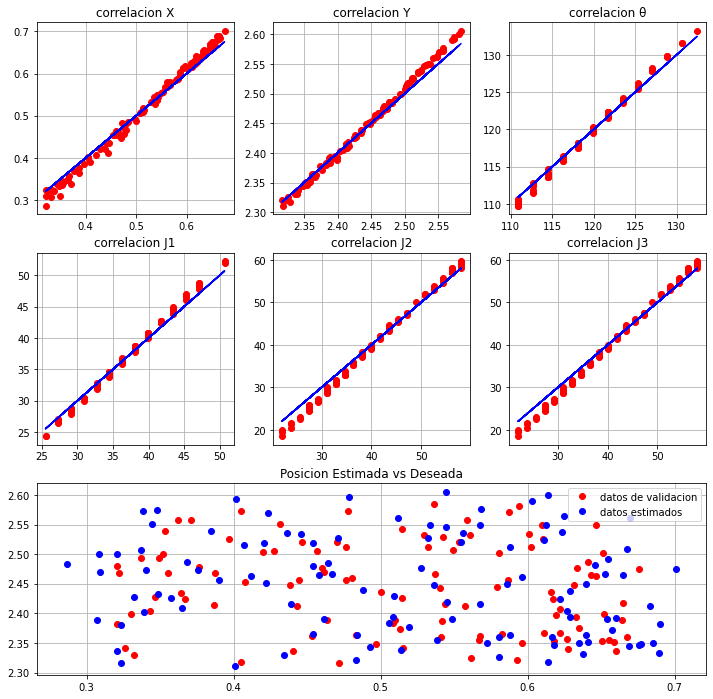


Red numero 1

capas ocultas: (5,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9962630503277468

MSE posicion:  [2.06776596e-04 8.90568273e-05 3.33971398e-01]
MAE posicion:  [0.01177104 0.0074936  0.49438005]
RMSE posicion:  [0.01437973 0.00943699 0.57790258]

MSE 2D posicion:  0.00029583342344905166
RMSE 2D posicion:  0.01719980882013087

MSE joints:  [0.62146279 2.3343088  1.42732429]
MAE joints:  [0.64532891 1.2814365  1.04279514]
RMSE joints:  [0.78832911 1.5278445  1.19470678]



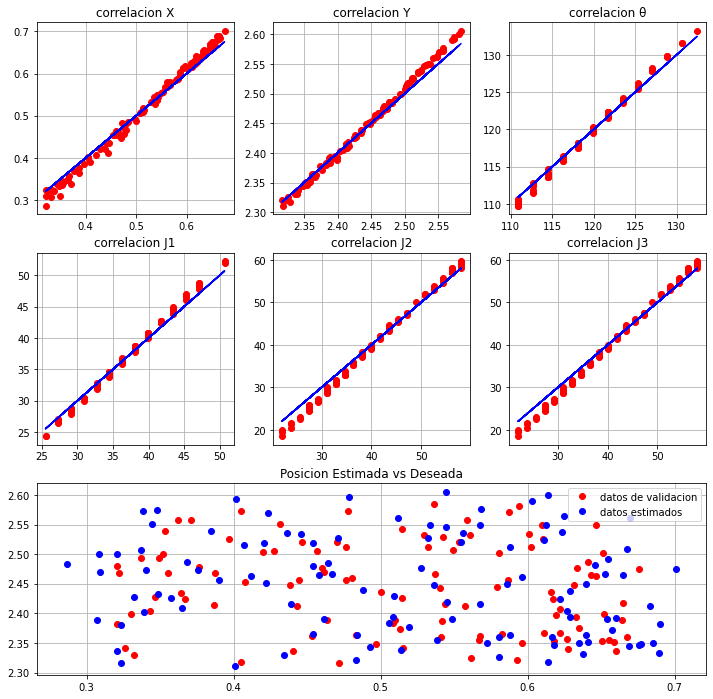


Red numero 2

capas ocultas: (5,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9962630503277468

MSE posicion:  [2.06776596e-04 8.90568273e-05 3.33971398e-01]
MAE posicion:  [0.01177104 0.0074936  0.49438005]
RMSE posicion:  [0.01437973 0.00943699 0.57790258]

MSE 2D posicion:  0.00029583342344905166
RMSE 2D posicion:  0.01719980882013087

MSE joints:  [0.62146279 2.3343088  1.42732429]
MAE joints:  [0.64532891 1.2814365  1.04279514]
RMSE joints:  [0.78832911 1.5278445  1.19470678]



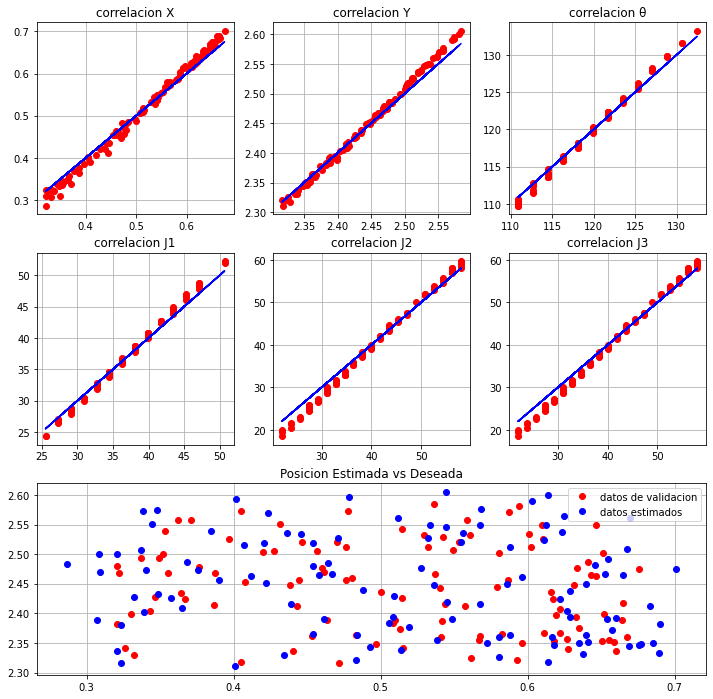


Red numero 3

capas ocultas: (5,)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9884102504591806

MSE posicion:  [9.34836844e-04 1.65263463e-04 1.17533770e+00]
MAE posicion:  [0.01863513 0.0107977  0.7138217 ]
RMSE posicion:  [0.0305751  0.01285548 1.08412993]

MSE 2D posicion:  0.0011001003071650938
RMSE 2D posicion:  0.033167760056493016

MSE joints:  [0.67090608 2.65768077 1.38283781]
MAE joints:  [0.6770753  1.37101367 1.02383059]
RMSE joints:  [0.81908857 1.63023948 1.17594124]



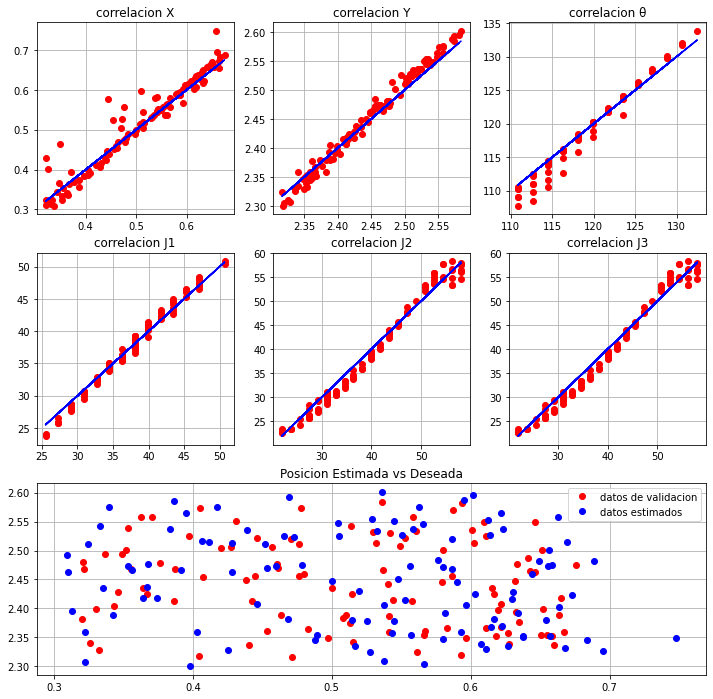


Red numero 4

capas ocultas: (5,)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9884102504591806

MSE posicion:  [9.34836844e-04 1.65263463e-04 1.17533770e+00]
MAE posicion:  [0.01863513 0.0107977  0.7138217 ]
RMSE posicion:  [0.0305751  0.01285548 1.08412993]

MSE 2D posicion:  0.0011001003071650938
RMSE 2D posicion:  0.033167760056493016

MSE joints:  [0.67090608 2.65768077 1.38283781]
MAE joints:  [0.6770753  1.37101367 1.02383059]
RMSE joints:  [0.81908857 1.63023948 1.17594124]



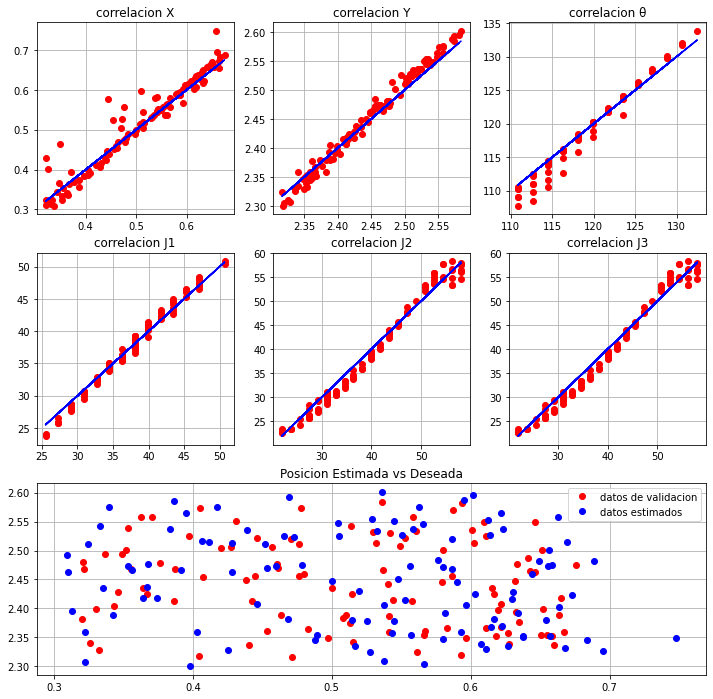


Red numero 5

capas ocultas: (5,)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9884102504591806

MSE posicion:  [9.34836844e-04 1.65263463e-04 1.17533770e+00]
MAE posicion:  [0.01863513 0.0107977  0.7138217 ]
RMSE posicion:  [0.0305751  0.01285548 1.08412993]

MSE 2D posicion:  0.0011001003071650938
RMSE 2D posicion:  0.033167760056493016

MSE joints:  [0.67090608 2.65768077 1.38283781]
MAE joints:  [0.6770753  1.37101367 1.02383059]
RMSE joints:  [0.81908857 1.63023948 1.17594124]



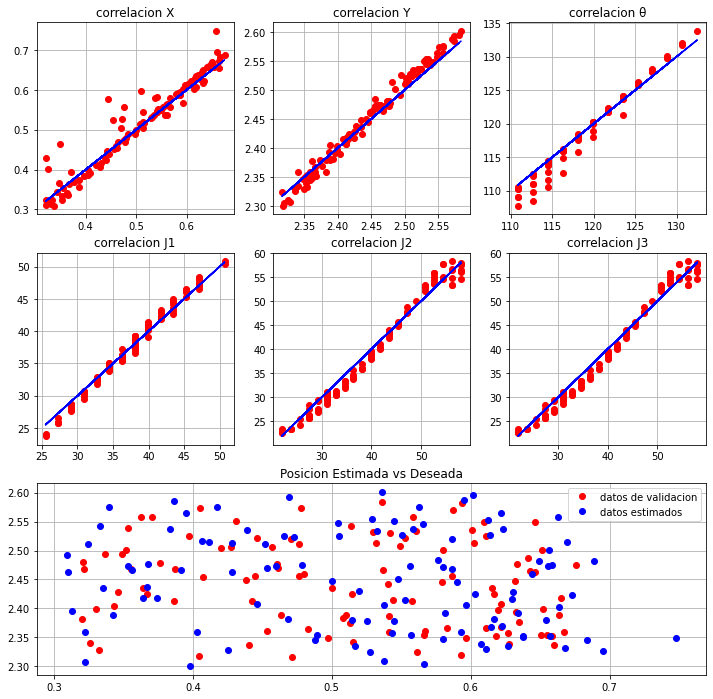


Red numero 6

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9896667722596586

MSE posicion:  [3.47523446e-04 1.21306801e-04 4.35409763e-01]
MAE posicion:  [0.01450456 0.00898062 0.54583551]
RMSE posicion:  [0.01864198 0.01101394 0.65985587]

MSE 2D posicion:  0.0004688302465001113
RMSE 2D posicion:  0.021652488228841305

MSE joints:  [0.66941651 1.86304348 1.19529221]
MAE joints:  [0.66329038 1.18981774 0.92742617]
RMSE joints:  [0.81817878 1.36493351 1.0932942 ]



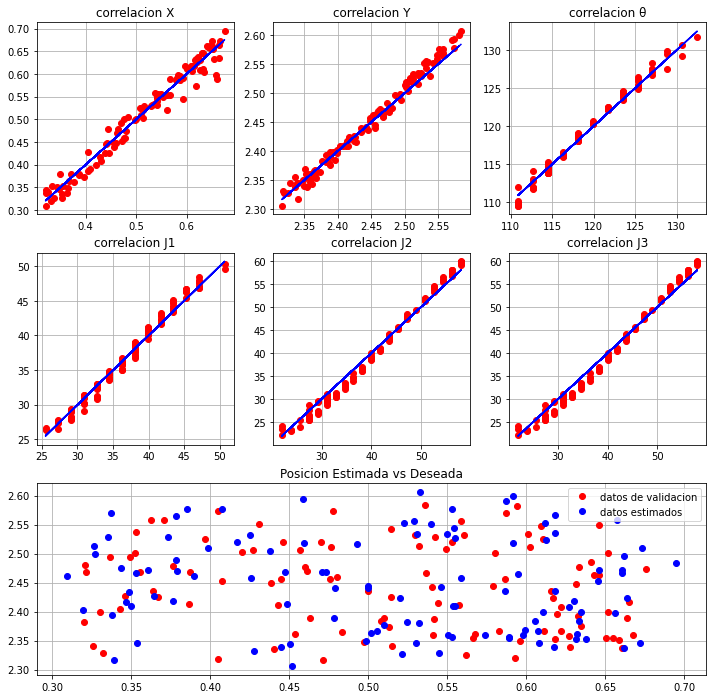


Red numero 7

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9727348306928906

MSE posicion:  [1.94897849e-03 3.30759913e-04 2.96965666e+00]
MAE posicion:  [0.03654508 0.01401045 1.46817989]
RMSE posicion:  [0.04414724 0.01818681 1.72326918]

MSE 2D posicion:  0.0022797384042471894
RMSE 2D posicion:  0.04774660620659011

MSE joints:  [1.67682897 2.13478009 2.89078517]
MAE joints:  [1.06769112 1.24224308 1.34750677]
RMSE joints:  [1.29492431 1.46108867 1.70023092]



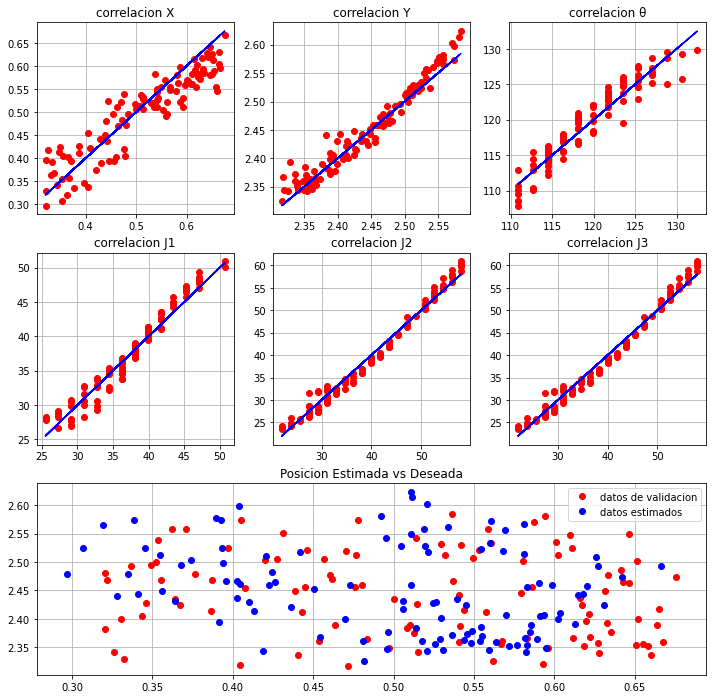


Red numero 8

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9122820247284755

MSE posicion:  [2.20996576e-02 4.89270190e-04 1.89693088e+01]
MAE posicion:  [0.12641428 0.01720981 3.72253648]
RMSE posicion:  [0.14865954 0.02211945 4.355377  ]

MSE 2D posicion:  0.022588927819458534
RMSE 2D posicion:  0.15029613374754033

MSE joints:  [ 2.47115929 13.87653075  2.74929286]
MAE joints:  [1.27193459 3.21211749 1.30798205]
RMSE joints:  [1.57199214 3.72512157 1.65809917]



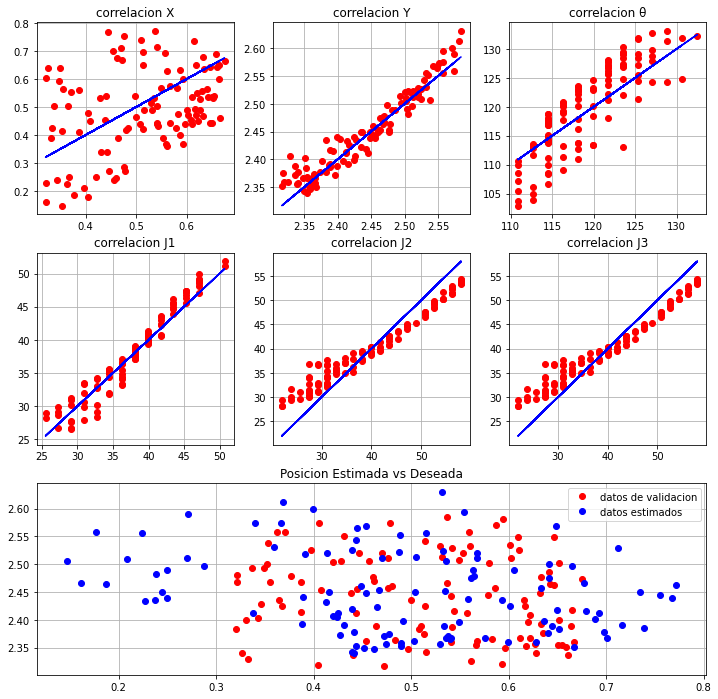


Red numero 9

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9849063647633205

MSE posicion:  [3.04872977e-04 1.79873197e-04 4.06810966e-01]
MAE posicion:  [0.01292252 0.01120045 0.52229407]
RMSE posicion:  [0.01746061 0.01341168 0.63781735]

MSE 2D posicion:  0.0004847461741006139
RMSE 2D posicion:  0.022016951971165623

MSE joints:  [1.12592039 3.29209616 1.83406178]
MAE joints:  [0.83531063 1.4538926  1.10750642]
RMSE joints:  [1.06109396 1.81441345 1.35427537]



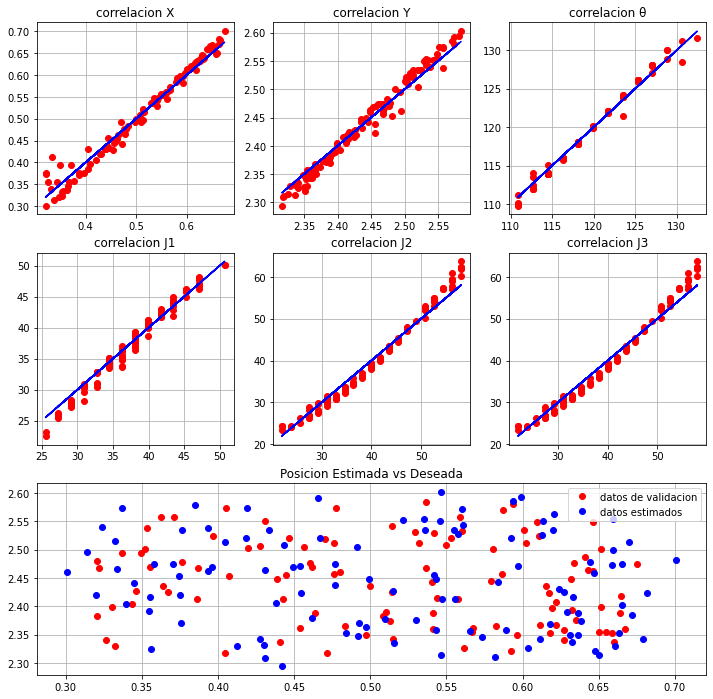


Red numero 10

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9787864013292275

MSE posicion:  [1.79246817e-03 1.52988802e-04 2.68218676e+00]
MAE posicion:  [0.02458428 0.01048525 1.07183819]
RMSE posicion:  [0.04233755 0.01236886 1.63773831]

MSE 2D posicion:  0.0019454569740394209
RMSE 2D posicion:  0.044107334696617304

MSE joints:  [1.60897172 3.09630347 2.77590358]
MAE joints:  [0.96137324 1.41172421 1.36980945]
RMSE joints:  [1.26845249 1.75963163 1.66610431]



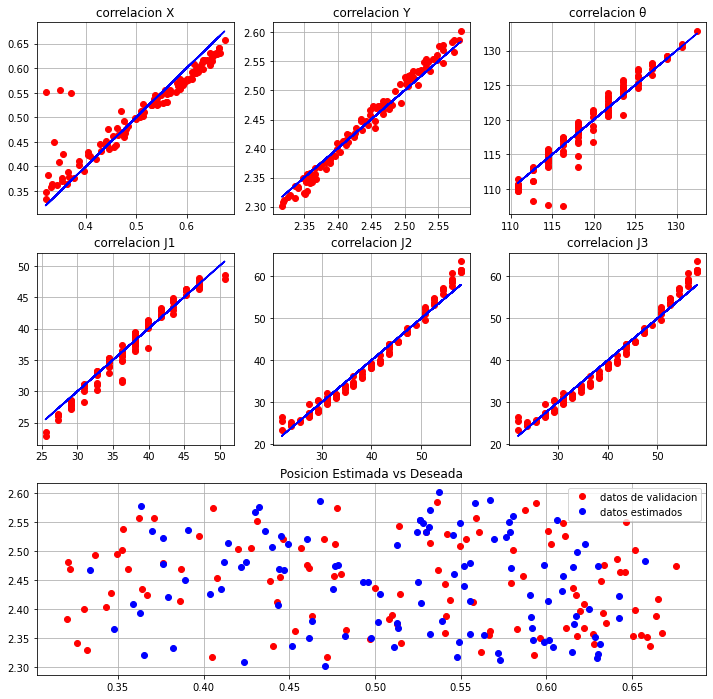


Red numero 11

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9352334788108712

MSE posicion:  [1.70964703e-02 1.94317825e-04 1.73322036e+01]
MAE posicion:  [0.09256785 0.01063614 2.81079243]
RMSE posicion:  [0.13075347 0.01393979 4.16319632]

MSE 2D posicion:  0.017290788152195157
RMSE 2D posicion:  0.13149444152584988

MSE joints:  [1.92904677 9.58791953 2.48216186]
MAE joints:  [0.95327315 2.53109248 0.96485558]
RMSE joints:  [1.38890128 3.09643659 1.57548782]



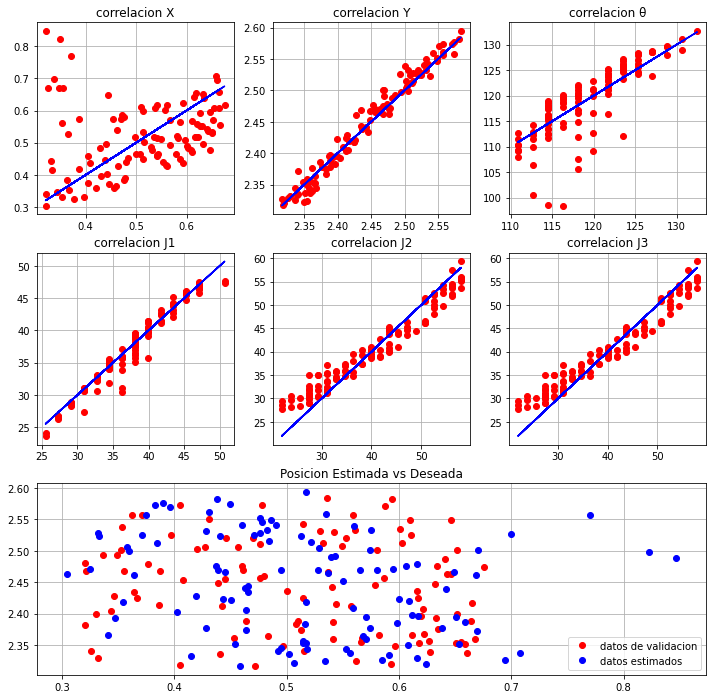


Red numero 12

capas ocultas: (5,)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9909962197926449

MSE posicion:  [9.18654158e-04 1.21626368e-04 1.30575133e+00]
MAE posicion:  [0.02320137 0.00900708 0.9393609 ]
RMSE posicion:  [0.03030931 0.01102843 1.14269477]

MSE 2D posicion:  0.001040280525495236
RMSE 2D posicion:  0.03225338006310712

MSE joints:  [0.49135534 1.65397782 1.42128576]
MAE joints:  [0.5539342  1.1307079  0.99770127]
RMSE joints:  [0.70096743 1.28607069 1.1921769 ]



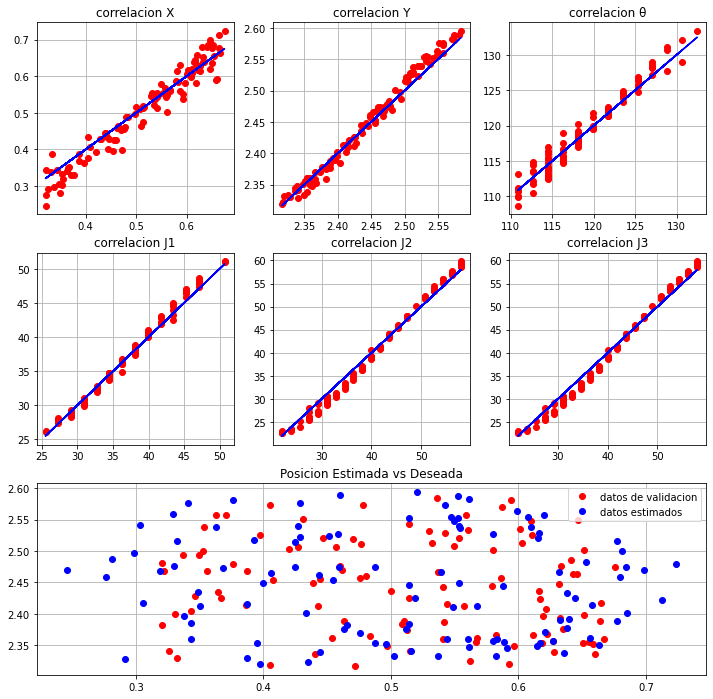


Red numero 13

capas ocultas: (5,)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9783402322900757

MSE posicion:  [1.21615307e-03 3.41600250e-04 1.38449019e+00]
MAE posicion:  [0.02634366 0.01490739 0.94562446]
RMSE posicion:  [0.03487339 0.01848243 1.17664361]

MSE 2D posicion:  0.00155775332178876
RMSE 2D posicion:  0.03946838382539574

MSE joints:  [1.02297302 3.08907691 2.45323602]
MAE joints:  [0.83562194 1.51526938 1.25338057]
RMSE joints:  [1.01142129 1.757577   1.56628095]



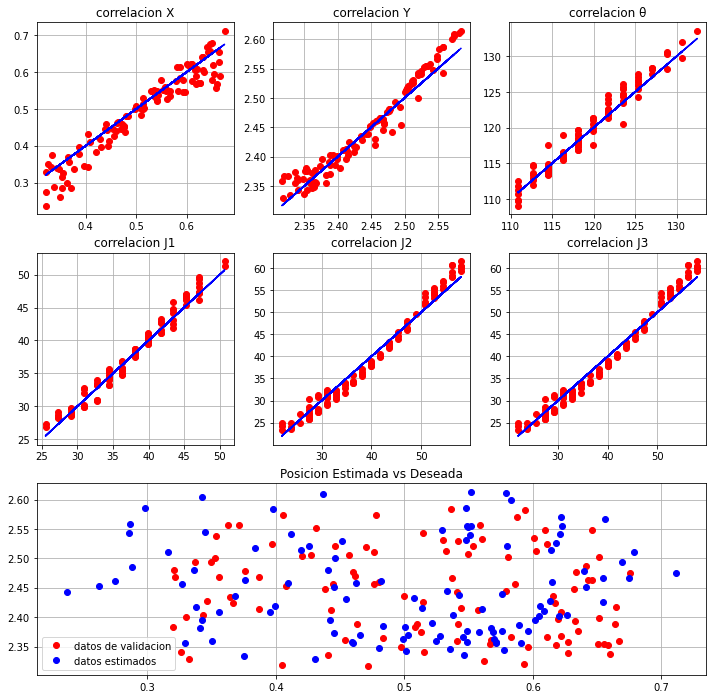


Red numero 14

capas ocultas: (5,)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9374633055379435

MSE posicion:  [1.60624388e-02 6.94156303e-04 1.83170571e+01]
MAE posicion:  [0.10880239 0.02043181 3.7526935 ]
RMSE posicion:  [0.12673768 0.02634685 4.27984311]

MSE 2D posicion:  0.016756595111771685
RMSE 2D posicion:  0.1294472676875479

MSE joints:  [1.84205256 8.67917784 3.44153643]
MAE joints:  [1.09186159 2.46998531 1.51921677]
RMSE joints:  [1.35722237 2.94604444 1.85513785]



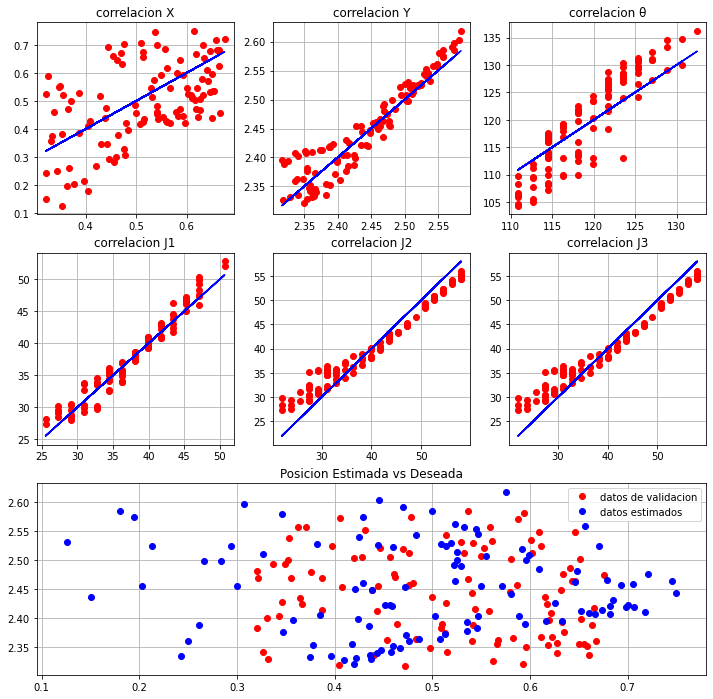


Red numero 15

capas ocultas: (5,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9879518796160189

MSE posicion:  [1.53644864e-03 1.93101013e-04 1.60207070e+00]
MAE posicion:  [0.02602909 0.0109475  0.73854736]
RMSE posicion:  [0.03919756 0.01389608 1.26572932]

MSE 2D posicion:  0.0017295496555391299
RMSE 2D posicion:  0.04158785466382138

MSE joints:  [0.82325312 2.67704466 1.32760776]
MAE joints:  [0.75284983 1.38996364 0.98423397]
RMSE joints:  [0.90733297 1.63616767 1.15221862]



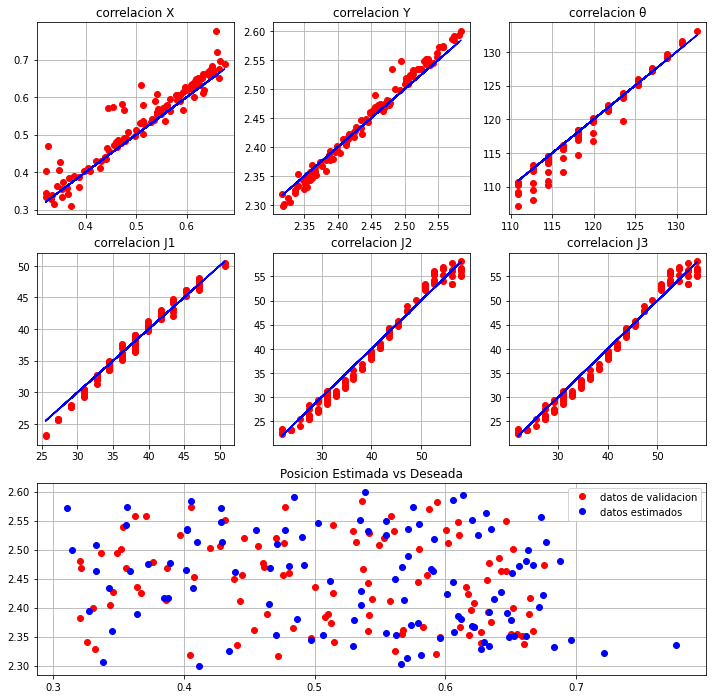


Red numero 16

capas ocultas: (5,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9858220773568195

MSE posicion:  [1.39555081e-04 1.65152514e-04 4.02205279e-01]
MAE posicion:  [0.00984279 0.01074459 0.53909592]
RMSE posicion:  [0.01181334 0.01285117 0.63419656]

MSE 2D posicion:  0.0003047075952939974
RMSE 2D posicion:  0.017455875666777573

MSE joints:  [1.05682906 3.88419418 1.98363247]
MAE joints:  [0.82417292 1.59152265 1.17882281]
RMSE joints:  [1.02802192 1.97083591 1.40841488]



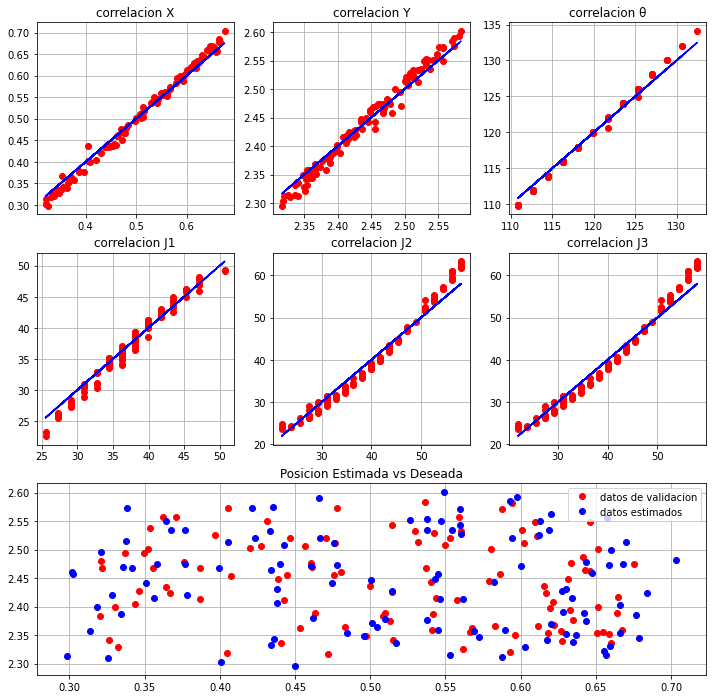


Red numero 17

capas ocultas: (5,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.979107076064157

MSE posicion:  [9.79286924e-04 1.48235677e-04 1.46109809e+00]
MAE posicion:  [0.02120451 0.0101811  0.96464346]
RMSE posicion:  [0.03129356 0.01217521 1.2087589 ]

MSE 2D posicion:  0.001127522601430483
RMSE 2D posicion:  0.0335786033275728

MSE joints:  [1.36126198 3.33892752 2.30575215]
MAE joints:  [0.92080726 1.40800168 1.22870977]
RMSE joints:  [1.16673132 1.82727325 1.51847033]



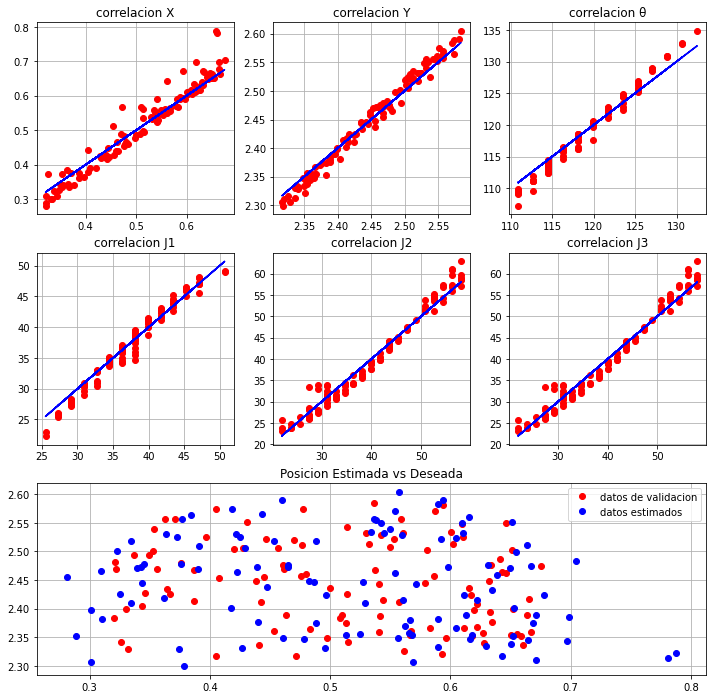


Red numero 18

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9961672718733113

MSE posicion:  [1.55733413e-04 9.33708836e-05 3.48601562e-01]
MAE posicion:  [0.01042965 0.00789371 0.49646804]
RMSE posicion:  [0.01247932 0.00966286 0.5904249 ]

MSE 2D posicion:  0.00024910429614825923
RMSE 2D posicion:  0.015783038241994448

MSE joints:  [0.70002033 2.31106152 1.49791539]
MAE joints:  [0.67013842 1.2542969  1.08615841]
RMSE joints:  [0.83667218 1.52021759 1.22389354]



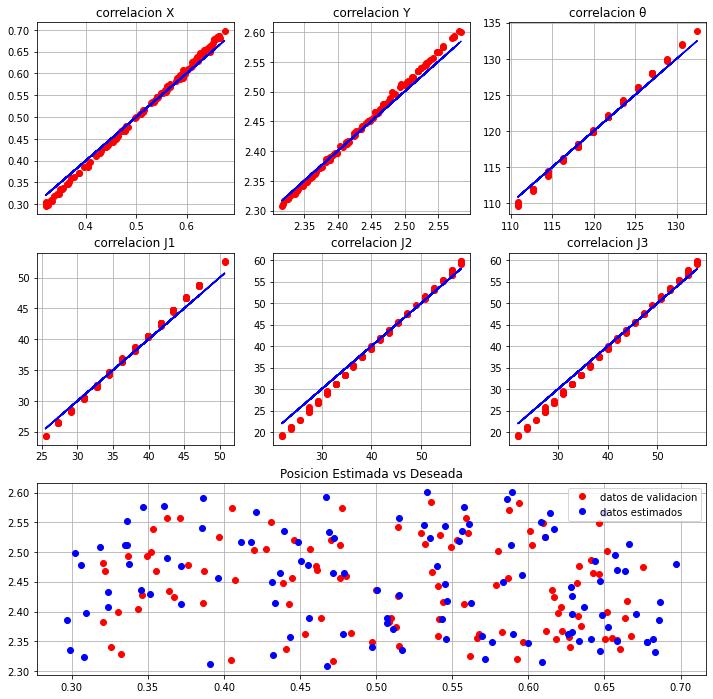


Red numero 19

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9961672718733113

MSE posicion:  [1.55733413e-04 9.33708836e-05 3.48601562e-01]
MAE posicion:  [0.01042965 0.00789371 0.49646804]
RMSE posicion:  [0.01247932 0.00966286 0.5904249 ]

MSE 2D posicion:  0.00024910429614825923
RMSE 2D posicion:  0.015783038241994448

MSE joints:  [0.70002033 2.31106152 1.49791539]
MAE joints:  [0.67013842 1.2542969  1.08615841]
RMSE joints:  [0.83667218 1.52021759 1.22389354]



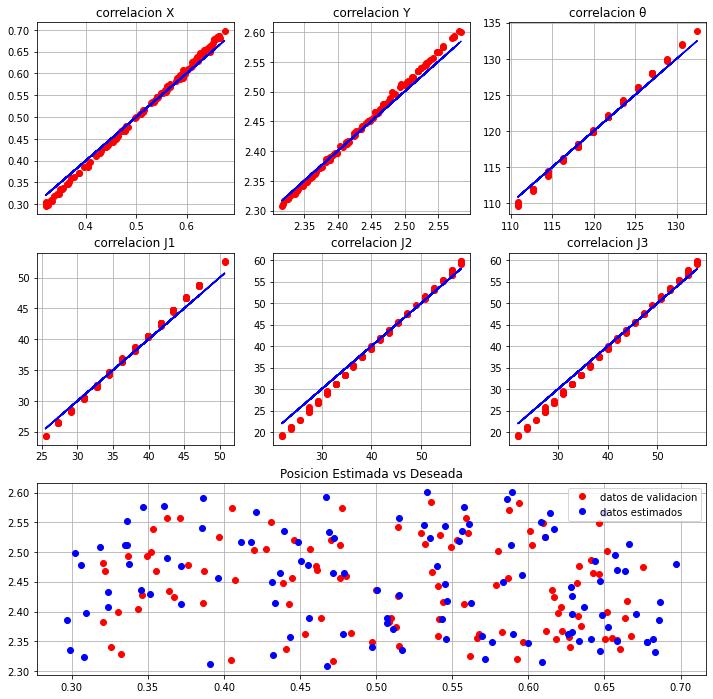


Red numero 20

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9961672718733113

MSE posicion:  [1.55733413e-04 9.33708836e-05 3.48601562e-01]
MAE posicion:  [0.01042965 0.00789371 0.49646804]
RMSE posicion:  [0.01247932 0.00966286 0.5904249 ]

MSE 2D posicion:  0.00024910429614825923
RMSE 2D posicion:  0.015783038241994448

MSE joints:  [0.70002033 2.31106152 1.49791539]
MAE joints:  [0.67013842 1.2542969  1.08615841]
RMSE joints:  [0.83667218 1.52021759 1.22389354]



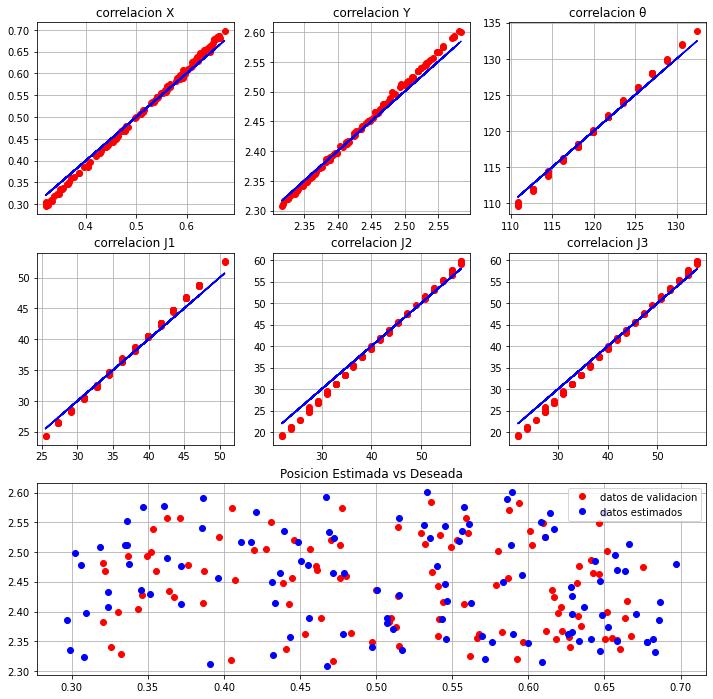


Red numero 21

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9953753791481956

MSE posicion:  [1.78281156e-04 1.16302043e-04 3.28294760e-01]
MAE posicion:  [0.01108207 0.00881688 0.47102841]
RMSE posicion:  [0.0133522  0.01078434 0.57297012]

MSE 2D posicion:  0.00029458319921975344
RMSE 2D posicion:  0.01716342620864941

MSE joints:  [0.66073115 2.40822752 1.56736896]
MAE joints:  [0.69206687 1.33623943 1.05346575]
RMSE joints:  [0.81285371 1.55184649 1.25194607]



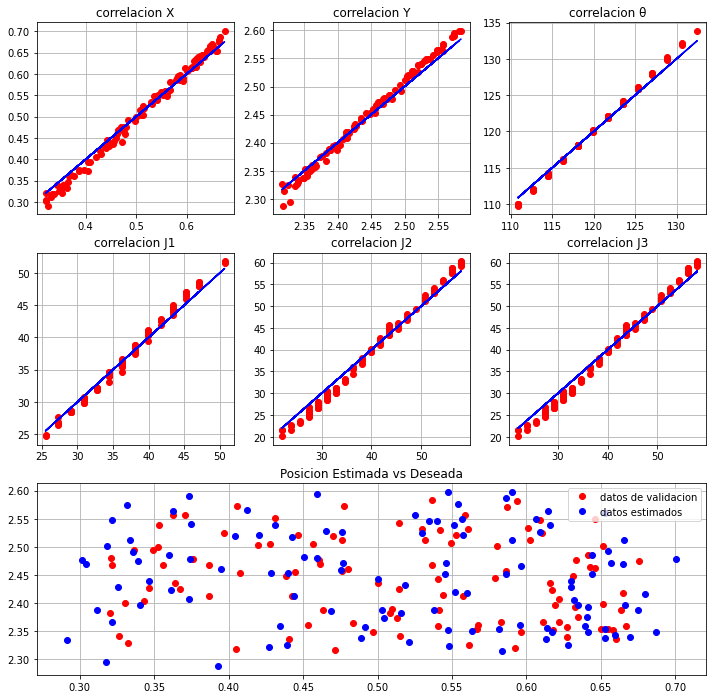


Red numero 22

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9953753791481956

MSE posicion:  [1.78281156e-04 1.16302043e-04 3.28294760e-01]
MAE posicion:  [0.01108207 0.00881688 0.47102841]
RMSE posicion:  [0.0133522  0.01078434 0.57297012]

MSE 2D posicion:  0.00029458319921975344
RMSE 2D posicion:  0.01716342620864941

MSE joints:  [0.66073115 2.40822752 1.56736896]
MAE joints:  [0.69206687 1.33623943 1.05346575]
RMSE joints:  [0.81285371 1.55184649 1.25194607]



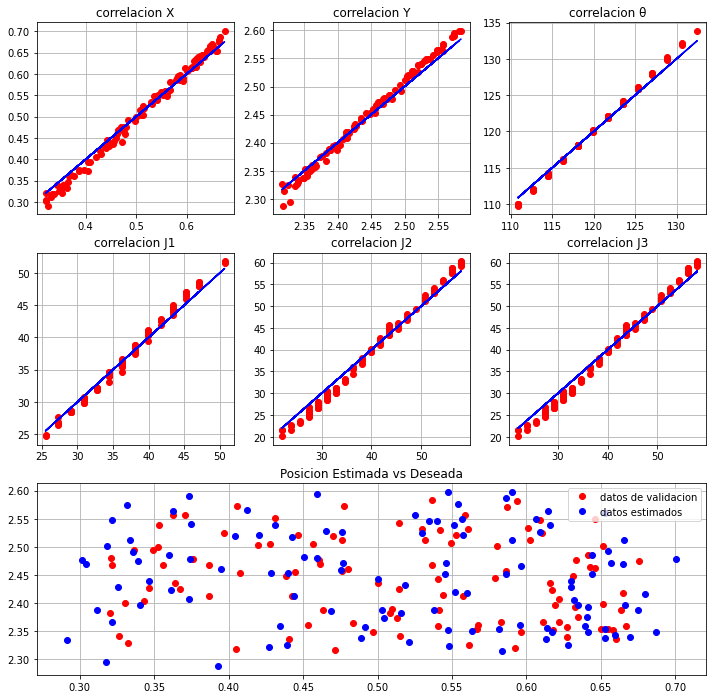


Red numero 23

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9953753791481956

MSE posicion:  [1.78281156e-04 1.16302043e-04 3.28294760e-01]
MAE posicion:  [0.01108207 0.00881688 0.47102841]
RMSE posicion:  [0.0133522  0.01078434 0.57297012]

MSE 2D posicion:  0.00029458319921975344
RMSE 2D posicion:  0.01716342620864941

MSE joints:  [0.66073115 2.40822752 1.56736896]
MAE joints:  [0.69206687 1.33623943 1.05346575]
RMSE joints:  [0.81285371 1.55184649 1.25194607]



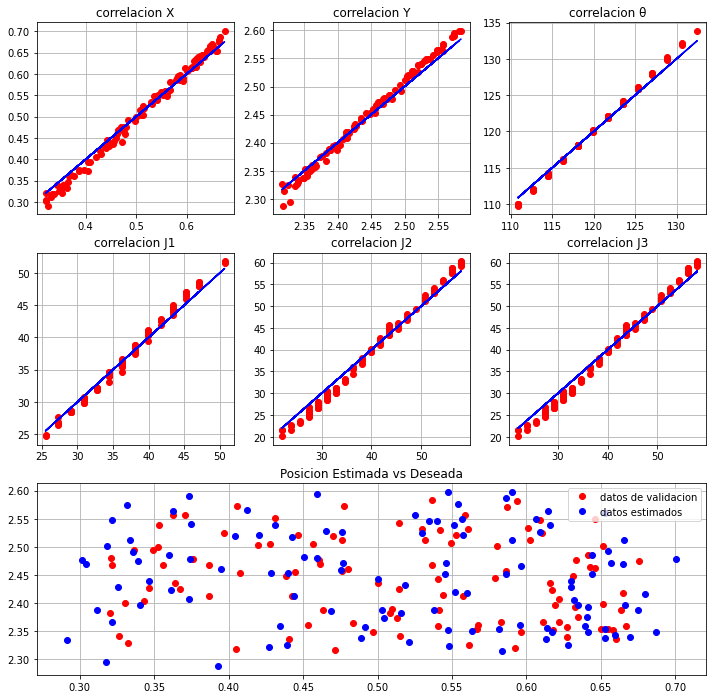


Red numero 24

capas ocultas: (10,)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9861554956008413

MSE posicion:  [9.08210963e-04 1.69199178e-04 1.22401673e+00]
MAE posicion:  [0.02336573 0.01118844 0.84628466]
RMSE posicion:  [0.03013654 0.01300766 1.1063529 ]

MSE 2D posicion:  0.001077410141040134
RMSE 2D posicion:  0.03282392635015095

MSE joints:  [1.23508092 3.11442937 1.99849814]
MAE joints:  [0.92296097 1.47187899 1.13958567]
RMSE joints:  [1.11134194 1.7647746  1.41368247]



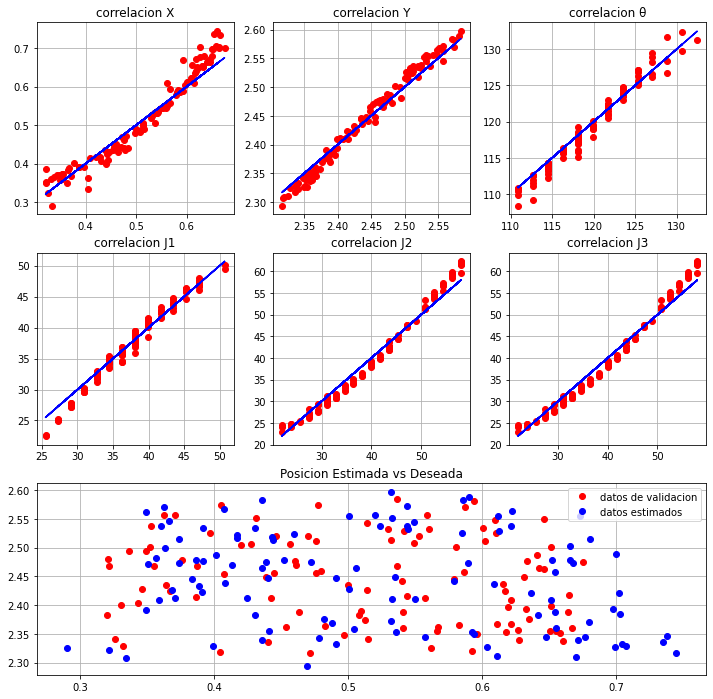


Red numero 25

capas ocultas: (10,)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9741292959587179

MSE posicion:  [3.32015196e-03 2.31020477e-04 4.07444002e+00]
MAE posicion:  [0.04596499 0.01305126 1.53754065]
RMSE posicion:  [0.05762076 0.01519936 2.01852422]

MSE 2D posicion:  0.0035511724335885483
RMSE 2D posicion:  0.059591714470961045

MSE joints:  [2.17597411 3.72670322 3.09829888]
MAE joints:  [1.20964796 1.57686143 1.41960519]
RMSE joints:  [1.47511834 1.9304671  1.76019853]



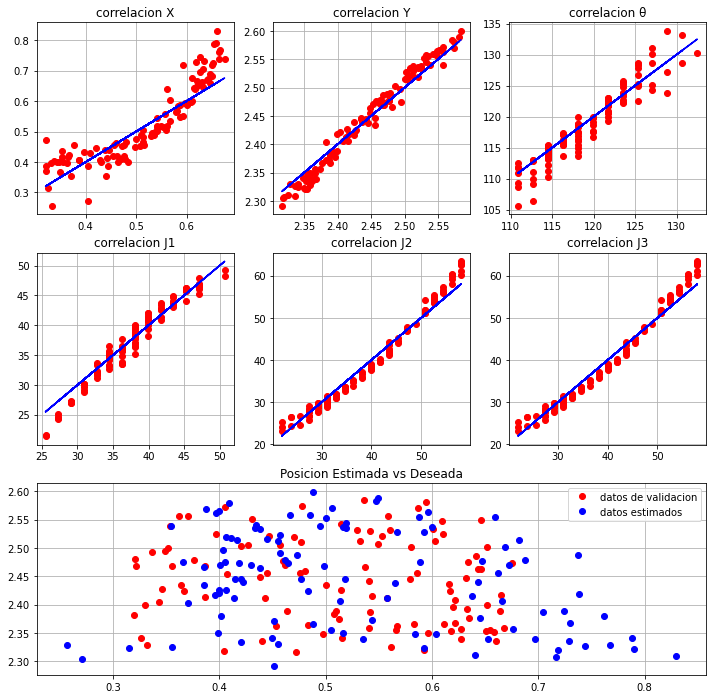


Red numero 26

capas ocultas: (10,)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.938938530103479

MSE posicion:  [6.37622937e-03 2.31981932e-04 6.13288921e+00]
MAE posicion:  [0.06545045 0.01296936 1.96424544]
RMSE posicion:  [0.0798513  0.01523095 2.47646708]

MSE 2D posicion:  0.006608211302077433
RMSE 2D posicion:  0.08129090540815395

MSE joints:  [2.21756315 6.37883233 2.53798556]
MAE joints:  [1.18194515 2.00003662 1.24453535]
RMSE joints:  [1.48914847 2.52563503 1.59310563]



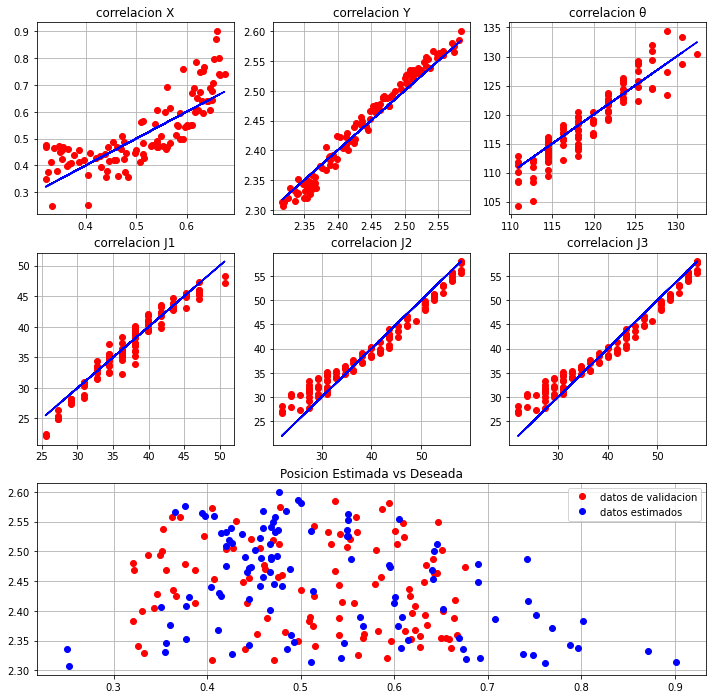


Red numero 27

capas ocultas: (10,)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9870383049821637

MSE posicion:  [6.35452221e-04 1.55206981e-04 5.96595078e-01]
MAE posicion:  [0.01526095 0.0105173  0.58097202]
RMSE posicion:  [0.02520818 0.01245821 0.77239567]

MSE 2D posicion:  0.0007906592026536807
RMSE 2D posicion:  0.028118662888794707

MSE joints:  [0.9103509  3.88714136 1.87496879]
MAE joints:  [0.76023072 1.60533714 1.14763854]
RMSE joints:  [0.95412311 1.97158346 1.369295  ]



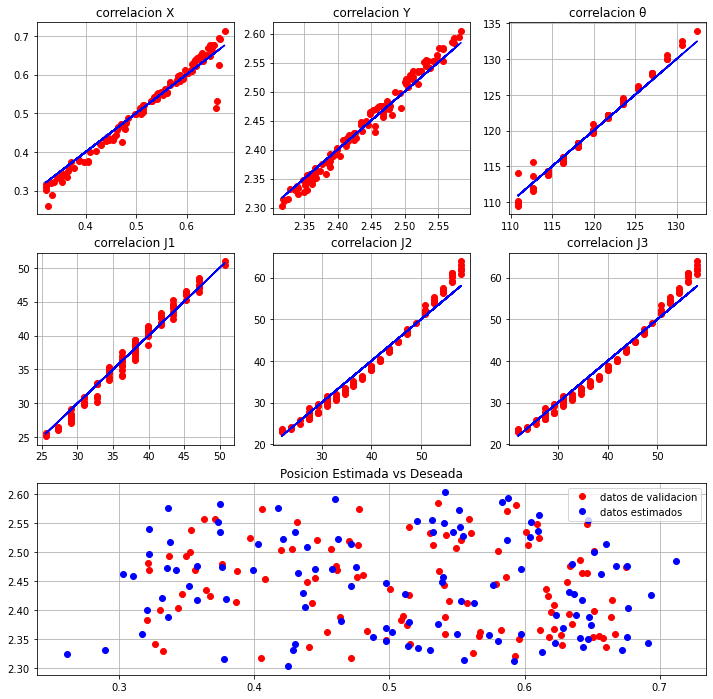


Red numero 28

capas ocultas: (10,)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9813463239216015

MSE posicion:  [1.68408057e-03 1.64269436e-04 1.61517901e+00]
MAE posicion:  [0.03038299 0.01073903 0.98465964]
RMSE posicion:  [0.04103755 0.01281676 1.27089693]

MSE 2D posicion:  0.001848350002427136
RMSE 2D posicion:  0.04299244122432612

MSE joints:  [1.06708621 4.2806574  2.32715736]
MAE joints:  [0.80795319 1.65526311 1.21720533]
RMSE joints:  [1.03299865 2.06897496 1.52550233]



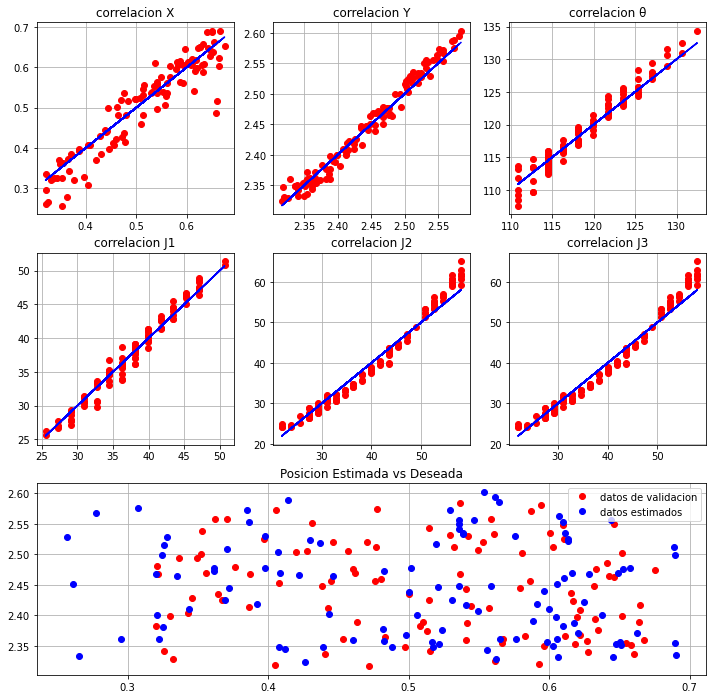


Red numero 29

capas ocultas: (10,)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9462633652222529

MSE posicion:  [7.37734306e-03 2.98732752e-04 6.42744146e+00]
MAE posicion:  [0.06913235 0.01457508 2.00157689]
RMSE posicion:  [0.08589146 0.01728389 2.53523992]

MSE 2D posicion:  0.0076760758079689574
RMSE 2D posicion:  0.08761321708491794

MSE joints:  [0.98013503 8.40070474 1.24601566]
MAE joints:  [0.80975494 2.44944772 0.887647  ]
RMSE joints:  [0.99001769 2.89839693 1.11625071]



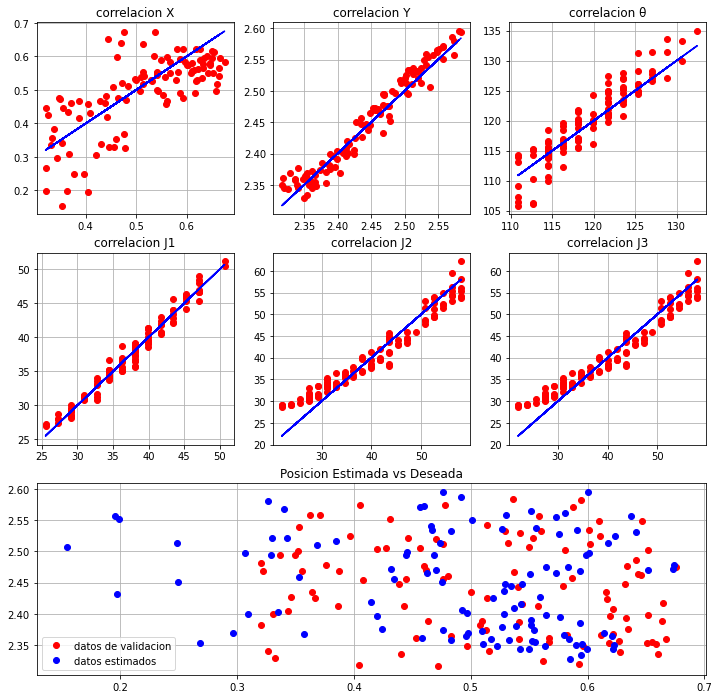


Red numero 30

capas ocultas: (10,)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9914502666039039

MSE posicion:  [2.42596514e-04 1.15069351e-04 3.54002288e-01]
MAE posicion:  [0.01250079 0.00867751 0.50863756]
RMSE posicion:  [0.01557551 0.01072704 0.59498091]

MSE 2D posicion:  0.0003576658649349372
RMSE 2D posicion:  0.01891205607370434

MSE joints:  [0.6119597  2.03917752 1.60972176]
MAE joints:  [0.63731208 1.26851255 1.0536295 ]
RMSE joints:  [0.78227853 1.42799773 1.26874811]



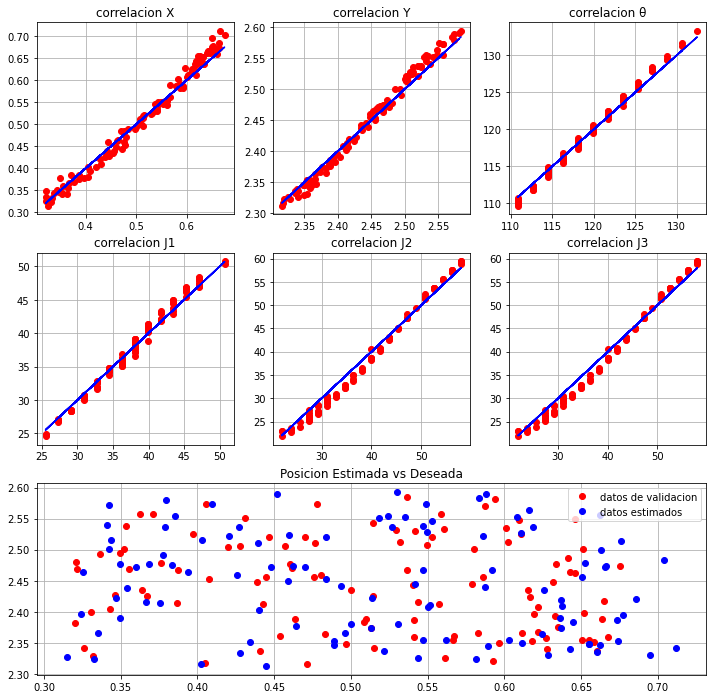


Red numero 31

capas ocultas: (10,)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9790043559426888

MSE posicion:  [2.88893452e-03 1.77819738e-04 3.48115317e+00]
MAE posicion:  [0.04223093 0.01125823 1.42734548]
RMSE posicion:  [0.05374881 0.01333491 1.86578487]

MSE 2D posicion:  0.003066754261350534
RMSE 2D posicion:  0.05537828330086203

MSE joints:  [1.50125952 3.93223983 2.65473189]
MAE joints:  [0.99169614 1.61724836 1.31198255]
RMSE joints:  [1.22525896 1.9829876  1.6293348 ]



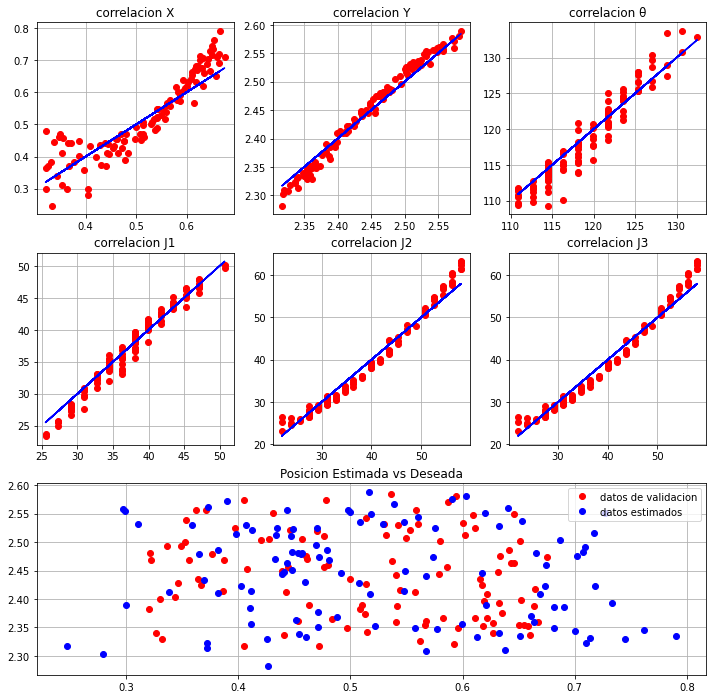


Red numero 32

capas ocultas: (10,)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.968312976630669

MSE posicion:  [5.87310242e-03 1.89222822e-04 6.57470569e+00]
MAE posicion:  [0.05988816 0.0117621  1.9494782 ]
RMSE posicion:  [0.07663617 0.01375583 2.56411889]

MSE 2D posicion:  0.0060623252462792205
RMSE 2D posicion:  0.07786093530313658

MSE joints:  [2.05026786 3.21465593 2.84311551]
MAE joints:  [1.17849309 1.40603338 1.37900827]
RMSE joints:  [1.43187564 1.79294616 1.68615406]



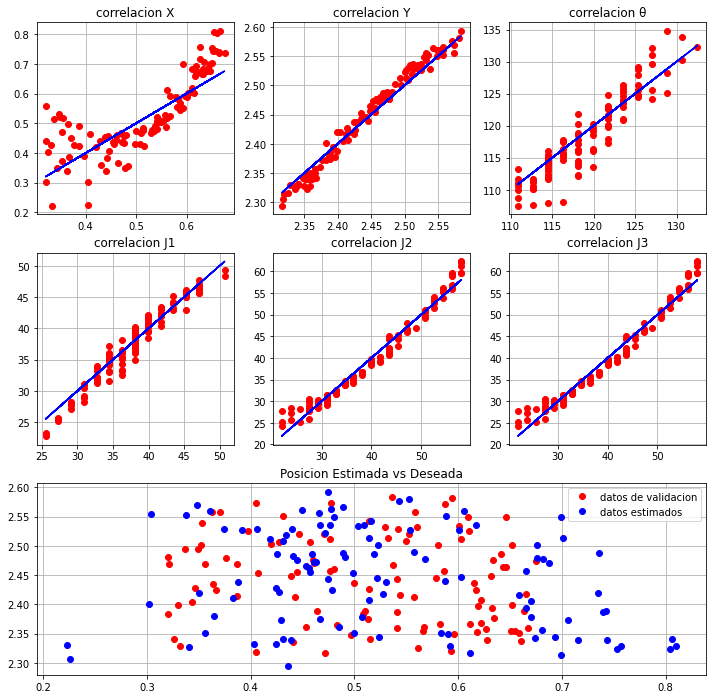


Red numero 33

capas ocultas: (10,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9958579930642628

MSE posicion:  [2.21112245e-04 8.81100798e-05 3.17831921e-01]
MAE posicion:  [0.01159702 0.00766455 0.44355127]
RMSE posicion:  [0.01486984 0.0093867  0.56376584]

MSE 2D posicion:  0.00030922232451333667
RMSE 2D posicion:  0.017584718494003157

MSE joints:  [0.63843024 2.46951559 1.27478587]
MAE joints:  [0.68007088 1.33501565 0.99537132]
RMSE joints:  [0.7990183  1.57146925 1.12906416]



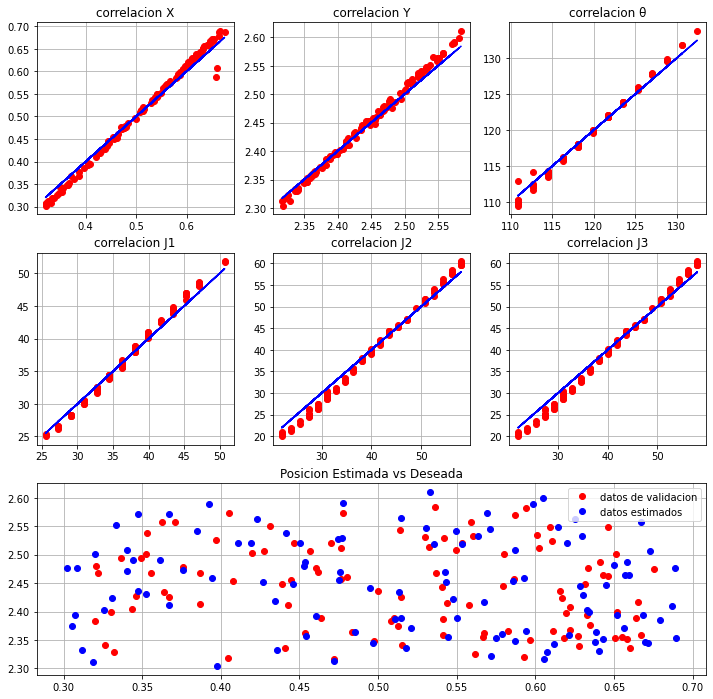


Red numero 34

capas ocultas: (10,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9839668339933647

MSE posicion:  [1.23922168e-03 1.80990128e-04 1.31467657e+00]
MAE posicion:  [0.02666744 0.01109644 0.87862471]
RMSE posicion:  [0.03520258 0.01345326 1.14659346]

MSE 2D posicion:  0.001420211807467184
RMSE 2D posicion:  0.037685697651326344

MSE joints:  [1.09091017 3.59658658 1.93781486]
MAE joints:  [0.84075226 1.50279335 1.14618146]
RMSE joints:  [1.04446645 1.89646687 1.39205419]



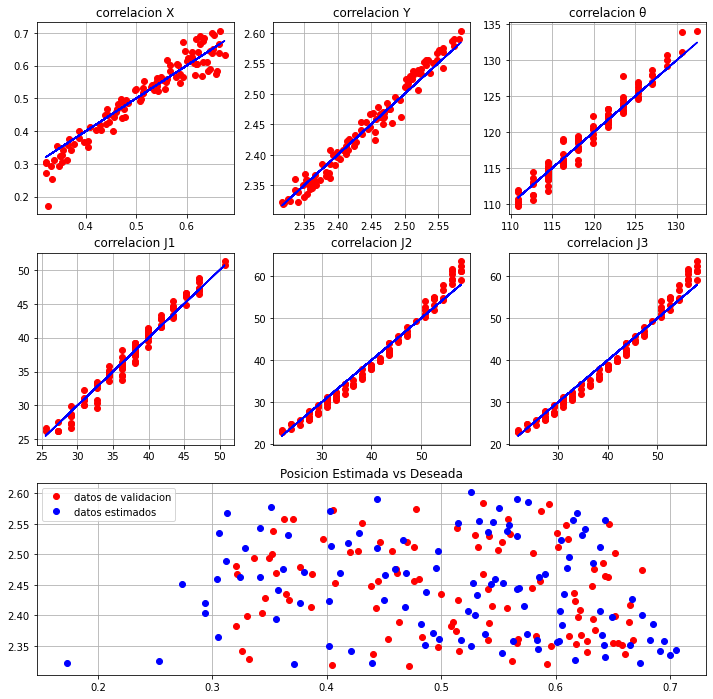


Red numero 35

capas ocultas: (10,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9439870166514718

MSE posicion:  [5.93188180e-03 4.86748279e-04 6.16076140e+00]
MAE posicion:  [0.06032916 0.01714946 1.97256471]
RMSE posicion:  [0.07701871 0.02206237 2.48208811]

MSE 2D posicion:  0.006418630079654447
RMSE 2D posicion:  0.08011635338465205

MSE joints:  [ 2.04425397 11.16747649  4.66169689]
MAE joints:  [1.15856374 2.7034697  1.71987232]
RMSE joints:  [1.4297741  3.34177744 2.15909631]



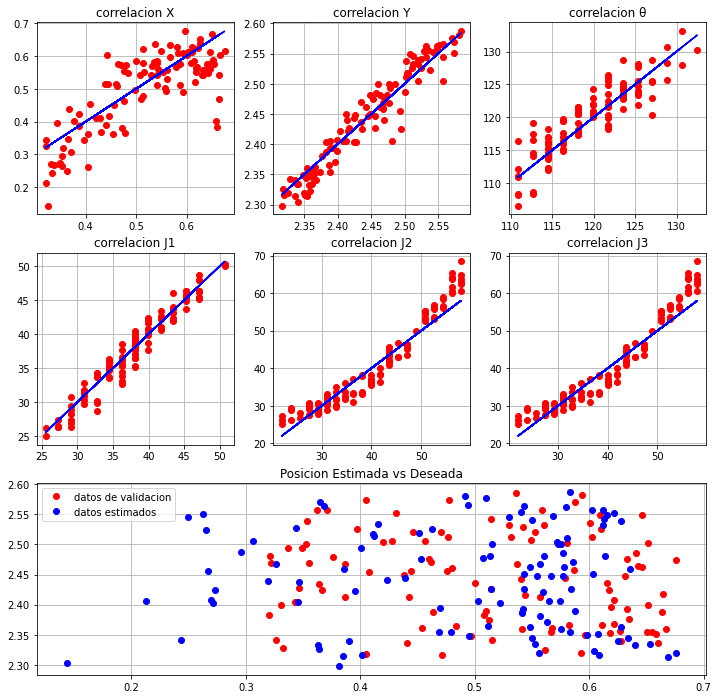


Red numero 36

capas ocultas: (5, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9961709789223212

MSE posicion:  [1.44803129e-04 8.75226691e-05 3.67443990e-01]
MAE posicion:  [0.00948752 0.00745513 0.53384269]
RMSE posicion:  [0.01203342 0.00935536 0.60617158]

MSE 2D posicion:  0.000232325797993884
RMSE 2D posicion:  0.015242237302767726

MSE joints:  [0.66823007 2.52461166 1.5407693 ]
MAE joints:  [0.65879056 1.30662622 1.09650588]
RMSE joints:  [0.81745341 1.58890266 1.24127729]



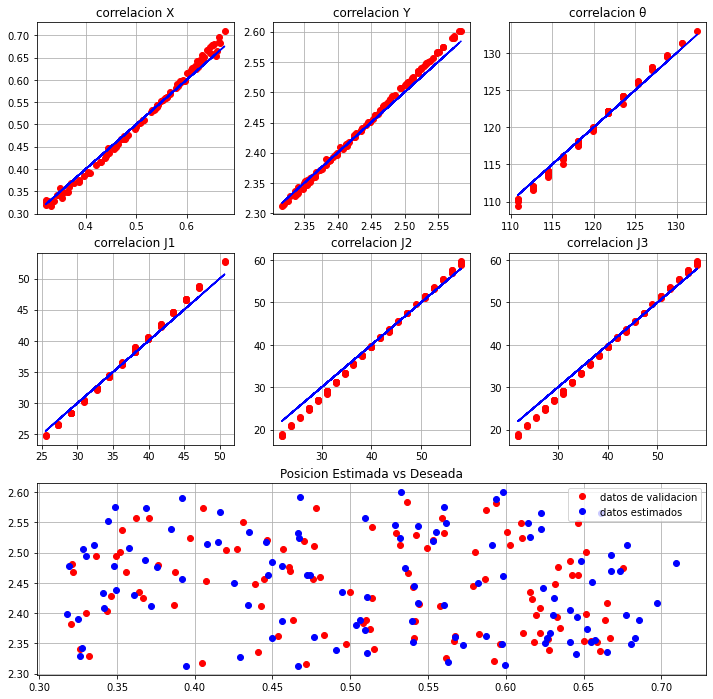


Red numero 37

capas ocultas: (5, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9961709789223212

MSE posicion:  [1.44803129e-04 8.75226691e-05 3.67443990e-01]
MAE posicion:  [0.00948752 0.00745513 0.53384269]
RMSE posicion:  [0.01203342 0.00935536 0.60617158]

MSE 2D posicion:  0.000232325797993884
RMSE 2D posicion:  0.015242237302767726

MSE joints:  [0.66823007 2.52461166 1.5407693 ]
MAE joints:  [0.65879056 1.30662622 1.09650588]
RMSE joints:  [0.81745341 1.58890266 1.24127729]



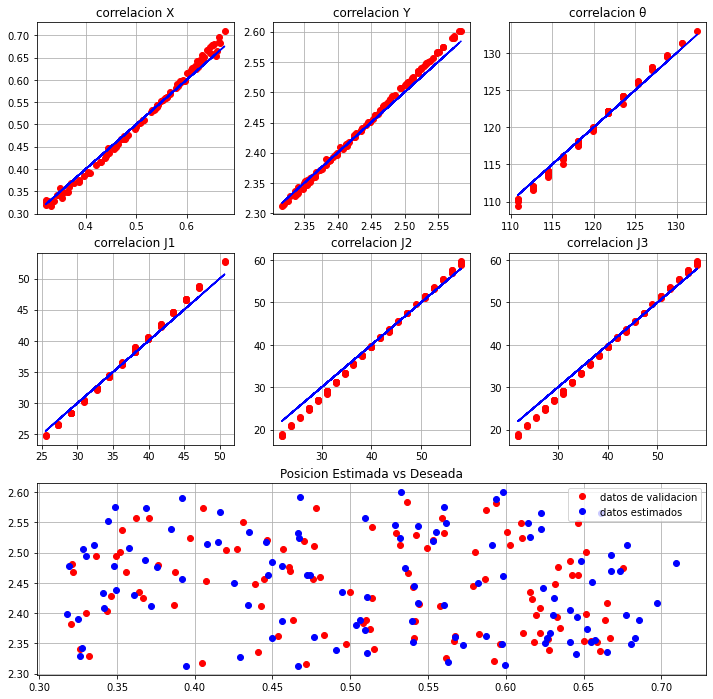


Red numero 38

capas ocultas: (5, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9961709789223212

MSE posicion:  [1.44803129e-04 8.75226691e-05 3.67443990e-01]
MAE posicion:  [0.00948752 0.00745513 0.53384269]
RMSE posicion:  [0.01203342 0.00935536 0.60617158]

MSE 2D posicion:  0.000232325797993884
RMSE 2D posicion:  0.015242237302767726

MSE joints:  [0.66823007 2.52461166 1.5407693 ]
MAE joints:  [0.65879056 1.30662622 1.09650588]
RMSE joints:  [0.81745341 1.58890266 1.24127729]



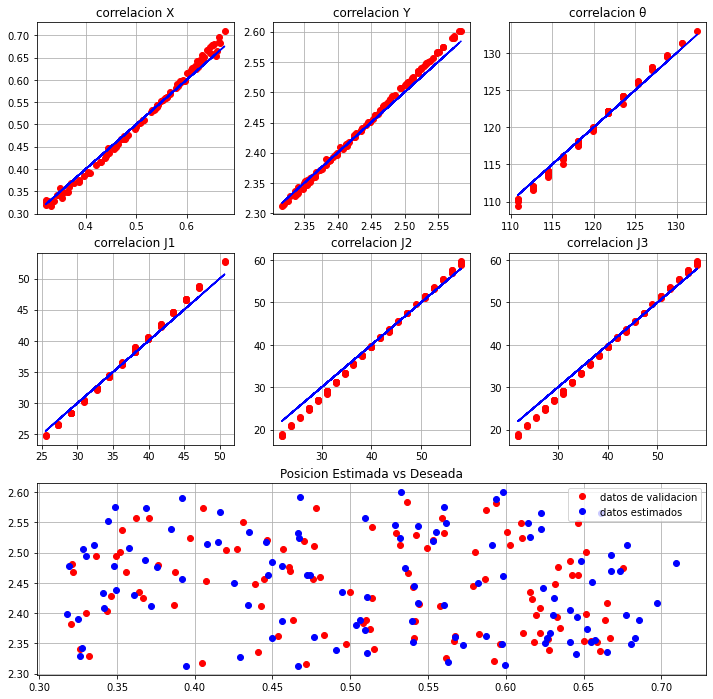


Red numero 39

capas ocultas: (5, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9875222341963775

MSE posicion:  [1.61430224e-03 1.81350361e-04 1.86549787e+00]
MAE posicion:  [0.02325183 0.01150701 0.84471534]
RMSE posicion:  [0.04017838 0.01346664 1.3658323 ]

MSE 2D posicion:  0.0017956525994078064
RMSE 2D posicion:  0.042375141290712015

MSE joints:  [0.72622223 2.91635067 1.39570849]
MAE joints:  [0.70869604 1.41072061 1.03251076]
RMSE joints:  [0.85218673 1.70773261 1.18140107]



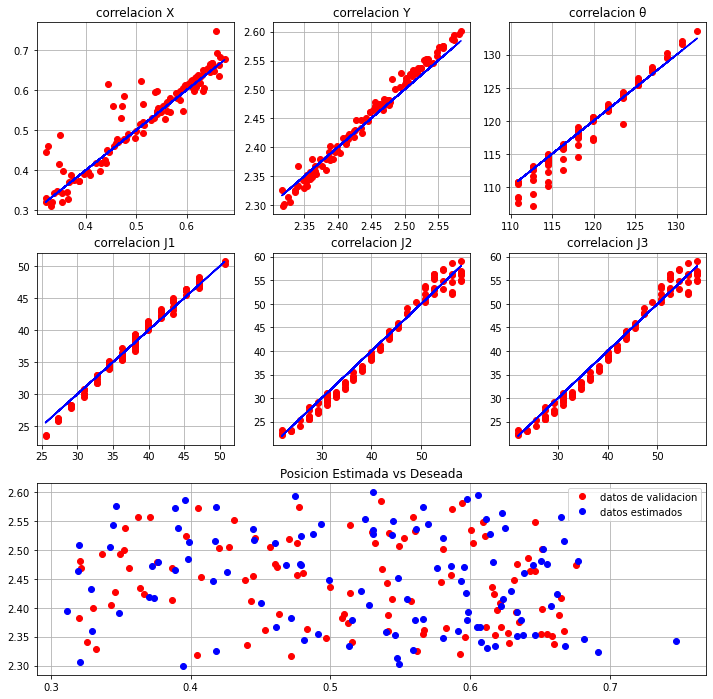


Red numero 40

capas ocultas: (5, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9875222341963775

MSE posicion:  [1.61430224e-03 1.81350361e-04 1.86549787e+00]
MAE posicion:  [0.02325183 0.01150701 0.84471534]
RMSE posicion:  [0.04017838 0.01346664 1.3658323 ]

MSE 2D posicion:  0.0017956525994078064
RMSE 2D posicion:  0.042375141290712015

MSE joints:  [0.72622223 2.91635067 1.39570849]
MAE joints:  [0.70869604 1.41072061 1.03251076]
RMSE joints:  [0.85218673 1.70773261 1.18140107]



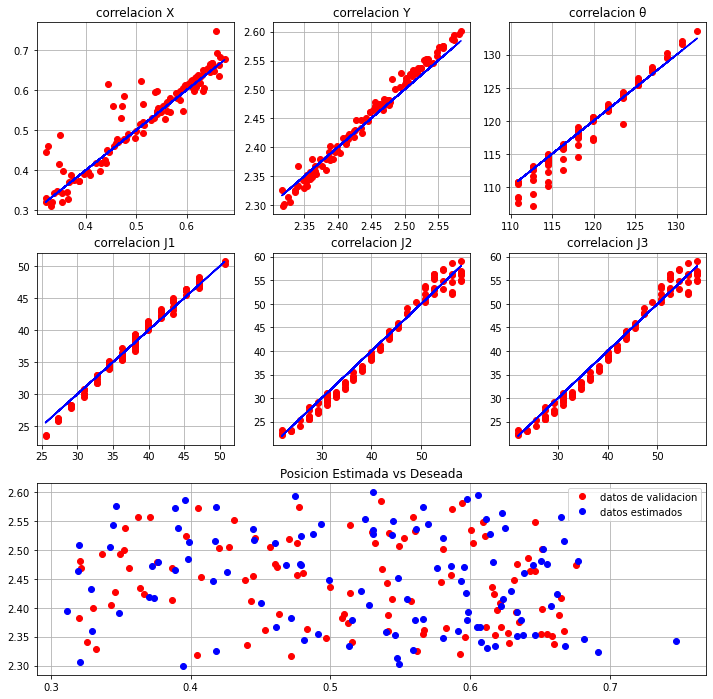


Red numero 41

capas ocultas: (5, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9875222341963775

MSE posicion:  [1.61430224e-03 1.81350361e-04 1.86549787e+00]
MAE posicion:  [0.02325183 0.01150701 0.84471534]
RMSE posicion:  [0.04017838 0.01346664 1.3658323 ]

MSE 2D posicion:  0.0017956525994078064
RMSE 2D posicion:  0.042375141290712015

MSE joints:  [0.72622223 2.91635067 1.39570849]
MAE joints:  [0.70869604 1.41072061 1.03251076]
RMSE joints:  [0.85218673 1.70773261 1.18140107]



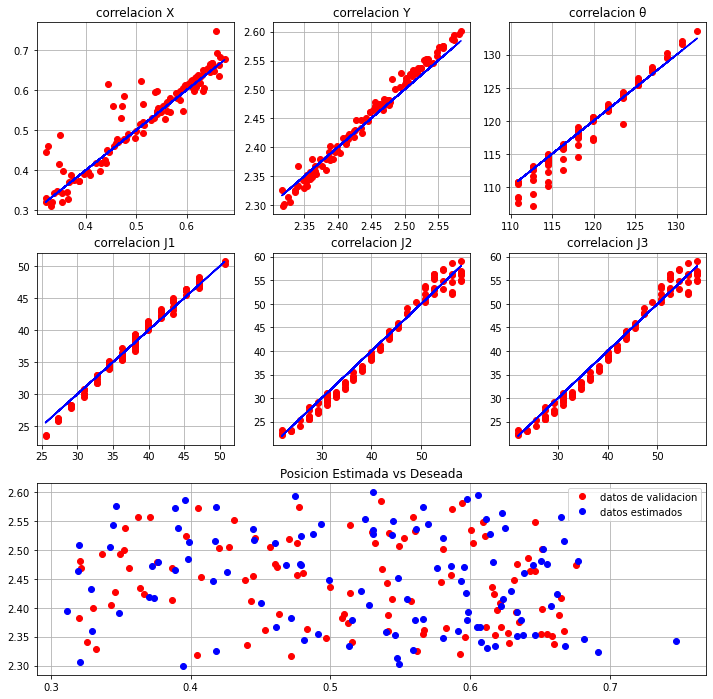


Red numero 42

capas ocultas: (5, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9843469439031848

MSE posicion:  [5.30278405e-04 3.10420637e-04 1.57185092e+00]
MAE posicion:  [0.01741448 0.01447302 1.04584808]
RMSE posicion:  [0.02302777 0.01761876 1.25373479]

MSE 2D posicion:  0.000840699041354335
RMSE 2D posicion:  0.02899481059352406

MSE joints:  [0.80669286 2.51661549 1.72446675]
MAE joints:  [0.74317549 1.33093479 1.11484064]
RMSE joints:  [0.89816082 1.58638441 1.31318953]



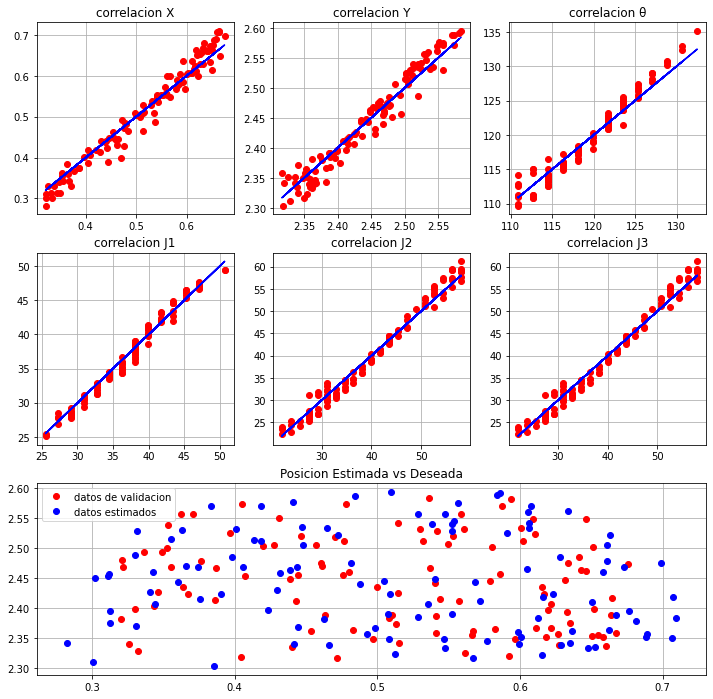


Red numero 43

capas ocultas: (5, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9734050897232193

MSE posicion:  [1.32288054e-03 2.95163449e-04 2.28405416e+00]
MAE posicion:  [0.02744483 0.01369449 1.26457394]
RMSE posicion:  [0.03637142 0.01718032 1.51130876]

MSE 2D posicion:  0.0016180439849229787
RMSE 2D posicion:  0.04022491746322146

MSE joints:  [0.9615419  4.3120168  2.24191582]
MAE joints:  [0.82707477 1.66781402 1.21314988]
RMSE joints:  [0.98058243 2.07653962 1.49730285]



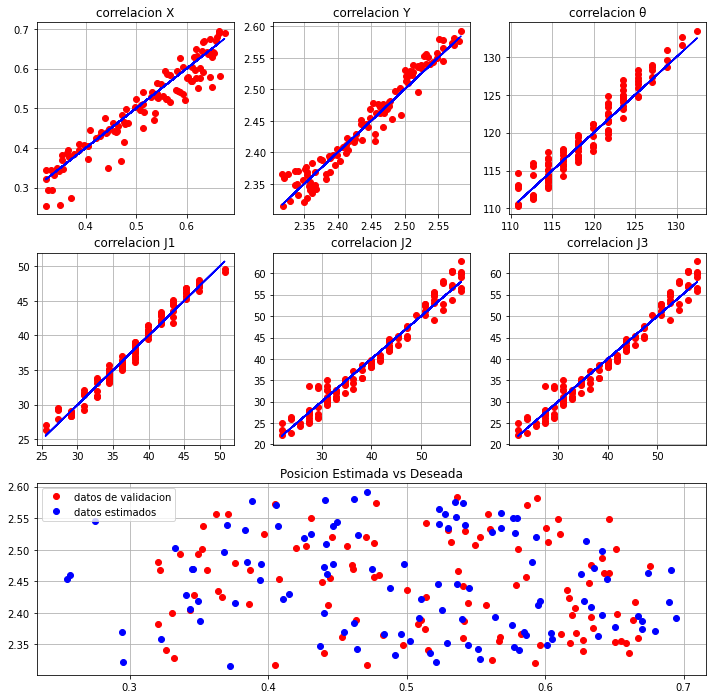


Red numero 44

capas ocultas: (5, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.8867657071872111

MSE posicion:  [4.94883177e-03 2.60685241e-03 1.48240561e+01]
MAE posicion:  [0.05670916 0.04157194 3.07297032]
RMSE posicion:  [0.07034793 0.05105734 3.85020209]

MSE 2D posicion:  0.007555684174283564
RMSE 2D posicion:  0.08692343857834643

MSE joints:  [ 4.03734307 10.35140151  9.5048301 ]
MAE joints:  [1.6493494  2.63767895 2.43959122]
RMSE joints:  [2.00931408 3.2173594  3.08299045]



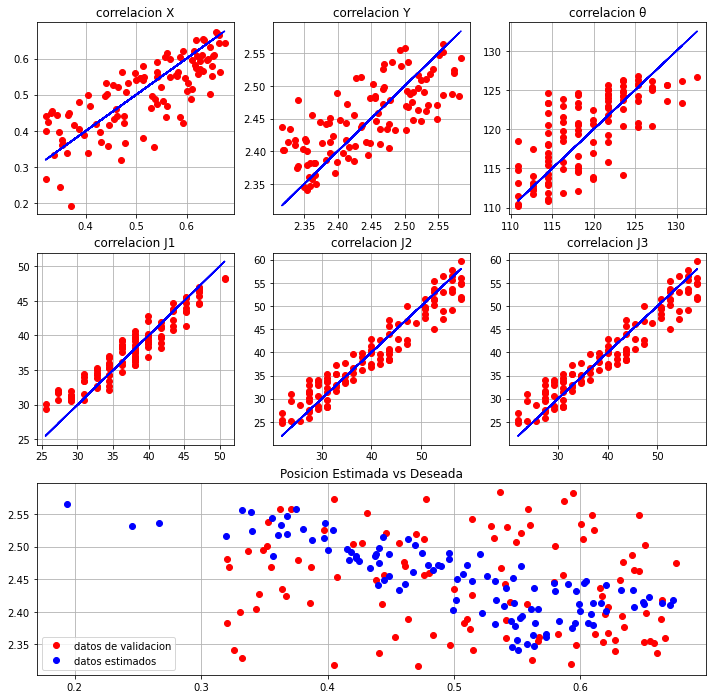


Red numero 45

capas ocultas: (5, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9649985902822341

MSE posicion:  [1.13119197e-02 1.79216322e-04 1.16500732e+01]
MAE posicion:  [0.09220478 0.01120286 2.96358374]
RMSE posicion:  [0.10635751 0.01338717 3.41322035]

MSE 2D posicion:  0.011491135975577129
RMSE 2D posicion:  0.10719671625370401

MSE joints:  [2.65442398 4.8839532  2.77807129]
MAE joints:  [1.36639559 1.77179147 1.4338448 ]
RMSE joints:  [1.62924031 2.20996679 1.66675472]



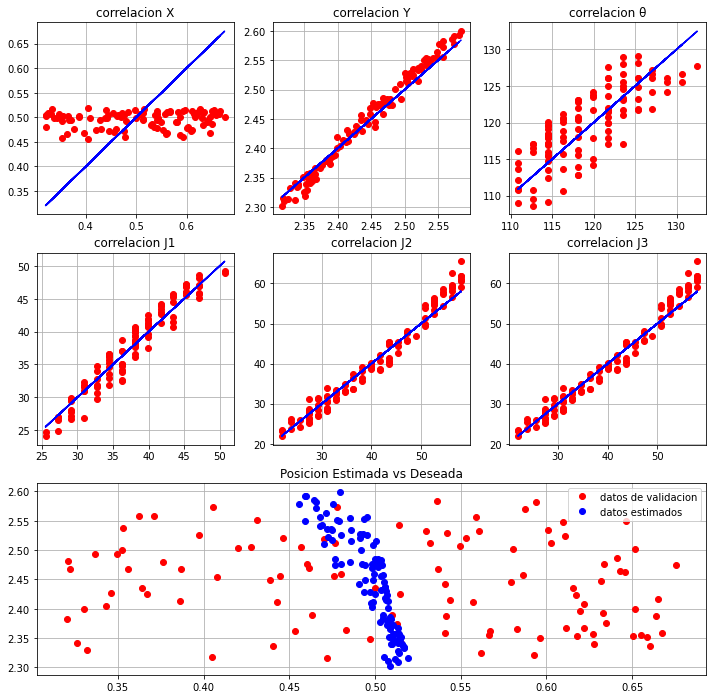


Red numero 46

capas ocultas: (5, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9597582262955626

MSE posicion:  [1.02459396e-02 1.23991014e-04 1.12660247e+01]
MAE posicion:  [0.08721481 0.008742   2.88626773]
RMSE posicion:  [0.10122223 0.01113513 3.35648993]

MSE 2D posicion:  0.010369930581017341
RMSE 2D posicion:  0.1018328560977121

MSE joints:  [2.48214134 4.66284171 3.91690363]
MAE joints:  [1.31864296 1.69547876 1.72563381]
RMSE joints:  [1.5754813  2.15936141 1.97911688]



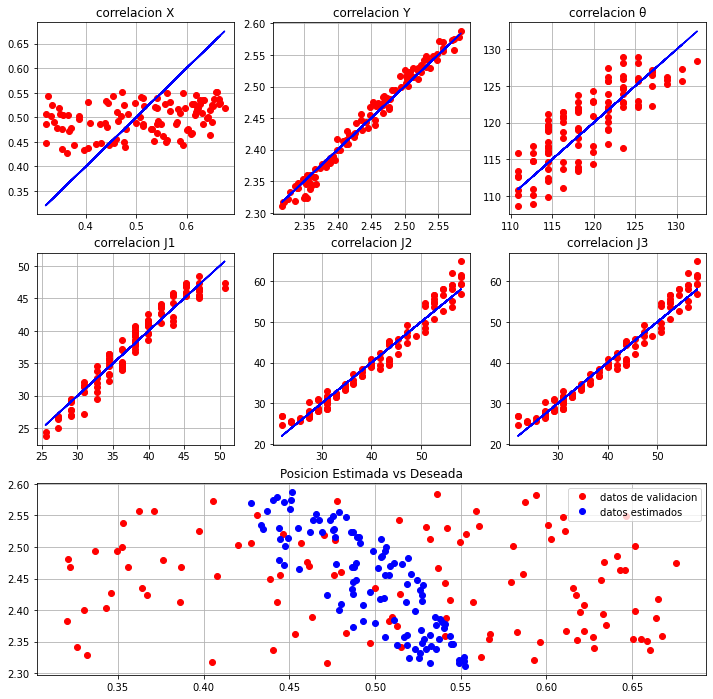


Red numero 47

capas ocultas: (5, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9185348851333486

MSE posicion:  [1.20001928e-02 5.89778330e-04 1.66663763e+01]
MAE posicion:  [0.09196345 0.01975815 3.43652433]
RMSE posicion:  [0.10954539 0.02428535 4.08244734]

MSE 2D posicion:  0.012589971157786137
RMSE 2D posicion:  0.11220504069686948

MSE joints:  [ 2.27324642 10.52756253  4.68100067]
MAE joints:  [1.05742363 2.46254604 1.80556947]
RMSE joints:  [1.5077289  3.24462055 2.16356203]



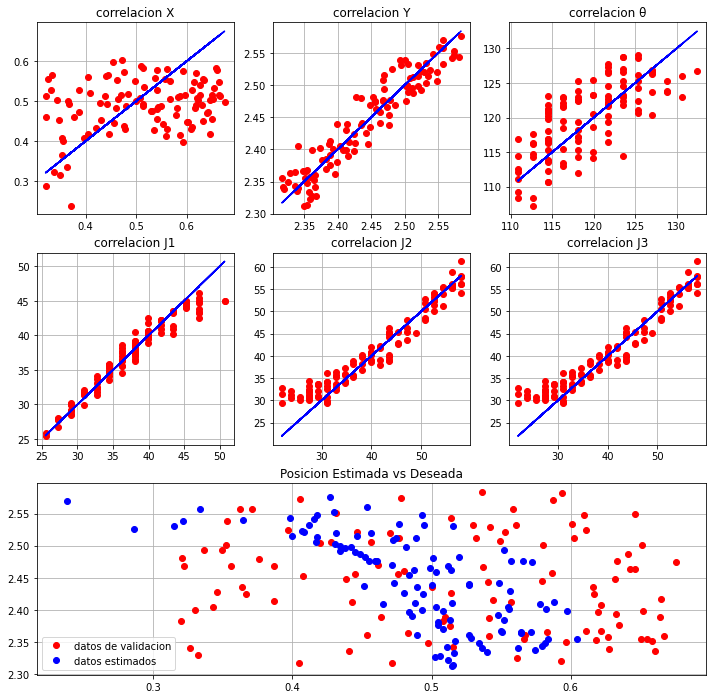


Red numero 48

capas ocultas: (5, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.992760603651833

MSE posicion:  [4.72600931e-04 1.23035403e-04 5.15317557e-01]
MAE posicion:  [0.01609889 0.00881646 0.55452022]
RMSE posicion:  [0.02173939 0.01109213 0.71785622]

MSE 2D posicion:  0.000595636333680636
RMSE 2D posicion:  0.02440566191851055

MSE joints:  [0.6053576  2.0473993  1.32344717]
MAE joints:  [0.61371421 1.21760776 1.00478414]
RMSE joints:  [0.7780473  1.43087361 1.15041174]



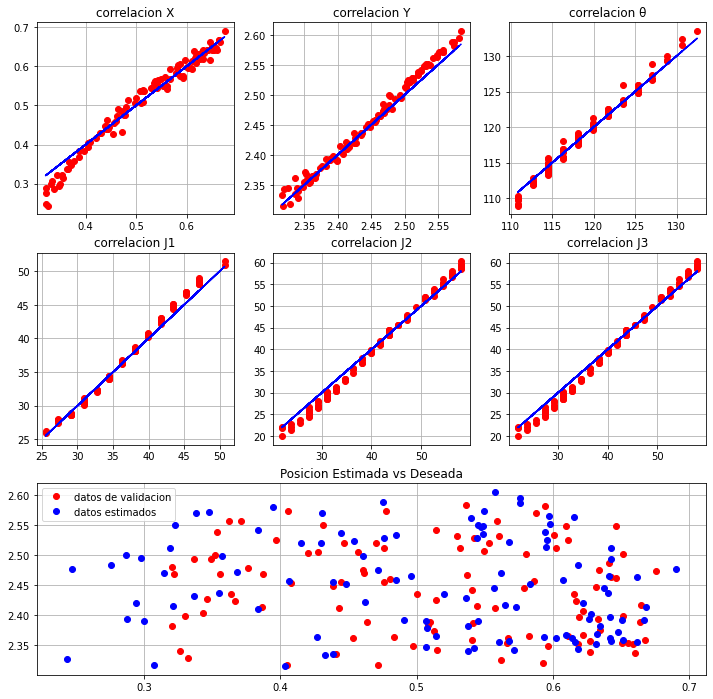


Red numero 49

capas ocultas: (5, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9767663023964074

MSE posicion:  [3.69614164e-03 2.47743615e-04 4.41601055e+00]
MAE posicion:  [0.0438076  0.01189737 1.58712921]
RMSE posicion:  [0.0607959  0.01573987 2.1014306 ]

MSE 2D posicion:  0.003943885253905018
RMSE 2D posicion:  0.06280036030075797

MSE joints:  [0.84026321 3.57034373 1.69143138]
MAE joints:  [0.78610814 1.53419186 1.09901976]
RMSE joints:  [0.91665872 1.88953532 1.30055041]



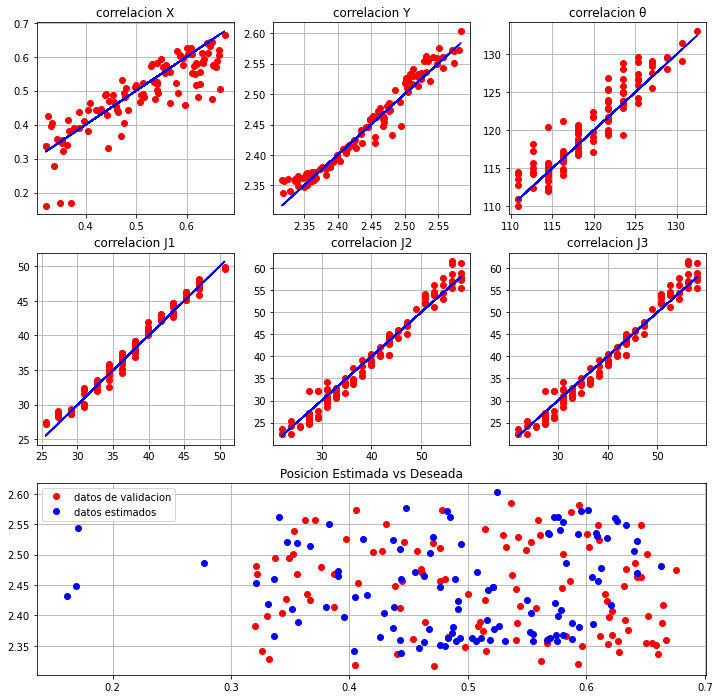


Red numero 50

capas ocultas: (5, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9564772109455258

MSE posicion:  [7.36234636e-03 3.78589155e-04 5.93139889e+00]
MAE posicion:  [0.06759708 0.01464041 1.89026395]
RMSE posicion:  [0.08580412 0.01945737 2.43544634]

MSE 2D posicion:  0.007740935517708507
RMSE 2D posicion:  0.08798258644589001

MSE joints:  [1.62238737 4.94290134 1.99298311]
MAE joints:  [0.95875259 1.78911638 1.16437593]
RMSE joints:  [1.27372971 2.22326367 1.41173054]



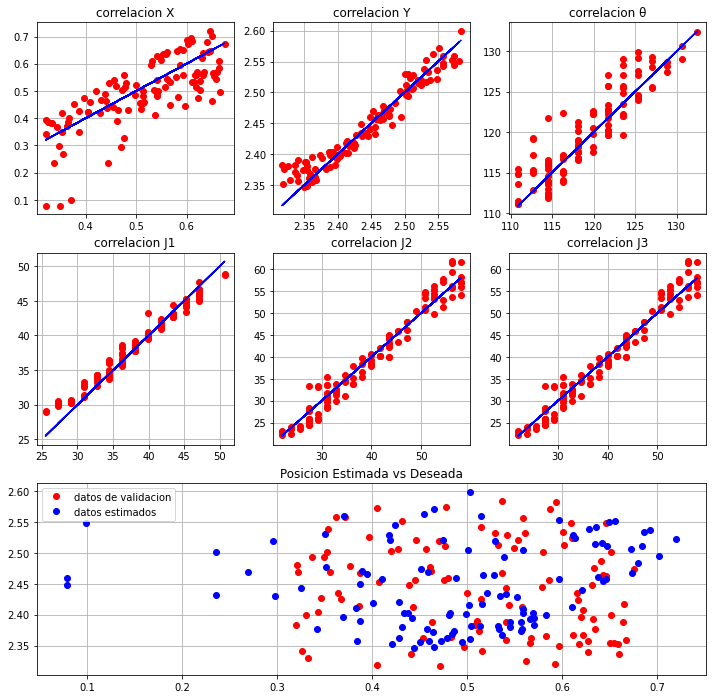


Red numero 51

capas ocultas: (5, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9720609288839555

MSE posicion:  [1.17142347e-02 1.27623592e-04 1.16690714e+01]
MAE posicion:  [0.0939522  0.00971776 2.963495  ]
RMSE posicion:  [0.10823232 0.01129706 3.41600226]

MSE 2D posicion:  0.011841858299605768
RMSE 2D posicion:  0.10882030279137146

MSE joints:  [2.32321226 5.51975621 2.44354702]
MAE joints:  [1.25428476 1.9068901  1.31059856]
RMSE joints:  [1.52420873 2.34941614 1.5631849 ]



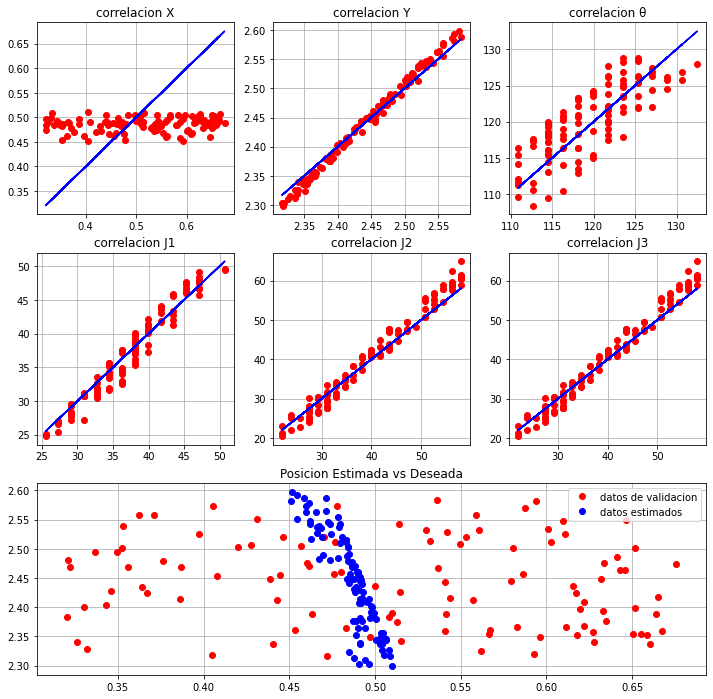


Red numero 52

capas ocultas: (5, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.964549793552242

MSE posicion:  [8.49456894e-03 2.11417933e-04 9.09052401e+00]
MAE posicion:  [0.07990068 0.01227926 2.58646723]
RMSE posicion:  [0.09216599 0.01454022 3.01504959]

MSE 2D posicion:  0.008705986873236838
RMSE 2D posicion:  0.09330587802082374

MSE joints:  [2.29932856 4.5015019  2.95946805]
MAE joints:  [1.26955809 1.74262524 1.46834103]
RMSE joints:  [1.5163537  2.12167431 1.72031045]



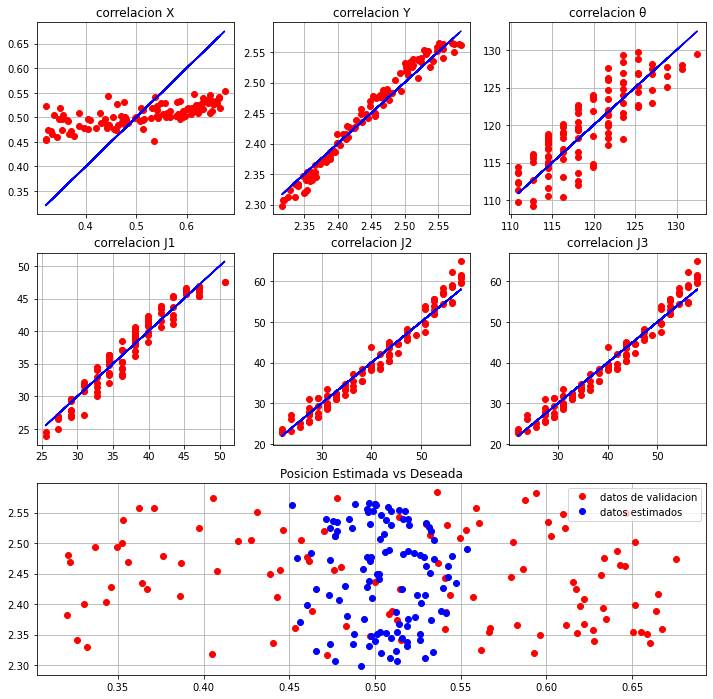


Red numero 53

capas ocultas: (5, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9342298103589269

MSE posicion:  [5.85651365e-03 1.06317019e-03 1.07246154e+01]
MAE posicion:  [0.0645769  0.02687214 2.71686528]
RMSE posicion:  [0.07652786 0.03260629 3.27484586]

MSE 2D posicion:  0.006919683836591708
RMSE 2D posicion:  0.08318463702266006

MSE joints:  [1.79048947 5.71871885 8.41649139]
MAE joints:  [0.92091577 1.89484448 2.4319966 ]
RMSE joints:  [1.33809173 2.3913843  2.90111899]



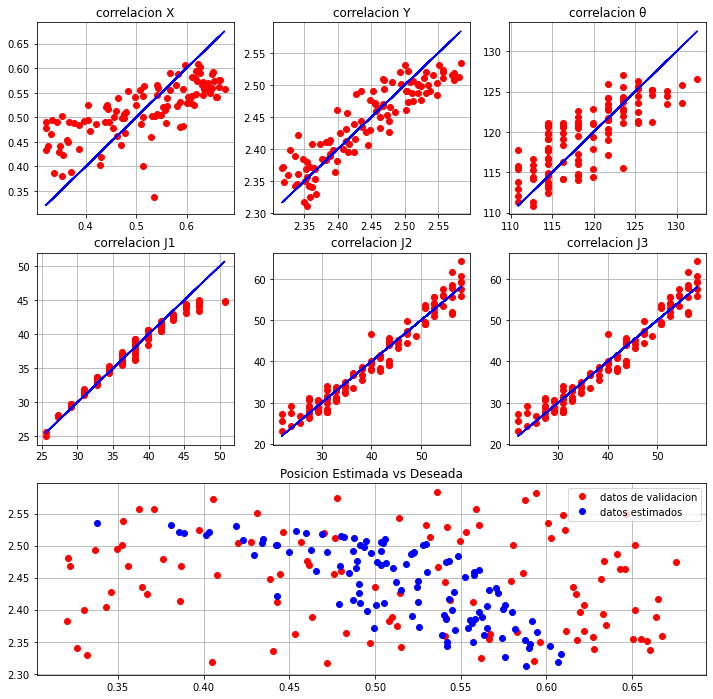


Red numero 54

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9965644504221691

MSE posicion:  [1.47282117e-04 8.29971853e-05 3.76327304e-01]
MAE posicion:  [0.01067319 0.0075972  0.54046524]
RMSE posicion:  [0.01213598 0.00911028 0.61345522]

MSE 2D posicion:  0.00023027930272567096
RMSE 2D posicion:  0.01517495643241426

MSE joints:  [0.65711998 2.45419031 1.64535947]
MAE joints:  [0.64779667 1.29033468 1.10267494]
RMSE joints:  [0.81062937 1.56658556 1.28271566]



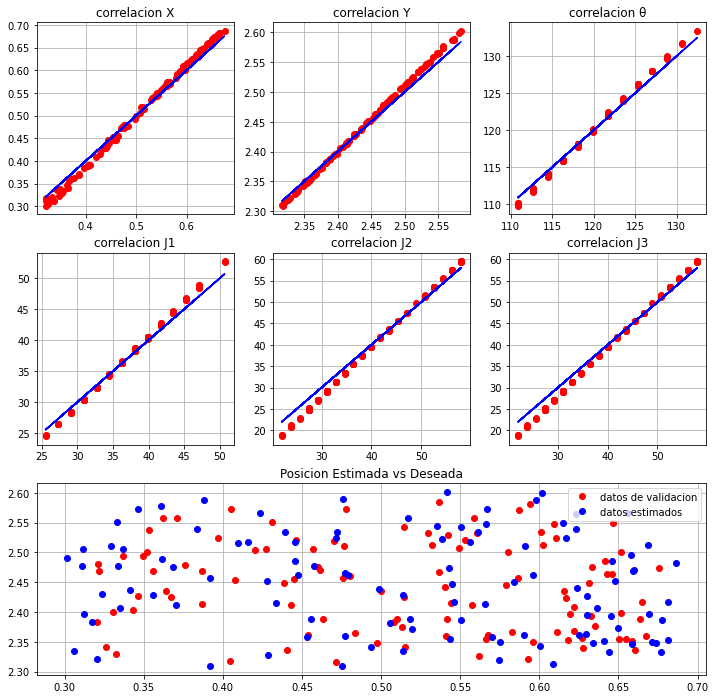


Red numero 55

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9965644504221691

MSE posicion:  [1.47282117e-04 8.29971853e-05 3.76327304e-01]
MAE posicion:  [0.01067319 0.0075972  0.54046524]
RMSE posicion:  [0.01213598 0.00911028 0.61345522]

MSE 2D posicion:  0.00023027930272567096
RMSE 2D posicion:  0.01517495643241426

MSE joints:  [0.65711998 2.45419031 1.64535947]
MAE joints:  [0.64779667 1.29033468 1.10267494]
RMSE joints:  [0.81062937 1.56658556 1.28271566]



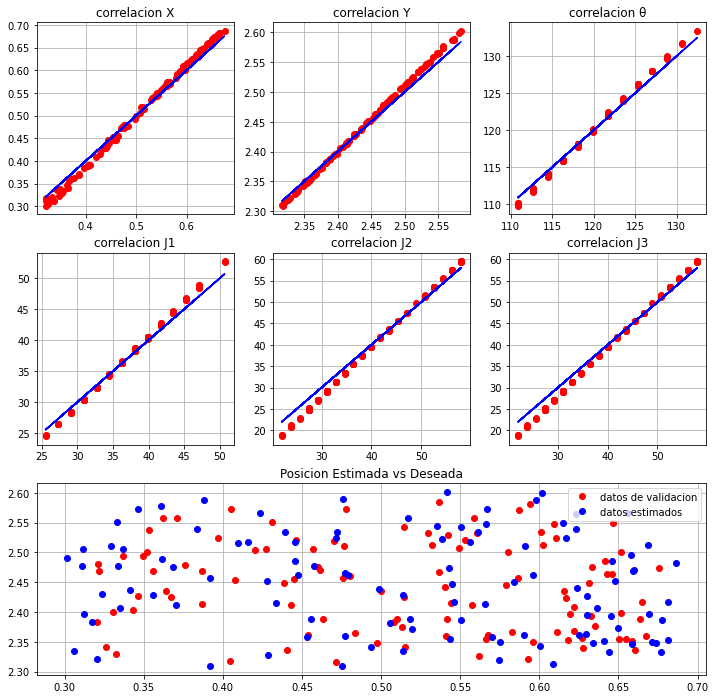


Red numero 56

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9965644504221691

MSE posicion:  [1.47282117e-04 8.29971853e-05 3.76327304e-01]
MAE posicion:  [0.01067319 0.0075972  0.54046524]
RMSE posicion:  [0.01213598 0.00911028 0.61345522]

MSE 2D posicion:  0.00023027930272567096
RMSE 2D posicion:  0.01517495643241426

MSE joints:  [0.65711998 2.45419031 1.64535947]
MAE joints:  [0.64779667 1.29033468 1.10267494]
RMSE joints:  [0.81062937 1.56658556 1.28271566]



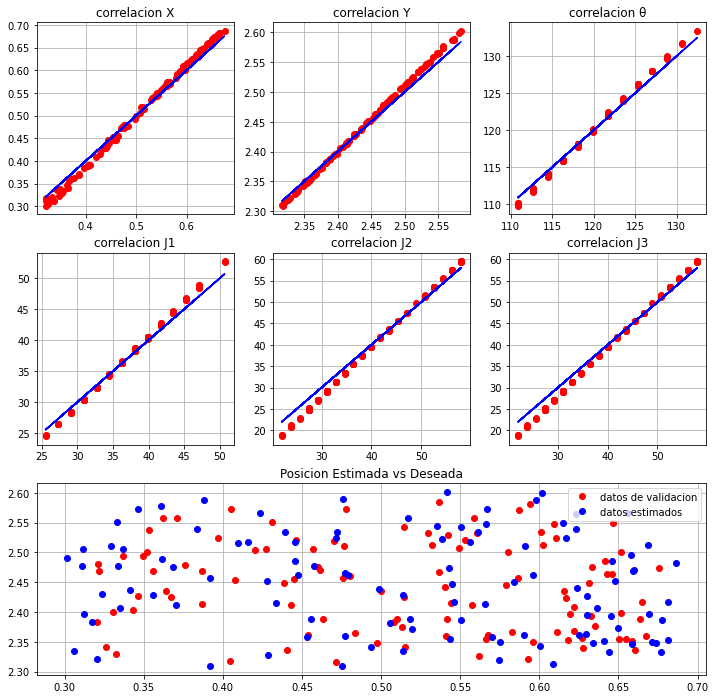


Red numero 57

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.995889767685325

MSE posicion:  [1.42158825e-04 1.13362209e-04 3.39854864e-01]
MAE posicion:  [0.00983787 0.00887467 0.48937799]
RMSE posicion:  [0.01192304 0.01064717 0.58297072]

MSE 2D posicion:  0.0002555210346946523
RMSE 2D posicion:  0.015985025326681602

MSE joints:  [0.68334044 2.55562364 1.65109303]
MAE joints:  [0.68078996 1.33004045 1.0807616 ]
RMSE joints:  [0.82664408 1.5986318  1.28494865]



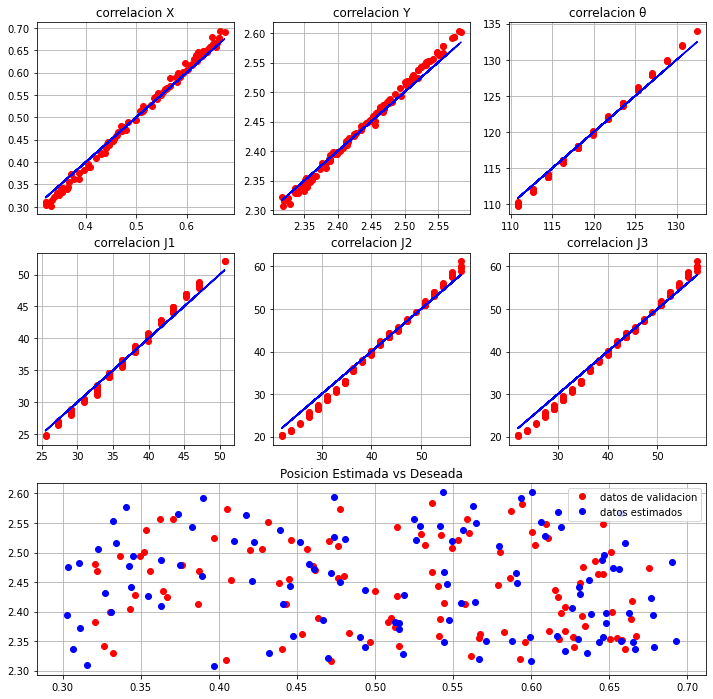


Red numero 58

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.995889767685325

MSE posicion:  [1.42158825e-04 1.13362209e-04 3.39854864e-01]
MAE posicion:  [0.00983787 0.00887467 0.48937799]
RMSE posicion:  [0.01192304 0.01064717 0.58297072]

MSE 2D posicion:  0.0002555210346946523
RMSE 2D posicion:  0.015985025326681602

MSE joints:  [0.68334044 2.55562364 1.65109303]
MAE joints:  [0.68078996 1.33004045 1.0807616 ]
RMSE joints:  [0.82664408 1.5986318  1.28494865]



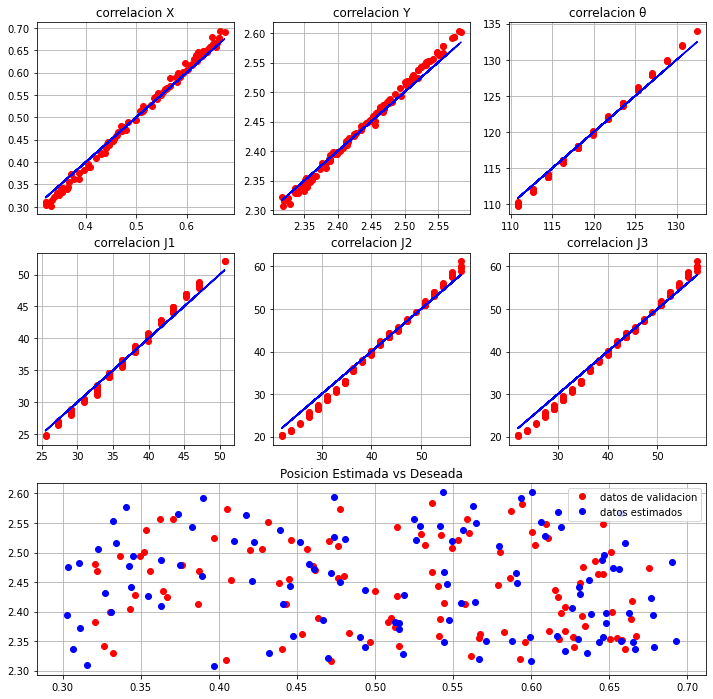


Red numero 59

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.995889767685325

MSE posicion:  [1.42158825e-04 1.13362209e-04 3.39854864e-01]
MAE posicion:  [0.00983787 0.00887467 0.48937799]
RMSE posicion:  [0.01192304 0.01064717 0.58297072]

MSE 2D posicion:  0.0002555210346946523
RMSE 2D posicion:  0.015985025326681602

MSE joints:  [0.68334044 2.55562364 1.65109303]
MAE joints:  [0.68078996 1.33004045 1.0807616 ]
RMSE joints:  [0.82664408 1.5986318  1.28494865]



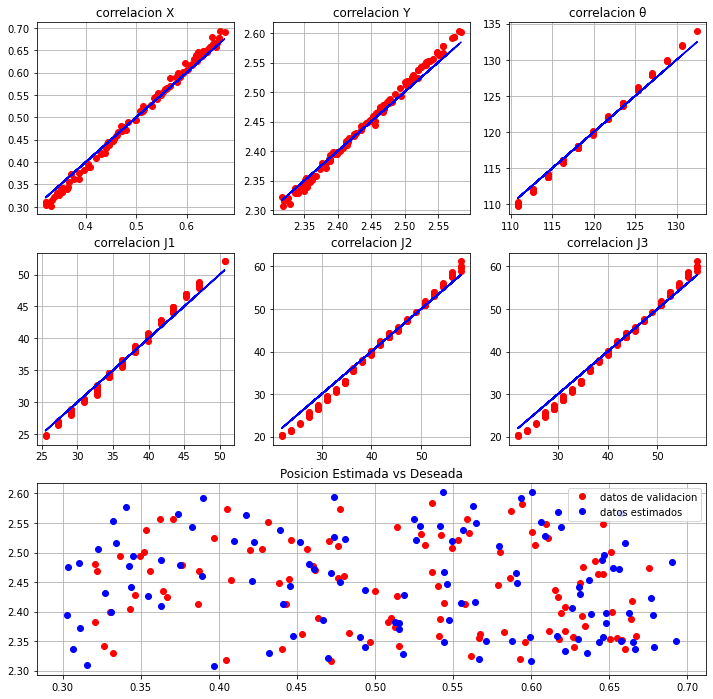


Red numero 60

capas ocultas: (10, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9838374357376116

MSE posicion:  [7.80206540e-04 1.73096821e-04 6.98744453e-01]
MAE posicion:  [0.02270964 0.01061649 0.67979704]
RMSE posicion:  [0.02793218 0.01315663 0.83590936]

MSE 2D posicion:  0.0009533033605944095
RMSE 2D posicion:  0.030875611096695878

MSE joints:  [1.08895022 2.1105061  1.63633987]
MAE joints:  [0.87469663 1.21216196 1.03901504]
RMSE joints:  [1.04352778 1.4527581  1.27919501]



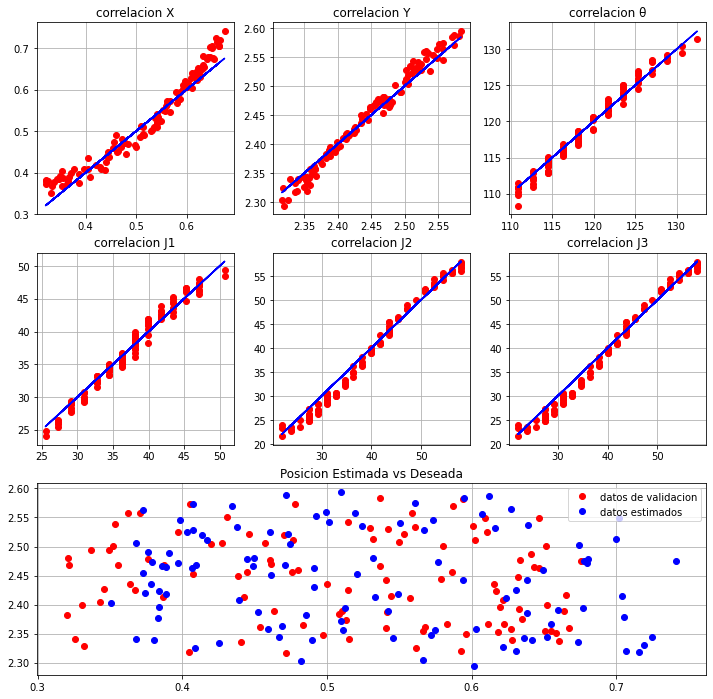


Red numero 61

capas ocultas: (10, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9764786098843886

MSE posicion:  [2.12615414e-03 3.08088072e-04 1.38308418e+00]
MAE posicion:  [0.03517699 0.01432457 0.91152293]
RMSE posicion:  [0.04611024 0.01755244 1.176046  ]

MSE 2D posicion:  0.0024342422074903197
RMSE 2D posicion:  0.049338040166694096

MSE joints:  [2.18095354 2.65163472 1.88087438]
MAE joints:  [1.17822896 1.41406768 1.09238006]
RMSE joints:  [1.47680518 1.62838408 1.37144974]



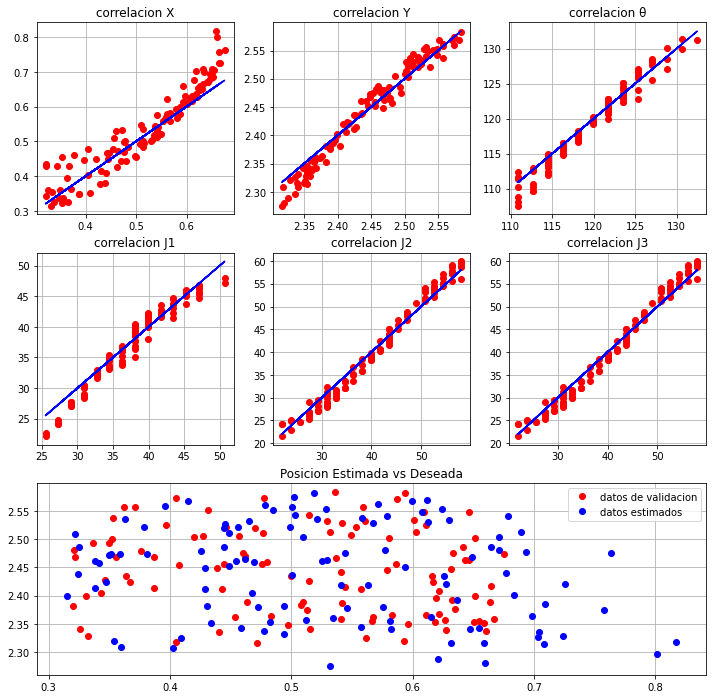


Red numero 62

capas ocultas: (10, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9294999219417712

MSE posicion:  [1.40133037e-02 4.31778512e-04 9.44135232e+00]
MAE posicion:  [0.10313607 0.01625293 2.6758877 ]
RMSE posicion:  [0.1183778  0.02077928 3.07267836]

MSE 2D posicion:  0.014445082204423747
RMSE 2D posicion:  0.12018769572807254

MSE joints:  [5.61384372 3.27066618 1.98326551]
MAE joints:  [2.00073502 1.44971195 1.10925058]
RMSE joints:  [2.36935513 1.80849832 1.4082846 ]



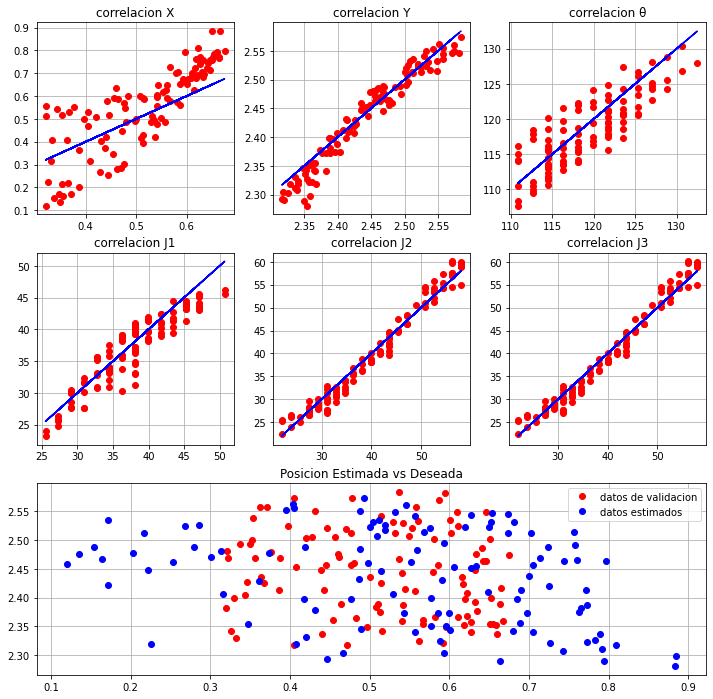


Red numero 63

capas ocultas: (10, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.985036992731521

MSE posicion:  [3.47399594e-04 1.63946036e-04 6.14288225e-01]
MAE posicion:  [0.01523104 0.01067833 0.60769985]
RMSE posicion:  [0.01863866 0.01280414 0.78376541]

MSE 2D posicion:  0.0005113456304046097
RMSE 2D posicion:  0.022612952713093656

MSE joints:  [0.82898982 3.4423385  1.90228564]
MAE joints:  [0.72905521 1.41895872 1.05464058]
RMSE joints:  [0.91048878 1.85535401 1.37923372]



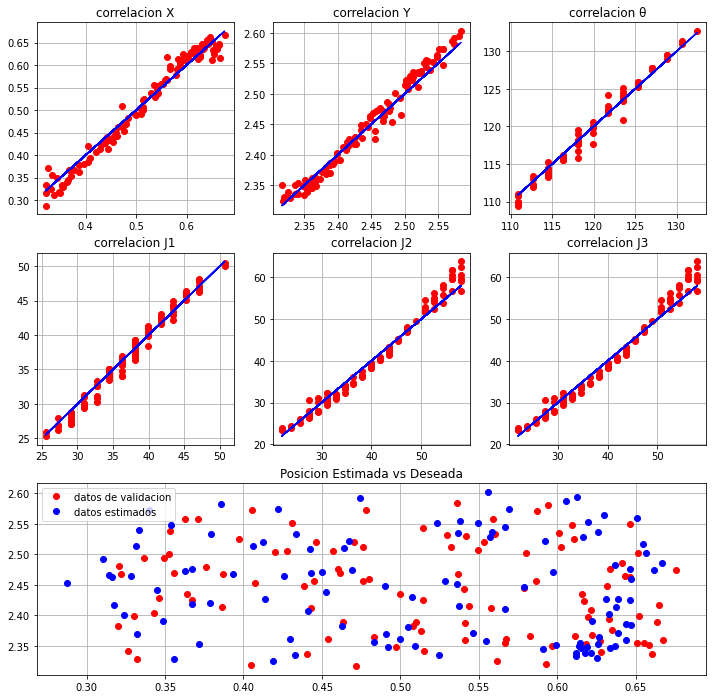


Red numero 64

capas ocultas: (10, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9712389185848505

MSE posicion:  [5.19925657e-03 2.87479786e-04 4.22531181e+00]
MAE posicion:  [0.0591791  0.01330399 1.67326714]
RMSE posicion:  [0.07210587 0.01695523 2.05555633]

MSE 2D posicion:  0.005486736360139644
RMSE 2D posicion:  0.07407250745141307

MSE joints:  [1.66808664 5.93572193 1.58034852]
MAE joints:  [1.07395385 1.9731335  0.97149025]
RMSE joints:  [1.29154429 2.43633371 1.25711914]



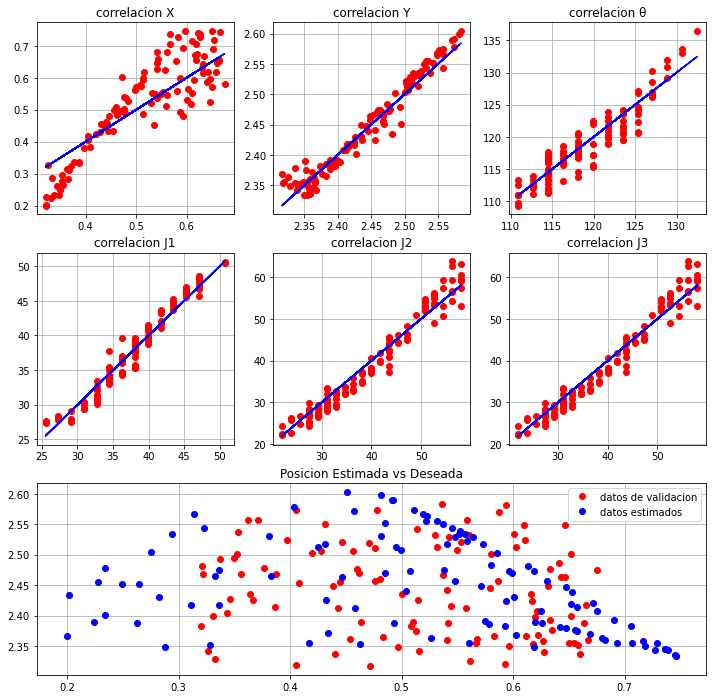


Red numero 65

capas ocultas: (10, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9032209099086815

MSE posicion:  [2.91237469e-02 9.04805928e-04 2.46943758e+01]
MAE posicion:  [0.13571911 0.02213007 3.93172885]
RMSE posicion:  [0.17065681 0.03007999 4.9693436 ]

MSE 2D posicion:  0.030028552843581222
RMSE 2D posicion:  0.17328748611362918

MSE joints:  [6.25011534 9.45422444 2.09449956]
MAE joints:  [2.09655287 2.45475836 1.15903782]
RMSE joints:  [2.50002307 3.07477226 1.4472386 ]



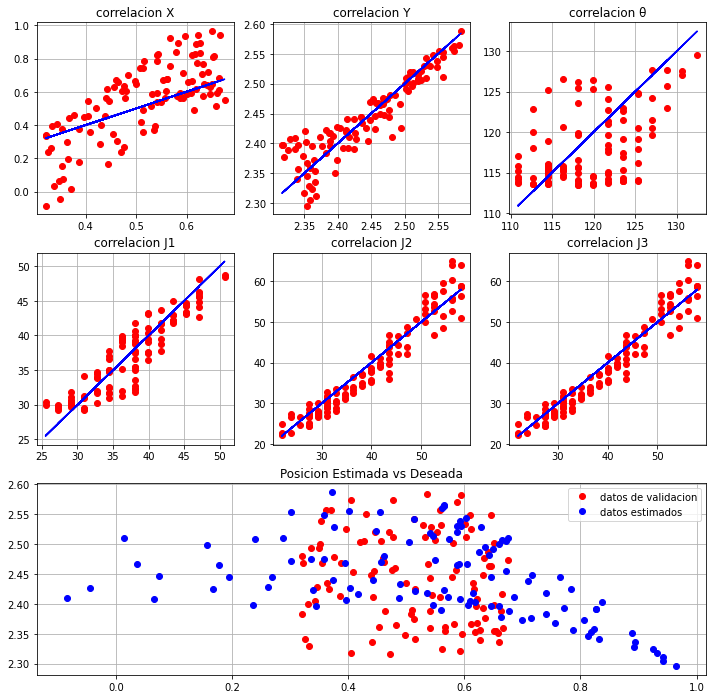


Red numero 66

capas ocultas: (10, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9919317601737011

MSE posicion:  [6.63502533e-04 9.89392879e-05 8.06923765e-01]
MAE posicion:  [0.02123377 0.00811221 0.67737238]
RMSE posicion:  [0.02575854 0.00994682 0.89828935]

MSE 2D posicion:  0.0007624418204080898
RMSE 2D posicion:  0.027612349056320613

MSE joints:  [0.44490489 1.57116198 1.23906983]
MAE joints:  [0.53928128 1.08776859 0.96439477]
RMSE joints:  [0.66701191 1.25346    1.11313514]



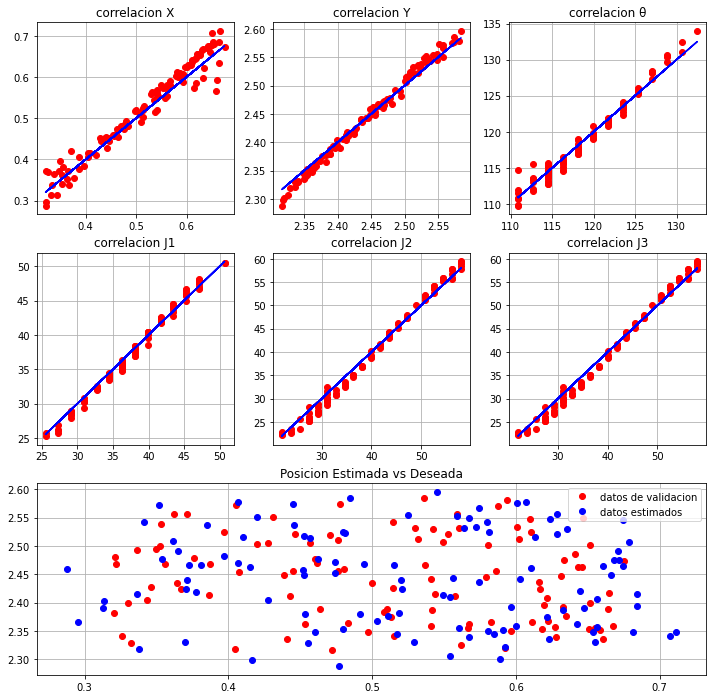


Red numero 67

capas ocultas: (10, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9816821229053967

MSE posicion:  [6.03286600e-04 2.17289967e-04 6.36994018e-01]
MAE posicion:  [0.01809049 0.01227073 0.63421924]
RMSE posicion:  [0.02456189 0.01474076 0.79811905]

MSE 2D posicion:  0.0008205765670744683
RMSE 2D posicion:  0.028645707655327146

MSE joints:  [1.27640693 2.00362775 1.68121001]
MAE joints:  [0.93273922 1.20845863 1.01926123]
RMSE joints:  [1.12978181 1.41549558 1.29661483]



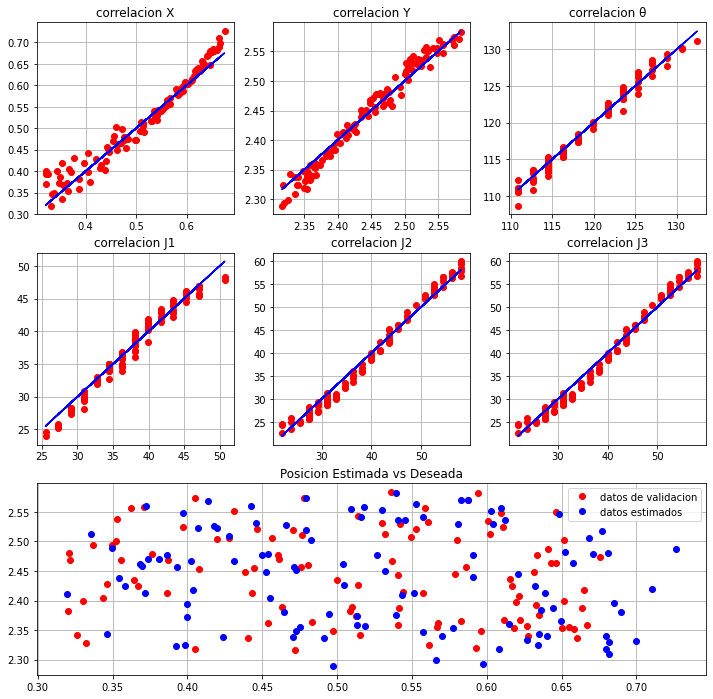


Red numero 68

capas ocultas: (10, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9705663051255455

MSE posicion:  [3.52078591e-03 2.92189911e-04 2.26515416e+00]
MAE posicion:  [0.04745166 0.01379992 1.2525371 ]
RMSE posicion:  [0.05933621 0.01709356 1.50504291]

MSE 2D posicion:  0.00381297581823041
RMSE 2D posicion:  0.0617492981193342

MSE joints:  [1.85902086 3.98914604 1.40876741]
MAE joints:  [1.06823077 1.66569191 0.92681586]
RMSE joints:  [1.36345915 1.99728467 1.18691508]



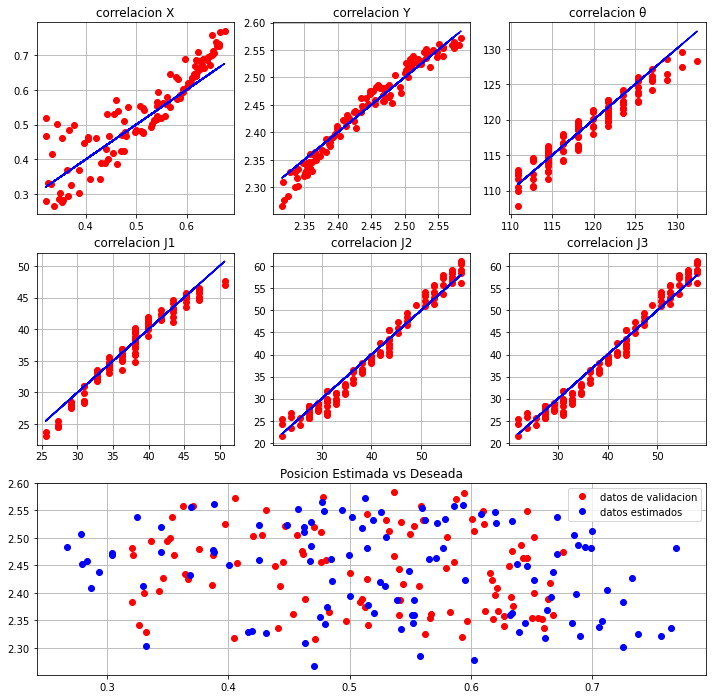


Red numero 69

capas ocultas: (10, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9945821036281024

MSE posicion:  [4.09558246e-04 9.24225006e-05 8.05922399e-01]
MAE posicion:  [0.01551428 0.00789152 0.74934452]
RMSE posicion:  [0.02023755 0.00961366 0.89773181]

MSE 2D posicion:  0.0005019807468607415
RMSE 2D posicion:  0.02240492684345882

MSE joints:  [0.57564863 2.08559978 1.55689829]
MAE joints:  [0.63032854 1.19605166 1.02507775]
RMSE joints:  [0.75871512 1.44416058 1.2477573 ]



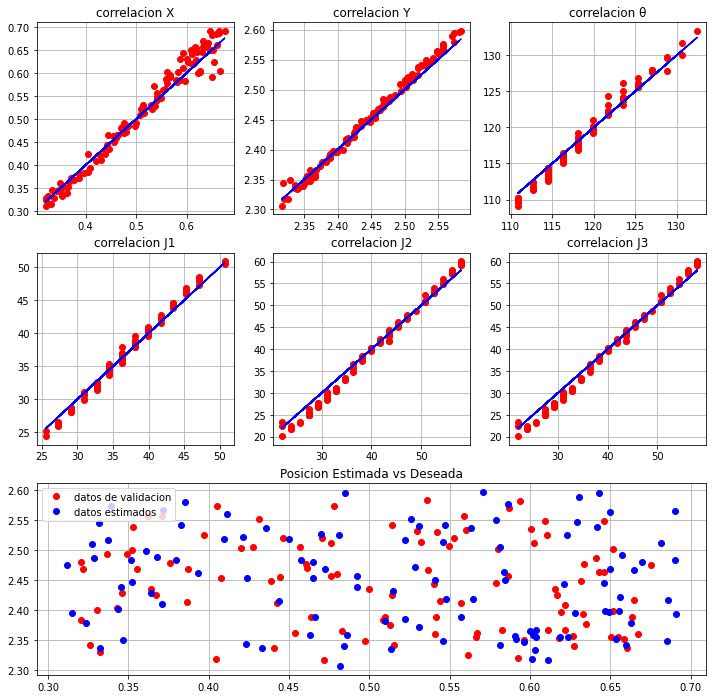


Red numero 70

capas ocultas: (10, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9801277683471287

MSE posicion:  [7.98751918e-04 2.56412211e-04 9.91520667e-01]
MAE posicion:  [0.02091428 0.01240002 0.76375633]
RMSE posicion:  [0.0282622  0.01601288 0.99575131]

MSE 2D posicion:  0.0010551641291169048
RMSE 2D posicion:  0.03248328999834999

MSE joints:  [1.11490207 3.64502345 1.61658247]
MAE joints:  [0.80641465 1.53859881 1.02016755]
RMSE joints:  [1.05588923 1.90919445 1.27144897]



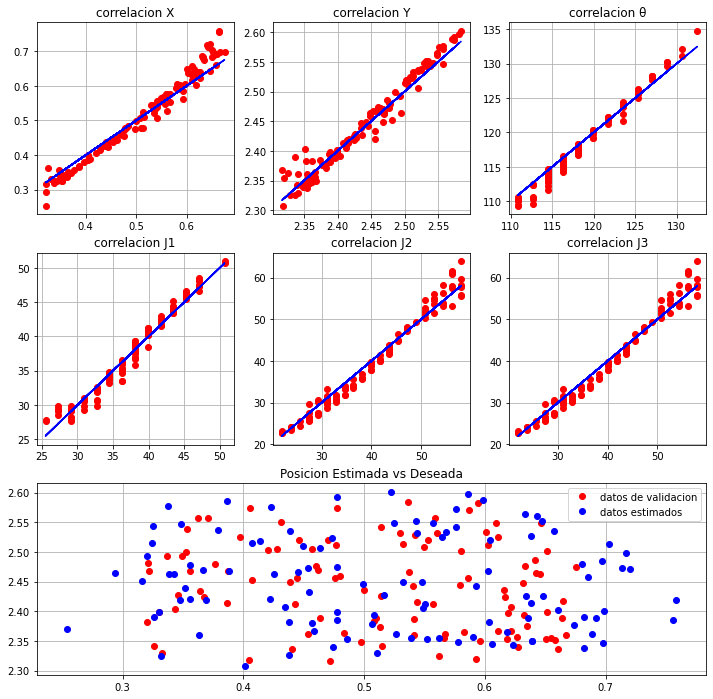


Red numero 71

capas ocultas: (10, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9382567711898151

MSE posicion:  [9.17693559e-03 7.76596684e-04 1.00842565e+01]
MAE posicion:  [0.0767136  0.018478   2.53458756]
RMSE posicion:  [0.09579632 0.02786748 3.17557185]

MSE 2D posicion:  0.009953532271429505
RMSE 2D posicion:  0.09976739082199908

MSE joints:  [3.19424258 7.73414975 3.13986636]
MAE joints:  [1.36100492 2.24273391 1.45856946]
RMSE joints:  [1.78724441 2.78103394 1.7719668 ]



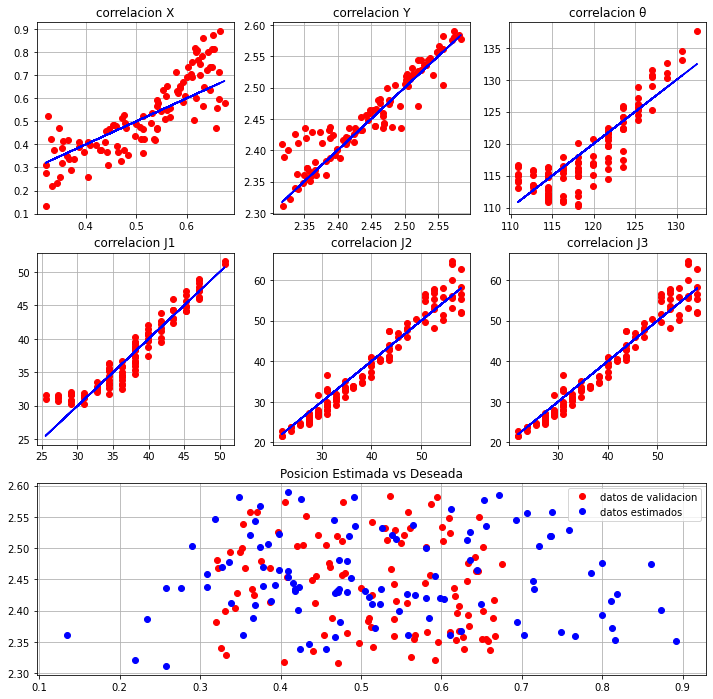


Red numero 72

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9965186012363887

MSE posicion:  [1.34817212e-04 8.24955837e-05 3.36089358e-01]
MAE posicion:  [0.00994755 0.00751132 0.50223103]
RMSE posicion:  [0.01161108 0.00908271 0.57973214]

MSE 2D posicion:  0.00021731279549492015
RMSE 2D posicion:  0.014741533010339194

MSE joints:  [0.68105136 2.53197893 1.50403941]
MAE joints:  [0.66415711 1.29556775 1.08951186]
RMSE joints:  [0.82525836 1.59121932 1.22639284]



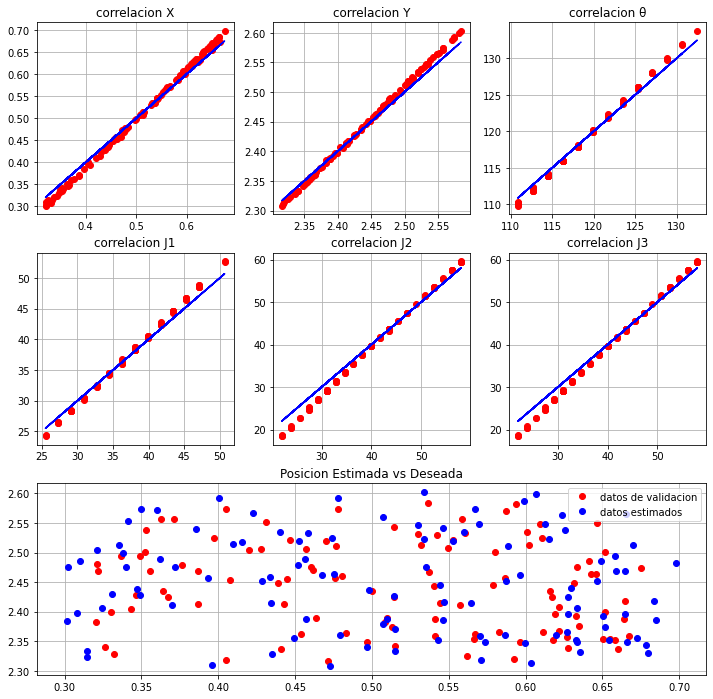


Red numero 73

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9965186012363887

MSE posicion:  [1.34817212e-04 8.24955837e-05 3.36089358e-01]
MAE posicion:  [0.00994755 0.00751132 0.50223103]
RMSE posicion:  [0.01161108 0.00908271 0.57973214]

MSE 2D posicion:  0.00021731279549492015
RMSE 2D posicion:  0.014741533010339194

MSE joints:  [0.68105136 2.53197893 1.50403941]
MAE joints:  [0.66415711 1.29556775 1.08951186]
RMSE joints:  [0.82525836 1.59121932 1.22639284]



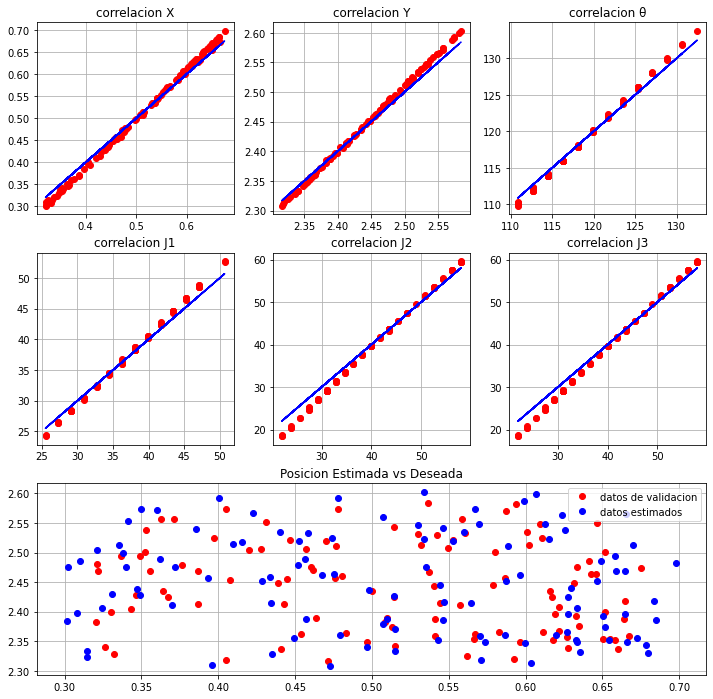


Red numero 74

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9965186012363887

MSE posicion:  [1.34817212e-04 8.24955837e-05 3.36089358e-01]
MAE posicion:  [0.00994755 0.00751132 0.50223103]
RMSE posicion:  [0.01161108 0.00908271 0.57973214]

MSE 2D posicion:  0.00021731279549492015
RMSE 2D posicion:  0.014741533010339194

MSE joints:  [0.68105136 2.53197893 1.50403941]
MAE joints:  [0.66415711 1.29556775 1.08951186]
RMSE joints:  [0.82525836 1.59121932 1.22639284]



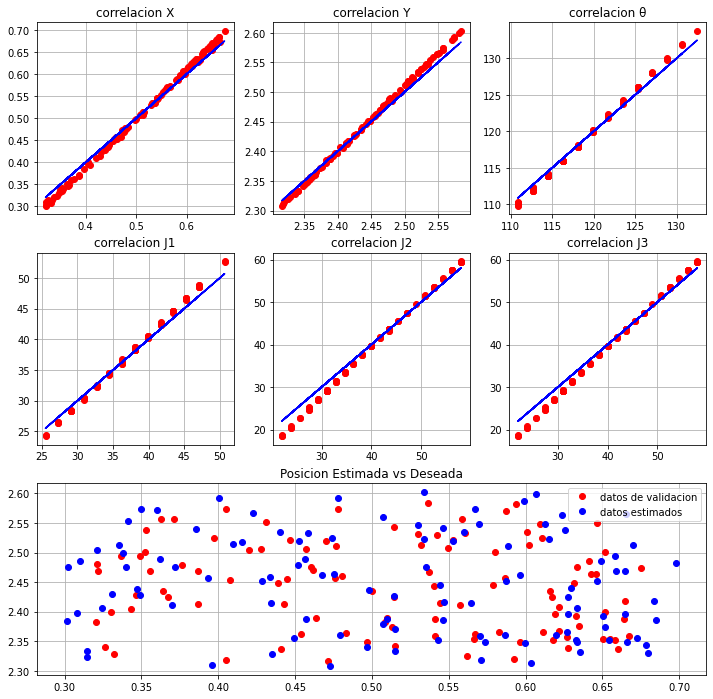


Red numero 75

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9965554481806386

MSE posicion:  [1.37519073e-04 9.13124525e-05 3.11630836e-01]
MAE posicion:  [0.00988329 0.00776462 0.47691619]
RMSE posicion:  [0.01172685 0.00955575 0.55823905]

MSE 2D posicion:  0.00022883152562309489
RMSE 2D posicion:  0.015127178376124706

MSE joints:  [0.66021898 2.4286107  1.43863361]
MAE joints:  [0.63300684 1.31802205 1.06089109]
RMSE joints:  [0.8125386  1.55840005 1.19943053]



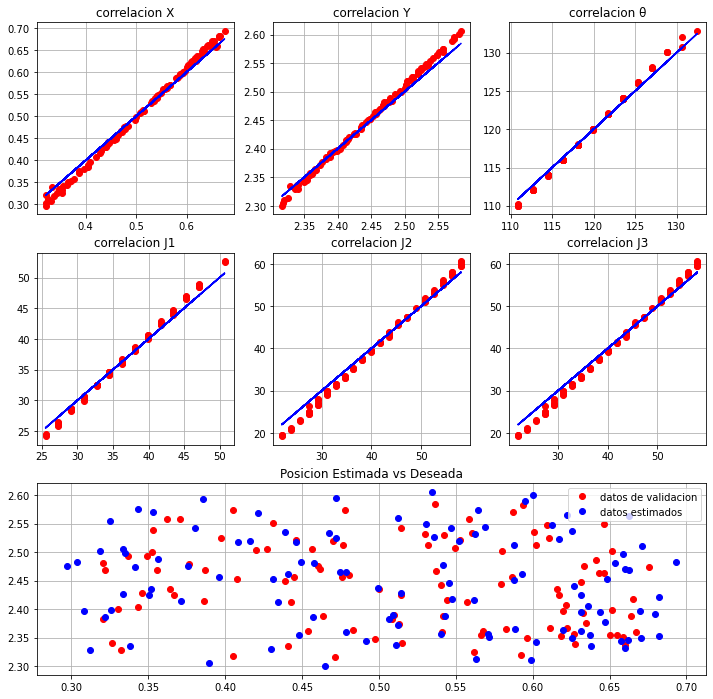


Red numero 76

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9965554481806386

MSE posicion:  [1.37519073e-04 9.13124525e-05 3.11630836e-01]
MAE posicion:  [0.00988329 0.00776462 0.47691619]
RMSE posicion:  [0.01172685 0.00955575 0.55823905]

MSE 2D posicion:  0.00022883152562309489
RMSE 2D posicion:  0.015127178376124706

MSE joints:  [0.66021898 2.4286107  1.43863361]
MAE joints:  [0.63300684 1.31802205 1.06089109]
RMSE joints:  [0.8125386  1.55840005 1.19943053]



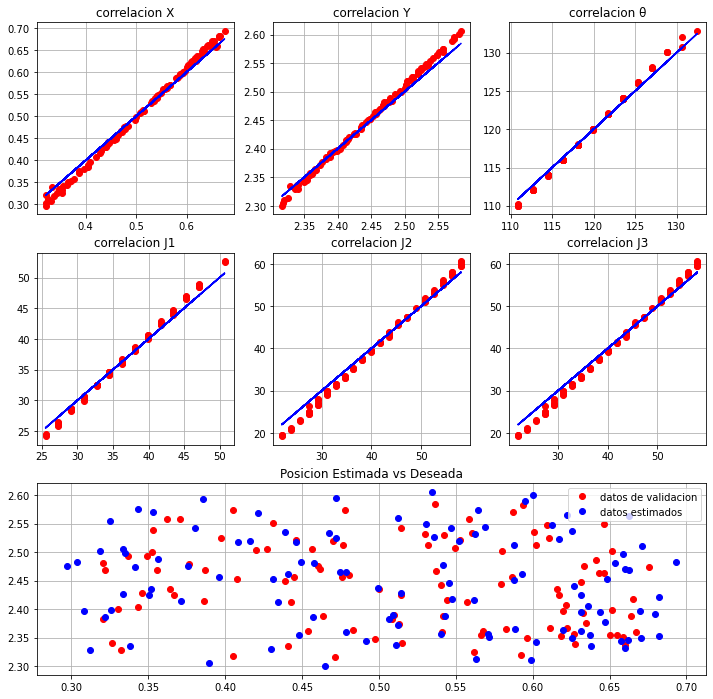


Red numero 77

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9965554481806386

MSE posicion:  [1.37519073e-04 9.13124525e-05 3.11630836e-01]
MAE posicion:  [0.00988329 0.00776462 0.47691619]
RMSE posicion:  [0.01172685 0.00955575 0.55823905]

MSE 2D posicion:  0.00022883152562309489
RMSE 2D posicion:  0.015127178376124706

MSE joints:  [0.66021898 2.4286107  1.43863361]
MAE joints:  [0.63300684 1.31802205 1.06089109]
RMSE joints:  [0.8125386  1.55840005 1.19943053]



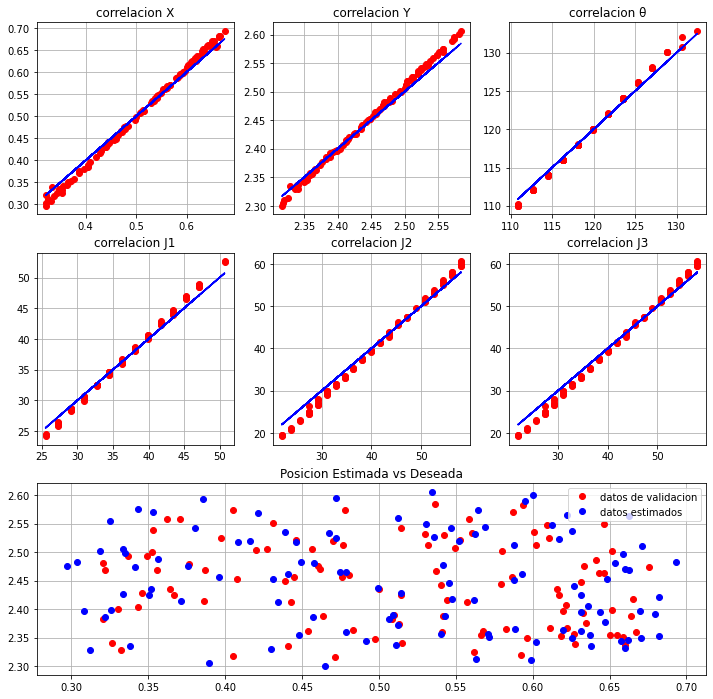


Red numero 78

capas ocultas: (10, 10)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9904594205860834

MSE posicion:  [7.51382933e-04 1.46214426e-04 1.29132934e+00]
MAE posicion:  [0.02237962 0.00998949 0.96031147]
RMSE posicion:  [0.02741137 0.01209192 1.13636673]

MSE 2D posicion:  0.0008975973587477593
RMSE 2D posicion:  0.029959929218003157

MSE joints:  [0.63670374 2.30353415 1.47195944]
MAE joints:  [0.65956744 1.28573514 0.97190993]
RMSE joints:  [0.79793718 1.51773982 1.21324335]



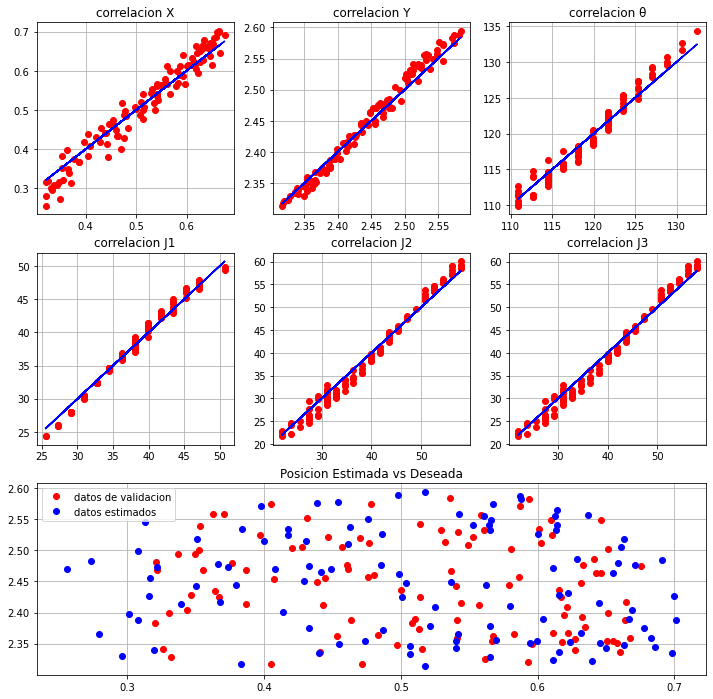


Red numero 79

capas ocultas: (10, 10)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9778066815840254

MSE posicion:  [1.86758071e-03 1.97615080e-04 2.60211982e+00]
MAE posicion:  [0.03363587 0.01198637 1.28486107]
RMSE posicion:  [0.04321551 0.01405756 1.61310875]

MSE 2D posicion:  0.002065195788567524
RMSE 2D posicion:  0.0454444252749171

MSE joints:  [1.30945991 4.56166543 2.56495156]
MAE joints:  [0.91930665 1.72534144 1.30484649]
RMSE joints:  [1.14431635 2.13580557 1.60154661]



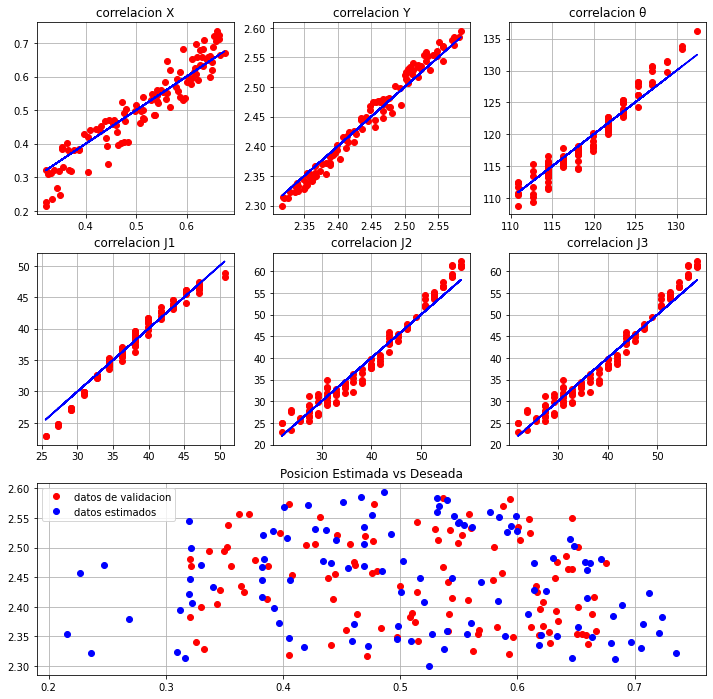


Red numero 80

capas ocultas: (10, 10)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9592031804585363

MSE posicion:  [2.65600337e-03 3.41223362e-04 3.95082864e+00]
MAE posicion:  [0.04188474 0.01474334 1.60329831]
RMSE posicion:  [0.05153643 0.01847223 1.98766915]

MSE 2D posicion:  0.002997226736503166
RMSE 2D posicion:  0.05474693358082411

MSE joints:  [1.49627563 4.91021817 2.25762917]
MAE joints:  [1.02023192 1.61326409 1.22191031]
RMSE joints:  [1.22322346 2.21590121 1.5025409 ]



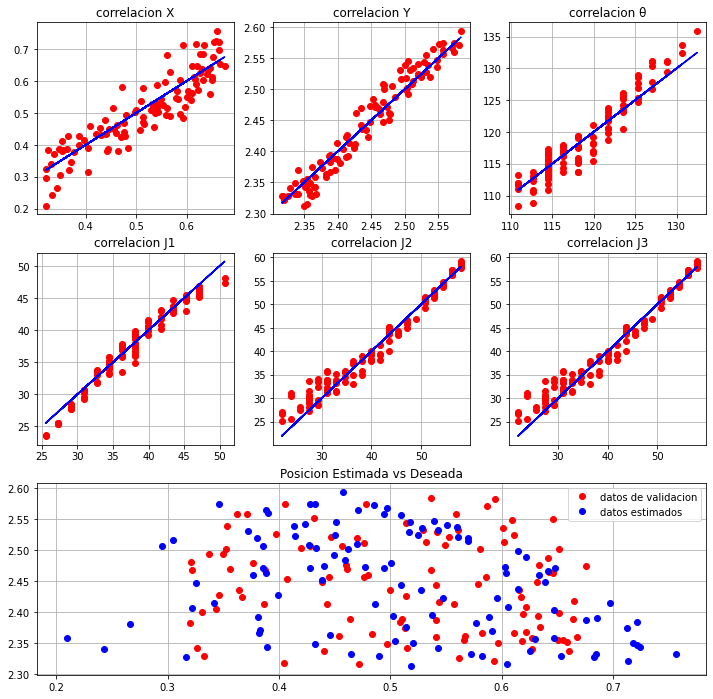


Red numero 81

capas ocultas: (10, 10)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9880975161989131

MSE posicion:  [2.21385534e-03 1.71669649e-04 2.85163765e+00]
MAE posicion:  [0.03261977 0.01077792 1.21357335]
RMSE posicion:  [0.04705162 0.01310228 1.68867926]

MSE 2D posicion:  0.002385524992771953
RMSE 2D posicion:  0.048841836500810996

MSE joints:  [0.76212787 1.79363088 1.53747623]
MAE joints:  [0.66439427 1.16371189 1.03170982]
RMSE joints:  [0.87299935 1.33926505 1.23995009]



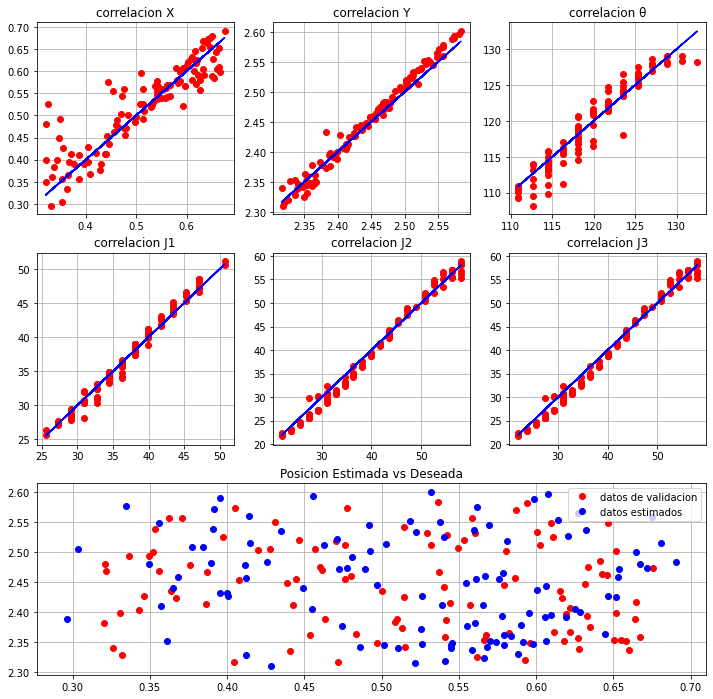


Red numero 82

capas ocultas: (10, 10)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9773703102321321

MSE posicion:  [5.22290087e-03 1.75089026e-04 5.73496077e+00]
MAE posicion:  [0.05306509 0.01099542 1.74347129]
RMSE posicion:  [0.07226964 0.01323212 2.39477781]

MSE 2D posicion:  0.005397989893754057
RMSE 2D posicion:  0.07347101396982389

MSE joints:  [1.33023539 3.5092812  2.03223212]
MAE joints:  [0.93734253 1.48510491 1.18168217]
RMSE joints:  [1.15335831 1.87330756 1.42556379]



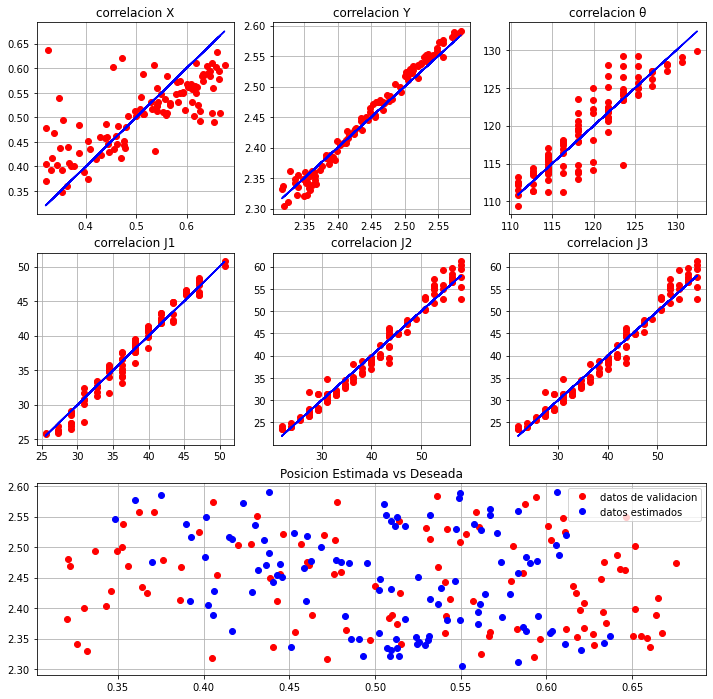


Red numero 83

capas ocultas: (10, 10)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9365652851682763

MSE posicion:  [2.15943773e-02 2.78651576e-04 2.04756527e+01]
MAE posicion:  [0.11911972 0.01285521 3.64304252]
RMSE posicion:  [0.14695025 0.01669286 4.52500306]

MSE 2D posicion:  0.021873028833257046
RMSE 2D posicion:  0.14789533066752664

MSE joints:  [ 2.24678048 11.60039248  1.74845243]
MAE joints:  [1.17697045 2.65903013 1.06107728]
RMSE joints:  [1.49892644 3.40593489 1.3222906 ]



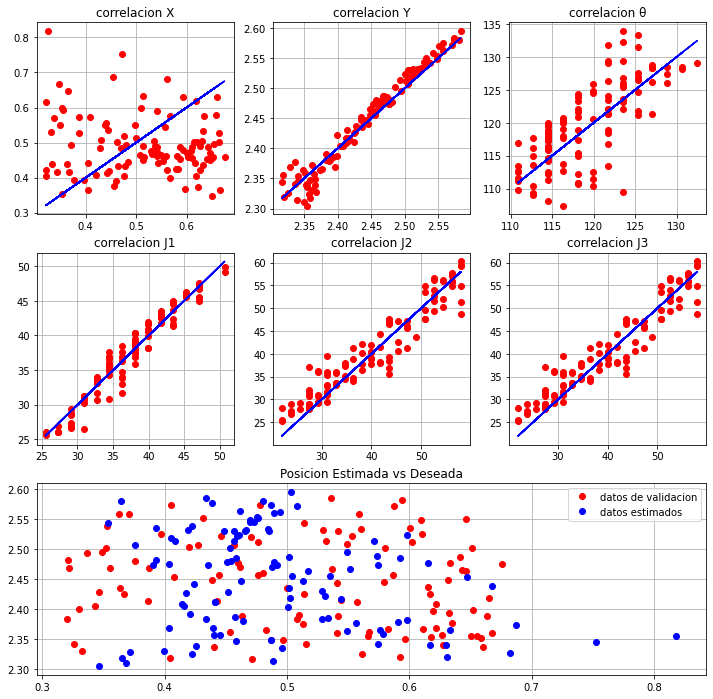


Red numero 84

capas ocultas: (10, 10)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.990929971755311

MSE posicion:  [2.06548614e-04 7.84370178e-05 4.86723501e-01]
MAE posicion:  [0.01162704 0.00698651 0.57970488]
RMSE posicion:  [0.0143718  0.00885647 0.69765572]

MSE 2D posicion:  0.00028498563154808675
RMSE 2D posicion:  0.01688151745395202

MSE joints:  [0.48261701 2.19169123 1.7243266 ]
MAE joints:  [0.565114   1.2109305  1.14253602]
RMSE joints:  [0.69470642 1.48043616 1.31313617]



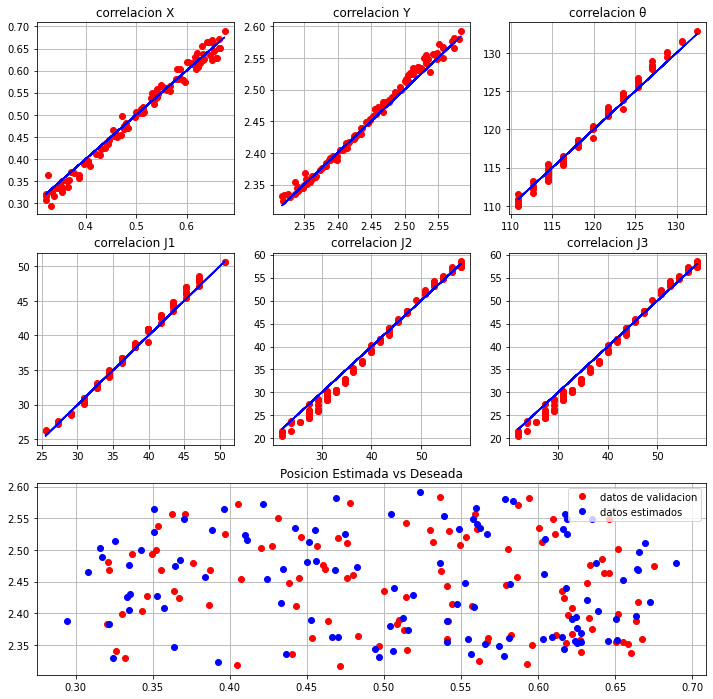


Red numero 85

capas ocultas: (10, 10)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9828320098774018

MSE posicion:  [3.45094499e-03 1.99127726e-04 3.22518326e+00]
MAE posicion:  [0.04532495 0.01133517 1.49226816]
RMSE posicion:  [0.05874474 0.01411126 1.79587952]

MSE 2D posicion:  0.003650072714936962
RMSE 2D posicion:  0.06041583165807587

MSE joints:  [0.58279972 4.93275467 1.63313248]
MAE joints:  [0.62737836 1.82530909 1.04551686]
RMSE joints:  [0.7634132  2.22098057 1.27794072]



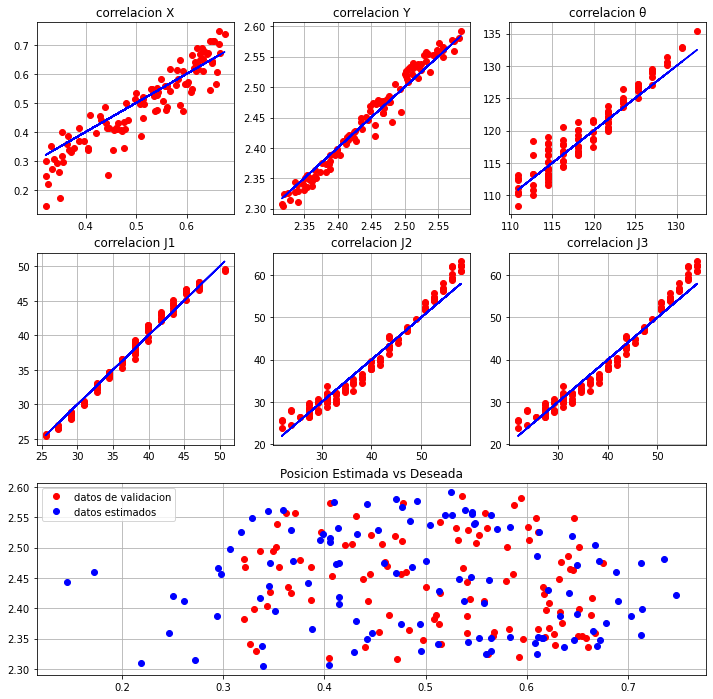


Red numero 86

capas ocultas: (10, 10)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9744177487144089

MSE posicion:  [3.79177342e-03 2.27766806e-04 4.65771509e+00]
MAE posicion:  [0.05047842 0.01219494 1.83293665]
RMSE posicion:  [0.06157738 0.01509195 2.15817402]

MSE 2D posicion:  0.004019540226648326
RMSE 2D posicion:  0.06339984405854897

MSE joints:  [0.82272459 5.277196   3.13861969]
MAE joints:  [0.76496145 1.85223278 1.39570052]
RMSE joints:  [0.90704167 2.29721483 1.77161499]



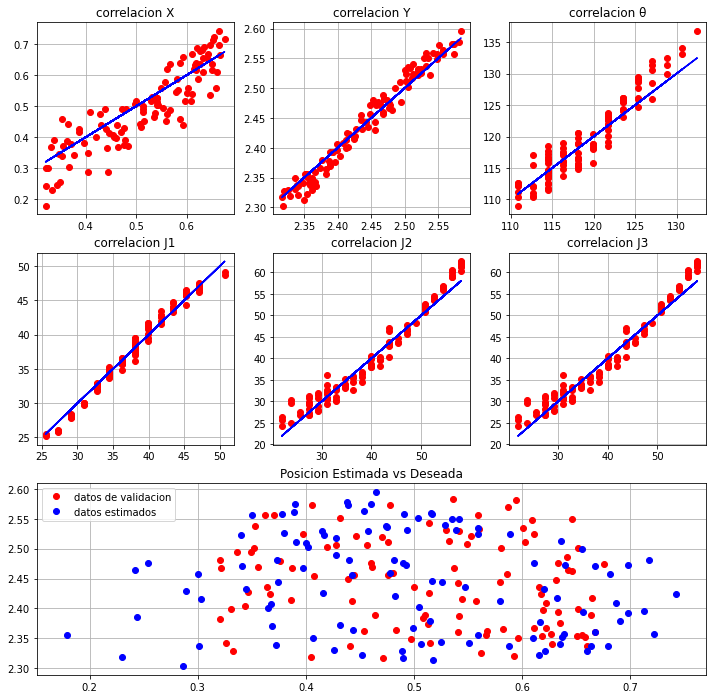


Red numero 87

capas ocultas: (10, 10)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.968481246169758

MSE posicion:  [1.25919585e-02 1.04932637e-04 1.26822639e+01]
MAE posicion:  [0.09750691 0.00861091 3.08437895]
RMSE posicion:  [0.1122139  0.01024366 3.56121664]

MSE 2D posicion:  0.012696891108907385
RMSE 2D posicion:  0.11268048237786074

MSE joints:  [2.23760092 4.09889777 2.05950516]
MAE joints:  [1.23012189 1.57762474 1.18945099]
RMSE joints:  [1.49586126 2.02457348 1.43509761]



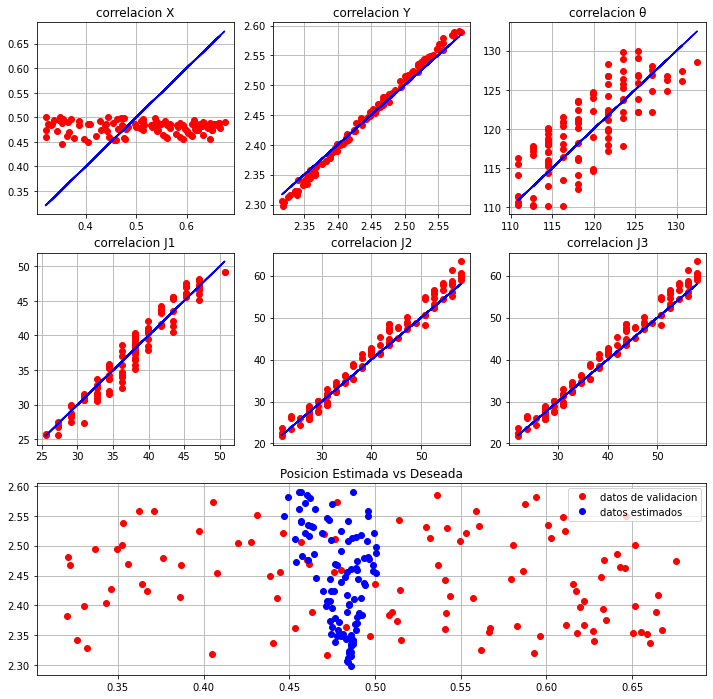


Red numero 88

capas ocultas: (10, 10)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9897695024063281

MSE posicion:  [7.03194151e-04 1.78248498e-04 6.47185726e-01]
MAE posicion:  [0.01938597 0.01119737 0.60437885]
RMSE posicion:  [0.02651781 0.01335097 0.80447854]

MSE 2D posicion:  0.0008814426490954535
RMSE 2D posicion:  0.0296890998363954

MSE joints:  [0.8366829  1.61835253 1.57055847]
MAE joints:  [0.72946621 1.04702998 1.06187093]
RMSE joints:  [0.91470372 1.27214485 1.25321924]



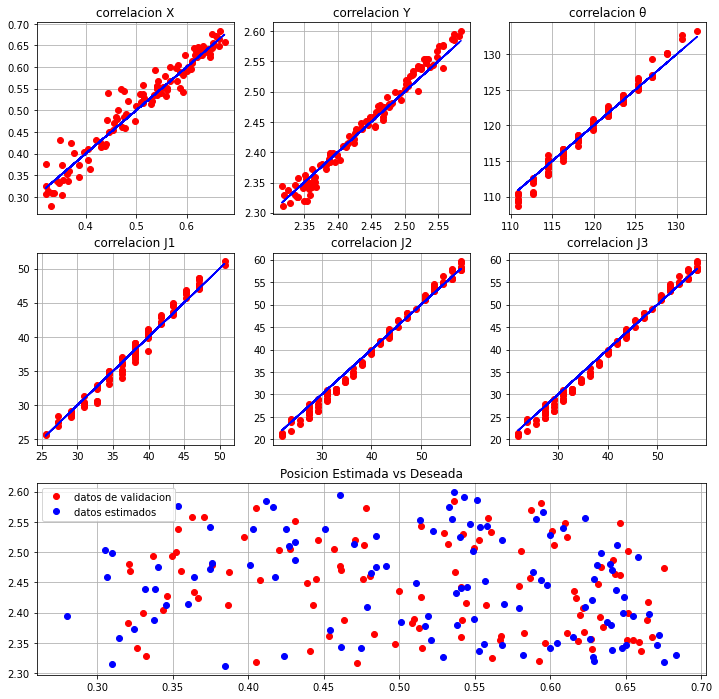


Red numero 89

capas ocultas: (10, 10)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9683608451229587

MSE posicion:  [1.00601400e-03 2.54860112e-04 1.54463601e+00]
MAE posicion:  [0.02505606 0.0130003  1.03655701]
RMSE posicion:  [0.03171772 0.01596434 1.24283386]

MSE 2D posicion:  0.0012608741082863252
RMSE 2D posicion:  0.035508789169532734

MSE joints:  [1.47825504 4.17604473 3.6163579 ]
MAE joints:  [0.94002257 1.6287009  1.64823893]
RMSE joints:  [1.21583512 2.04353731 1.9016724 ]



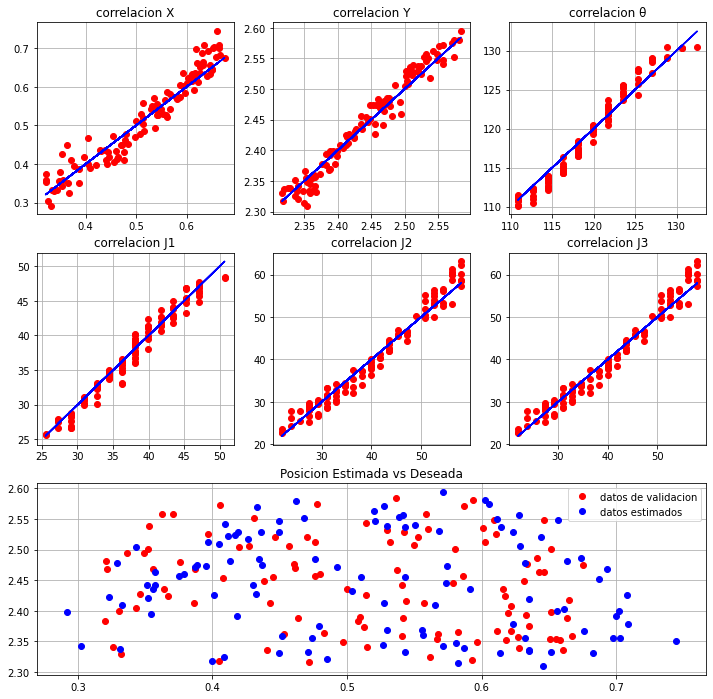


Red numero 90

capas ocultas: (5, 10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9964869423803929

MSE posicion:  [2.16320162e-04 7.64675926e-05 3.80509440e-01]
MAE posicion:  [0.0127236  0.00720448 0.54277562]
RMSE posicion:  [0.01470783 0.00874458 0.61685447]

MSE 2D posicion:  0.00029278775416959
RMSE 2D posicion:  0.017111041878552866

MSE joints:  [0.57812229 2.44429162 1.51041664]
MAE joints:  [0.63633806 1.27351522 1.07742577]
RMSE joints:  [0.76034353 1.56342305 1.22899009]



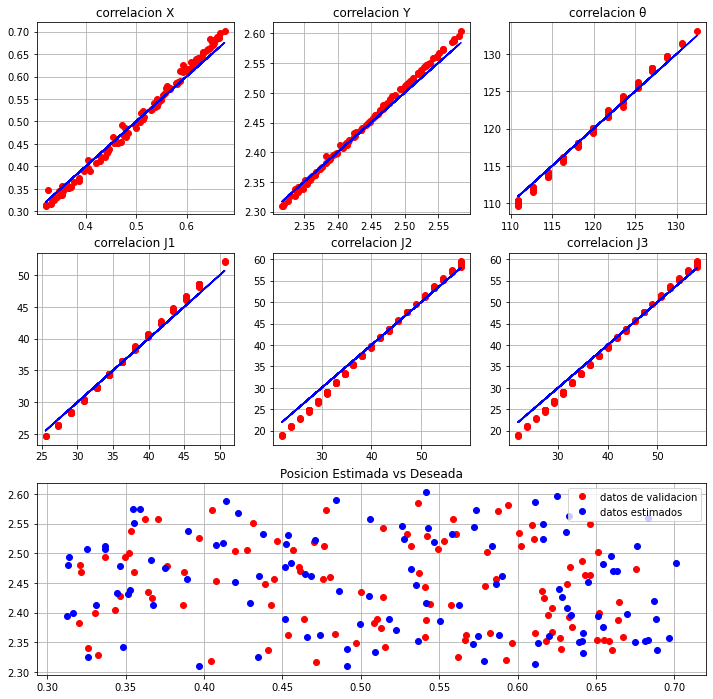


Red numero 91

capas ocultas: (5, 10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9964869423803929

MSE posicion:  [2.16320162e-04 7.64675926e-05 3.80509440e-01]
MAE posicion:  [0.0127236  0.00720448 0.54277562]
RMSE posicion:  [0.01470783 0.00874458 0.61685447]

MSE 2D posicion:  0.00029278775416959
RMSE 2D posicion:  0.017111041878552866

MSE joints:  [0.57812229 2.44429162 1.51041664]
MAE joints:  [0.63633806 1.27351522 1.07742577]
RMSE joints:  [0.76034353 1.56342305 1.22899009]



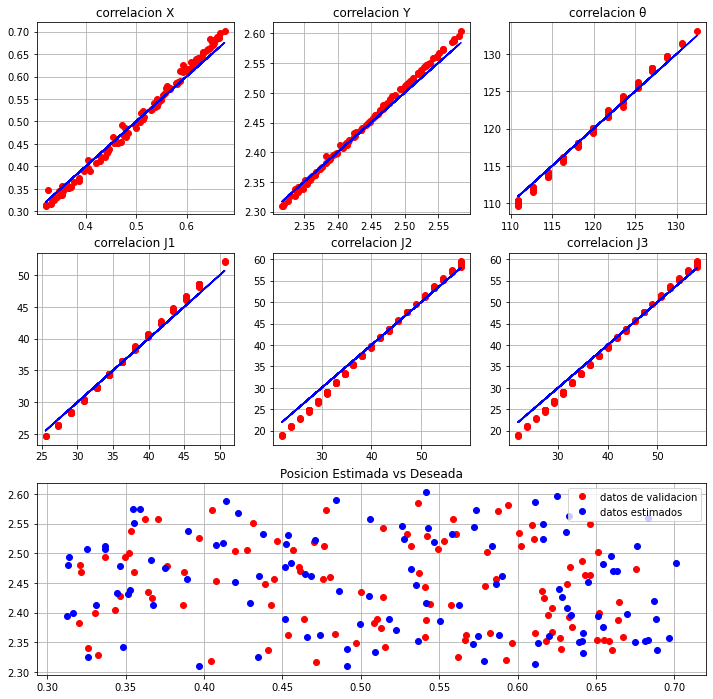


Red numero 92

capas ocultas: (5, 10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9964869423803929

MSE posicion:  [2.16320162e-04 7.64675926e-05 3.80509440e-01]
MAE posicion:  [0.0127236  0.00720448 0.54277562]
RMSE posicion:  [0.01470783 0.00874458 0.61685447]

MSE 2D posicion:  0.00029278775416959
RMSE 2D posicion:  0.017111041878552866

MSE joints:  [0.57812229 2.44429162 1.51041664]
MAE joints:  [0.63633806 1.27351522 1.07742577]
RMSE joints:  [0.76034353 1.56342305 1.22899009]



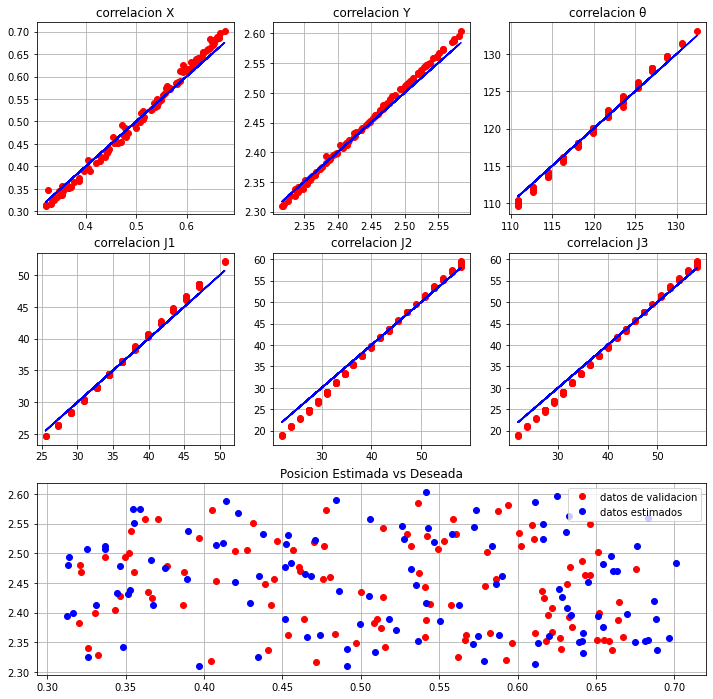


Red numero 93

capas ocultas: (5, 10, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.9753826709809866

MSE posicion:  [1.13061676e-02 1.17342853e-04 1.19080190e+01]
MAE posicion:  [0.09206537 0.00932532 2.96876283]
RMSE posicion:  [0.10633046 0.01083249 3.45079976]

MSE 2D posicion:  0.011423510409721315
RMSE 2D posicion:  0.10688082339559943

MSE joints:  [1.95347243 4.27579352 2.43643045]
MAE joints:  [1.19623193 1.69286544 1.34396515]
RMSE joints:  [1.39766678 2.0677992  1.56090693]



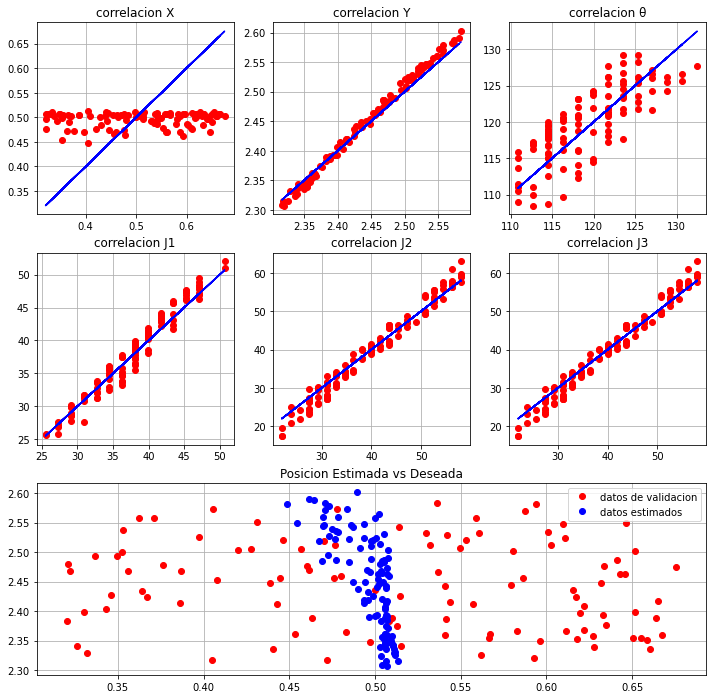


Red numero 94

capas ocultas: (5, 10, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.9753826709809866

MSE posicion:  [1.13061676e-02 1.17342853e-04 1.19080190e+01]
MAE posicion:  [0.09206537 0.00932532 2.96876283]
RMSE posicion:  [0.10633046 0.01083249 3.45079976]

MSE 2D posicion:  0.011423510409721315
RMSE 2D posicion:  0.10688082339559943

MSE joints:  [1.95347243 4.27579352 2.43643045]
MAE joints:  [1.19623193 1.69286544 1.34396515]
RMSE joints:  [1.39766678 2.0677992  1.56090693]



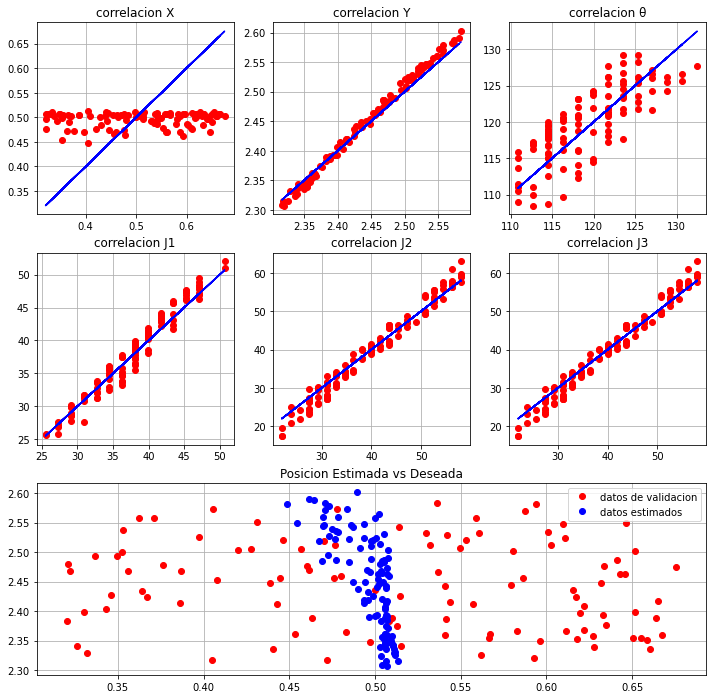


Red numero 95

capas ocultas: (5, 10, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.9753826709809866

MSE posicion:  [1.13061676e-02 1.17342853e-04 1.19080190e+01]
MAE posicion:  [0.09206537 0.00932532 2.96876283]
RMSE posicion:  [0.10633046 0.01083249 3.45079976]

MSE 2D posicion:  0.011423510409721315
RMSE 2D posicion:  0.10688082339559943

MSE joints:  [1.95347243 4.27579352 2.43643045]
MAE joints:  [1.19623193 1.69286544 1.34396515]
RMSE joints:  [1.39766678 2.0677992  1.56090693]



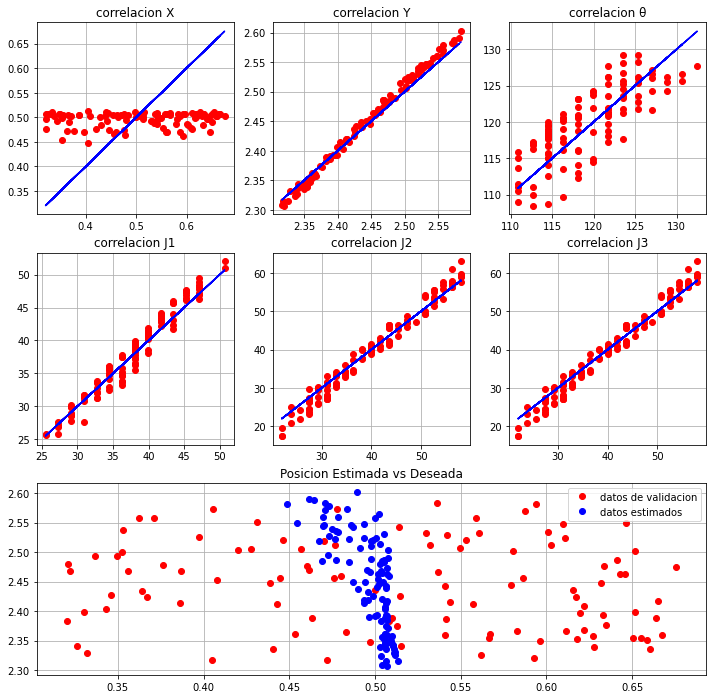


Red numero 96

capas ocultas: (5, 10, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.980720085891306

MSE posicion:  [6.69784698e-04 2.03334073e-04 7.47700250e-01]
MAE posicion:  [0.02021077 0.01106187 0.71940793]
RMSE posicion:  [0.0258802  0.01425953 0.86469662]

MSE 2D posicion:  0.0008731187710865158
RMSE 2D posicion:  0.029548583233152074

MSE joints:  [0.78349471 2.26087913 1.39795038]
MAE joints:  [0.69247632 1.23971692 0.96651772]
RMSE joints:  [0.88515236 1.503622   1.18234952]



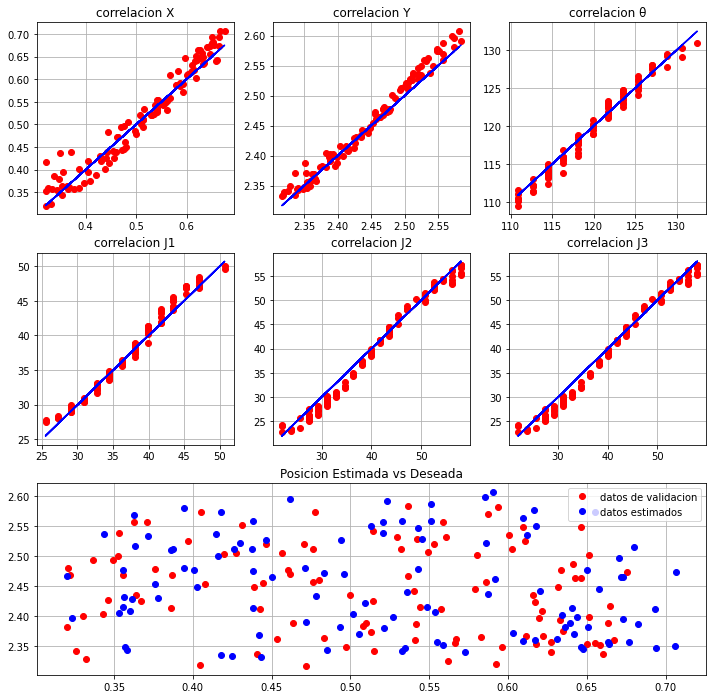


Red numero 97

capas ocultas: (5, 10, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.9620596124155263

MSE posicion:  [7.21580043e-04 2.40712867e-04 1.26349502e+00]
MAE posicion:  [0.02109327 0.01265476 0.89174238]
RMSE posicion:  [0.02686224 0.01551492 1.12405295]

MSE 2D posicion:  0.0009622929097861014
RMSE 2D posicion:  0.031020846374431844

MSE joints:  [1.77915238 4.06757554 2.31278696]
MAE joints:  [1.04340379 1.68365965 1.1699349 ]
RMSE joints:  [1.33384871 2.01682313 1.52078498]



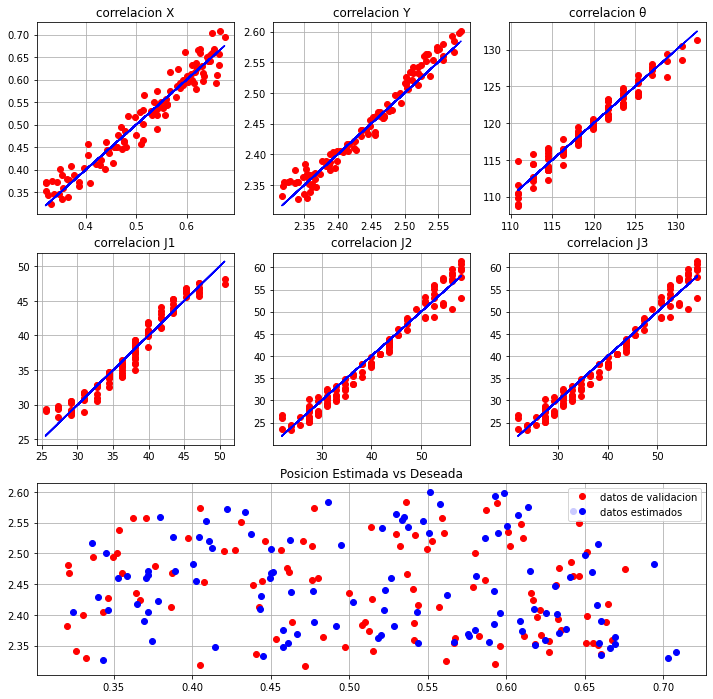


Red numero 98

capas ocultas: (5, 10, 5)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9049485217414768

MSE posicion:  [7.01160161e-03 5.38404608e-04 3.97637368e+00]
MAE posicion:  [0.07211498 0.01969372 1.61081296]
RMSE posicion:  [0.08373531 0.02320355 1.99408467]

MSE 2D posicion:  0.007550006223184005
RMSE 2D posicion:  0.08689077179530634

MSE joints:  [5.32717611 6.29288432 4.47466603]
MAE joints:  [1.9080472  2.01163271 1.56675421]
RMSE joints:  [2.30806761 2.5085622  2.11534064]



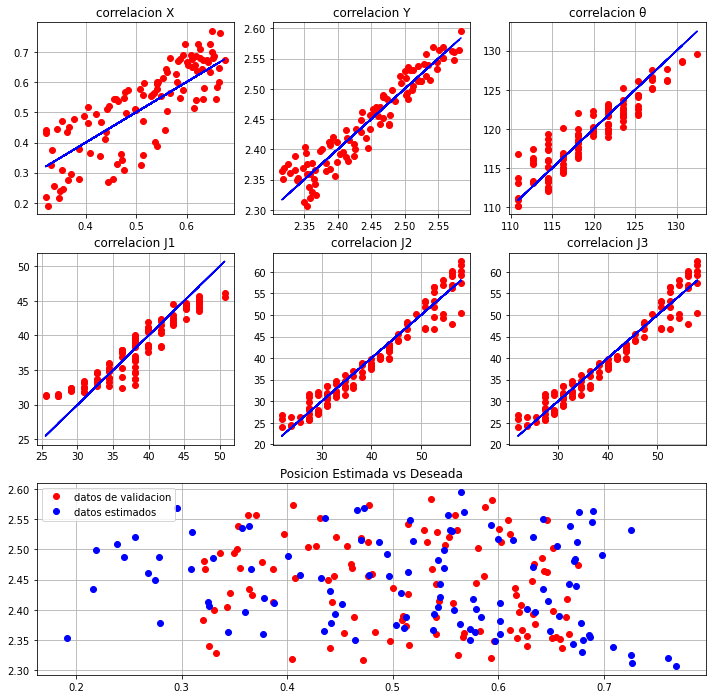


Red numero 99

capas ocultas: (5, 10, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.7999602564379323

MSE posicion:  [1.14669427e-02 5.50936615e-03 1.81802245e+01]
MAE posicion:  [0.09322737 0.06405443 3.3880103 ]
RMSE posicion:  [0.10708381 0.0742251  4.26382745]

MSE 2D posicion:  0.016976308822559225
RMSE 2D posicion:  0.1302931649111312

MSE joints:  [12.09854326  5.59783064 22.44009034]
MAE joints:  [2.95385141 1.98910973 3.97610748]
RMSE joints:  [3.47829603 2.36597351 4.73709725]



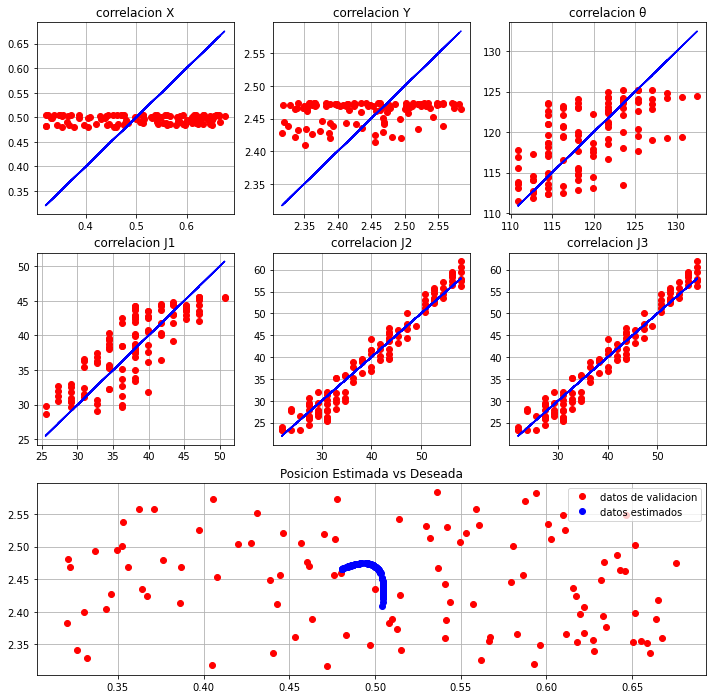


Red numero 100

capas ocultas: (5, 10, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.785319466608092

MSE posicion:  [1.16240793e-02 5.50926283e-03 1.84075878e+01]
MAE posicion:  [0.09361322 0.06404117 3.40929852]
RMSE posicion:  [0.10781502 0.07422441 4.29040648]

MSE 2D posicion:  0.017133342124324377
RMSE 2D posicion:  0.13089439302095554

MSE joints:  [12.57541229  6.78497369 22.72248864]
MAE joints:  [3.04497436 2.102691   3.9668864 ]
RMSE joints:  [3.54618278 2.60479821 4.76681116]



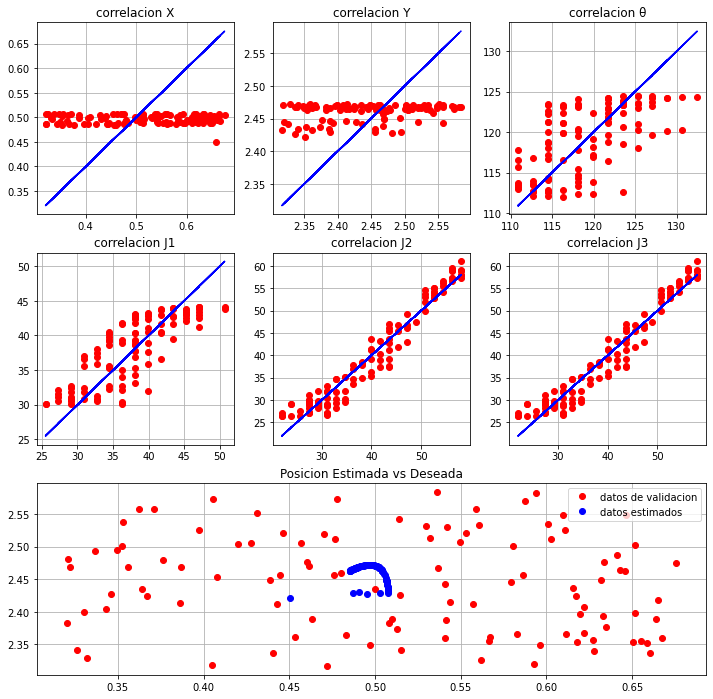


Red numero 101

capas ocultas: (5, 10, 5)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.12343033553671064

MSE posicion:  [1.32438583e-02 2.72762428e-03 2.34697732e+01]
MAE posicion:  [0.09521149 0.04273899 4.03733125]
RMSE posicion:  [0.11508196 0.05222666 4.8445612 ]

MSE 2D posicion:  0.015971482632479737
RMSE 2D posicion:  0.12637833134077905

MSE joints:  [ 32.25942282 113.24956138  66.55528422]
MAE joints:  [4.76728489 9.26332962 7.11173955]
RMSE joints:  [ 5.67973792 10.64187772  8.1581422 ]



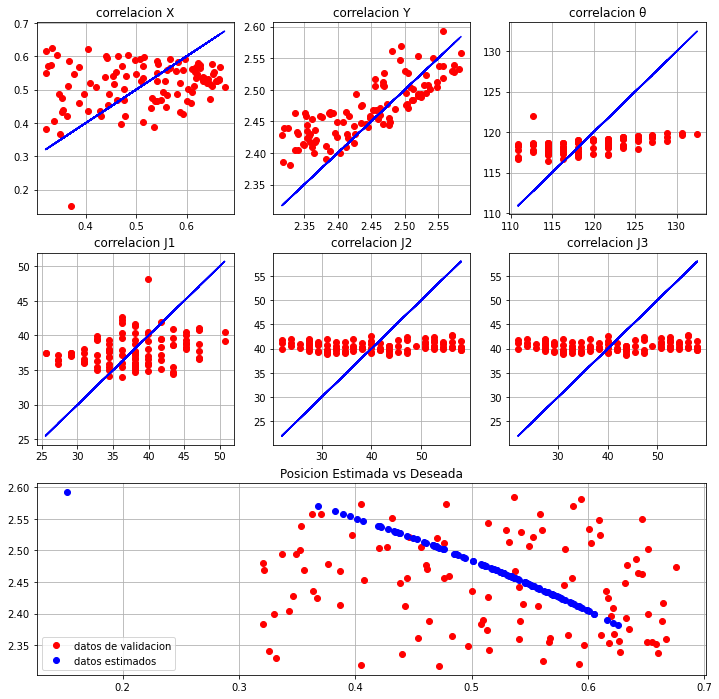


Red numero 102

capas ocultas: (5, 10, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

R2:  0.9917726710050682

MSE posicion:  [5.78998093e-04 1.14057144e-04 6.60124497e-01]
MAE posicion:  [0.01981709 0.00879312 0.69798127]
RMSE posicion:  [0.02406238 0.01067975 0.81248046]

MSE 2D posicion:  0.0006930552367629689
RMSE 2D posicion:  0.026325942276829693

MSE joints:  [0.47482426 1.7578822  1.40722825]
MAE joints:  [0.58762746 1.09408288 0.96582899]
RMSE joints:  [0.68907493 1.3258515  1.18626652]



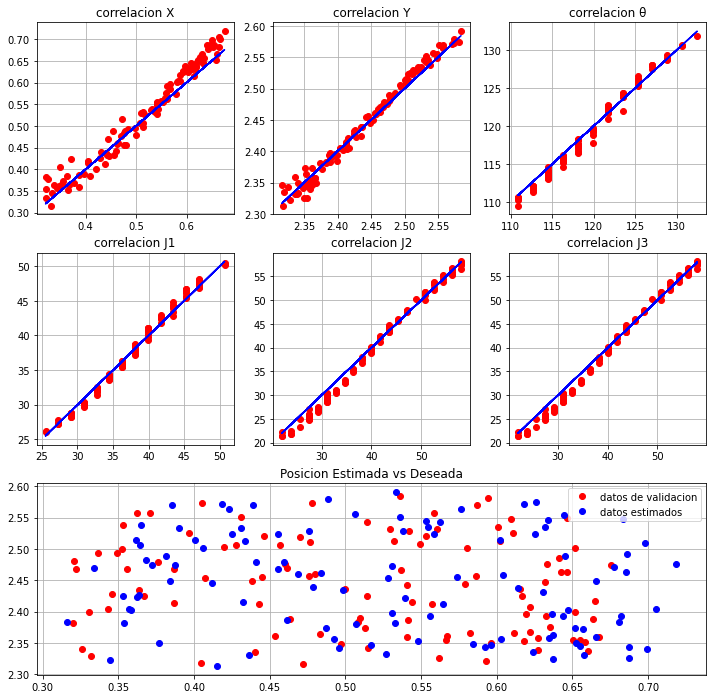


Red numero 103

capas ocultas: (5, 10, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.01

R2:  0.980964270955428

MSE posicion:  [1.29267573e-03 1.84698666e-04 1.89512814e+00]
MAE posicion:  [0.0290885  0.01055284 1.1015066 ]
RMSE posicion:  [0.0359538  0.01359039 1.37663653]

MSE 2D posicion:  0.0014773743964008436
RMSE 2D posicion:  0.038436628317281465

MSE joints:  [0.91280209 1.89485146 1.61362158]
MAE joints:  [0.7603068  1.19578052 1.07317365]
RMSE joints:  [0.95540677 1.37653604 1.27028405]



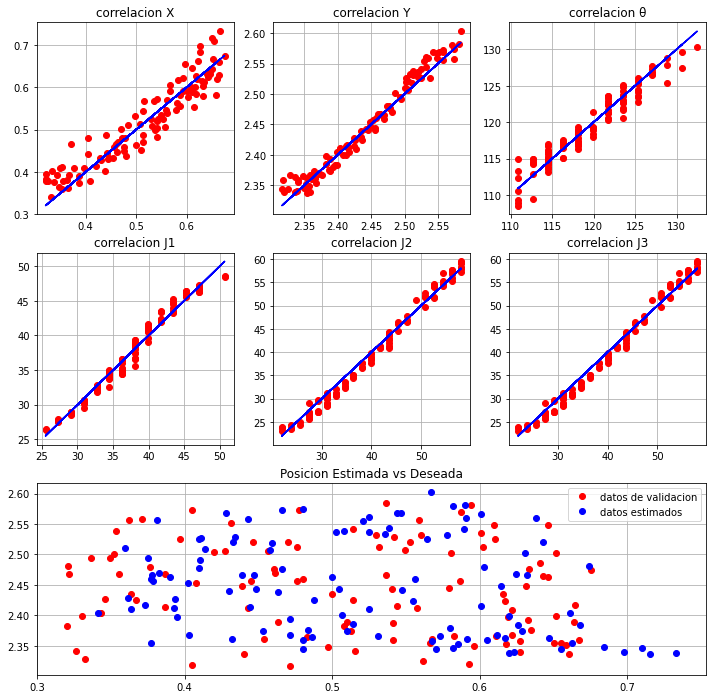


Red numero 104

capas ocultas: (5, 10, 5)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.001

R2:  0.9607657369360059

MSE posicion:  [3.51358442e-03 2.50044952e-04 3.99712247e+00]
MAE posicion:  [0.04782239 0.01246307 1.62053566]
RMSE posicion:  [0.0592755  0.01581281 1.99928049]

MSE 2D posicion:  0.0037636293741599813
RMSE 2D posicion:  0.061348426012082666

MSE joints:  [1.69694671 3.76441575 2.45522151]
MAE joints:  [0.9676668  1.70112317 1.2752719 ]
RMSE joints:  [1.30266907 1.94021023 1.56691465]



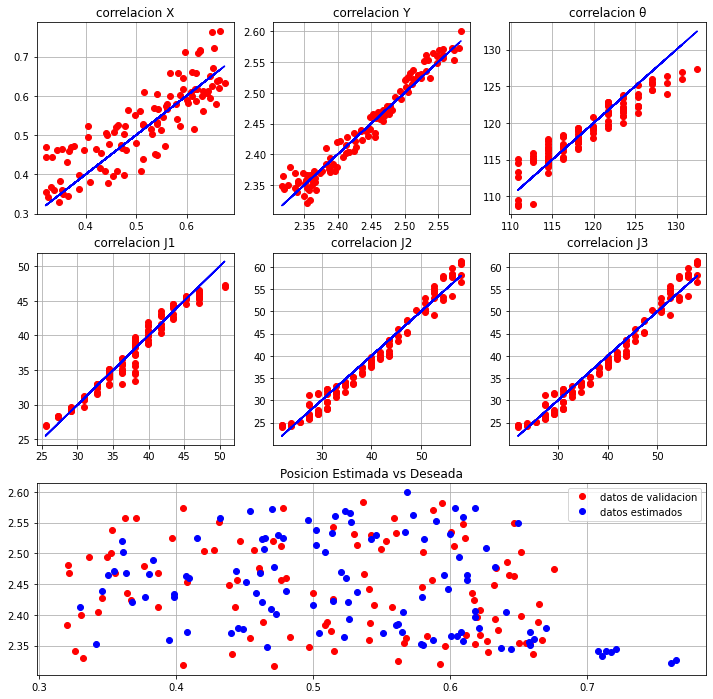


Red numero 105

capas ocultas: (5, 10, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.1

R2:  0.8000225443867078

MSE posicion:  [1.19929831e-02 5.31573244e-03 1.80220005e+01]
MAE posicion:  [0.09542823 0.06356167 3.42303492]
RMSE posicion:  [0.10951248 0.07290907 4.24523268]

MSE 2D posicion:  0.01730871551712849
RMSE 2D posicion:  0.13156259163276046

MSE joints:  [12.57749238  5.79742216 18.39694366]
MAE joints:  [3.04404515 1.98425341 3.69826291]
RMSE joints:  [3.54647605 2.40778366 4.28916585]



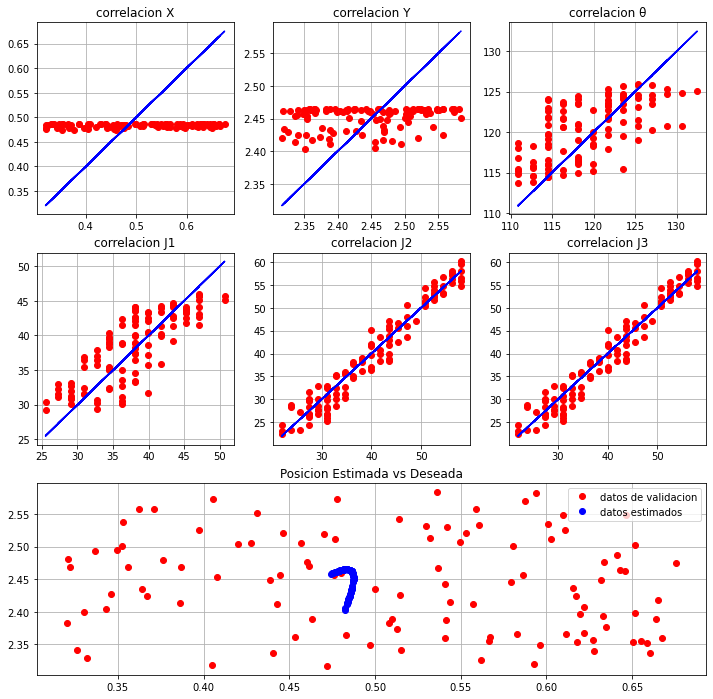


Red numero 106

capas ocultas: (5, 10, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.01

R2:  0.7965687389666977

MSE posicion:  [1.13298600e-02 5.57408238e-03 1.81768193e+01]
MAE posicion:  [0.09271145 0.06436705 3.39572877]
RMSE posicion:  [0.10644182 0.07465978 4.26342811]

MSE 2D posicion:  0.01690394241037088
RMSE 2D posicion:  0.1300151622326061

MSE joints:  [12.3682321   5.1932077  21.67742558]
MAE joints:  [2.99995305 1.92038153 3.89984181]
RMSE joints:  [3.51684974 2.27886105 4.65590223]



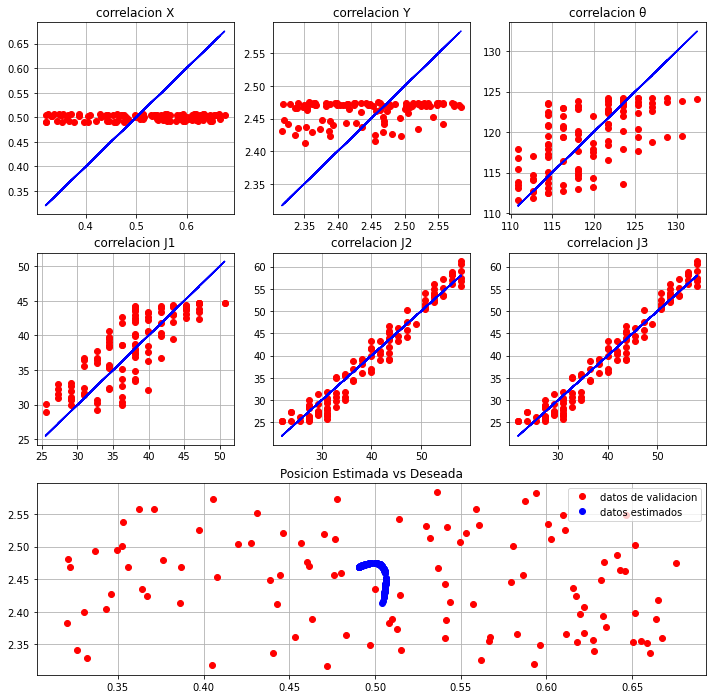


Red numero 107

capas ocultas: (5, 10, 5)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.001

R2:  0.7503842515374414

MSE posicion:  [1.24956691e-02 5.78479935e-03 1.79485765e+01]
MAE posicion:  [0.09297352 0.06523834 3.41858463]
RMSE posicion:  [0.11178403 0.07605787 4.23657603]

MSE 2D posicion:  0.018280468422447314
RMSE 2D posicion:  0.13520528252419473

MSE joints:  [15.68184399  7.83352828 19.68389651]
MAE joints:  [3.37904113 2.24389528 3.74011169]
RMSE joints:  [3.96003081 2.7988441  4.43665375]



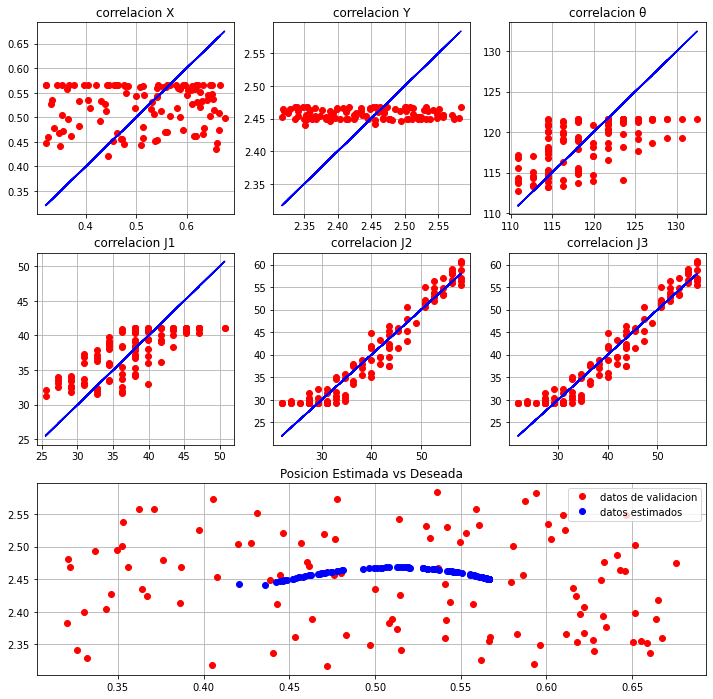

In [ ]:
#@title RESULTADOS POR RED
for num_red in range(len(MLPNN)): #len(MLPNN)
  metrica = METRICS[num_red]
  testx = XTEST[num_red]
  testy = YTEST[num_red]
  calcx = XCALC[num_red]
  calcy = YCALC[num_red]
  param = params[num_red]
  print()
  print("Red numero",num_red)
  print()
  print("capas ocultas:", param["layer"])
  print("solucionador:", param["solver"])
  print("funcion de activacion:", param["activation"])
  print("tasa de aprendizaje:", param["lrate"])
  print()
  print("R2: ",MLPNN[num_red].score(x_test,y_test))
  print()
  print("MSE posicion: ",metrica[0][0])
  print("MAE posicion: ",metrica[0][1])
  print("RMSE posicion: ",metrica[0][2])
  print()
  print("MSE 2D posicion: ",metrica[0][0][0]+metrica[0][0][1])
  print("RMSE 2D posicion: ",(metrica[0][0][0]+metrica[0][0][1])**0.5)
  print()
  print("MSE joints: ",metrica[1][0])
  print("MAE joints: ",metrica[1][1])
  print("RMSE joints: ",metrica[1][2])
  print()

  plot_result(testx,testy,calcx,calcy)
  

##VALORES DE CADA RED

In [ ]:
#@title 15 MEJORES REDES
METRICS = np.array(METRICS)
data = {}
keys = params[0].keys()

for key in keys:
  data[key] = []

for param in params:
  for key in keys:
    data[key].append(param[key])

data["RMSE 2D"] = np.sqrt(METRICS[:,0,0,0]+METRICS[:,0,0,1])
data["RMSE θ"] = METRICS[:,0,0,2]
data["RMSE J"] = np.sqrt(METRICS[:,1,0,0]+METRICS[:,1,0,1]+METRICS[:,1,0,2])

df = pd.DataFrame(data)
df = df.sort_values(by=['RMSE 2D','RMSE θ','RMSE J']).groupby('RMSE 2D').head(1)
df = df.head(15)
df

,activation,solver,layer,lrate,RMSE 2D,RMSE θ,RMSE J
72,tanh,lbfgs,"(10, 10)",0.10,0.014742,0.336089,2.171882
75,relu,lbfgs,"(10, 10)",0.10,0.015127,0.311631,2.127784
54,tanh,lbfgs,"(10, 5)",0.10,0.015175,0.376327,2.180979
36,tanh,lbfgs,"(5, 5)",0.10,0.015242,0.367444,2.175686
18,tanh,lbfgs,"(10,)",0.10,0.015783,0.348602,2.123440
57,relu,lbfgs,"(10, 5)",0.10,0.015985,0.339855,2.211347
84,tanh,adam,"(10, 10)",0.10,0.016882,0.486724,2.097292
90,tanh,lbfgs,"(5, 10, 5)",0.10,0.017111,0.380509,2.129045
21,relu,lbfgs,"(10,)",0.10,0.017163,0.328295,2.153213
0,tanh,lbfgs,"(5,)",0.10,0.017200,0.333971,2.093584


##PRUEBA FINAL

In [ ]:
index_list = df.index.values.tolist()
anns = []
for index in index_list:
  anns.append(MLPNN[index])

In [ ]:
def normalizacion_condicionada(arr,mean,radius,rad=0.9):
  arr2 = arr.copy()
  for i in range(len(radius)):
    arr2[:,i] = (arr2[:,i]-mean[i])/radius[i]
  arr2 *= rad
  return arr2

In [ ]:
wtp = np.linspace(0,2*np.pi,100)
center=[0.5,2.45]
radius=0.05
xp = center[0]+radius*np.cos(wtp)
yp = center[1]+radius*np.sin(wtp)

centro=119
amplitud=10
funct=centro+amplitud*np.sin(wtp)

xs1=np.linspace(0.35,0.65,100)
ys1=2.35*np.ones(len(xs1))
ys2=np.linspace(2.35,2.55,100)
xs2=0.65*np.ones(len(ys2))
xs3=np.linspace(0.65,0.35,100)
ys3=2.55*np.ones(len(xs3))
ys4=np.linspace(2.55,2.35,100)
xs4=0.35*np.ones(len(ys4))
xp= np.hstack((xp,xs1,xs2,xs3,xs4))
yp= np.hstack((yp,ys1,ys2,ys3,ys4))

centro=119
amplitud=10
wtp = np.linspace(0,2*np.pi,400)
funct2 = centro+amplitud*np.sin(wtp)
funct= np.hstack((funct,funct2))

x_prueba = np.transpose(np.array([xp,yp,funct]))
x_prueba_norm = normalizacion_condicionada(x_prueba,inMean,inRadius)

In [ ]:
XPTEST = []
XPCALC = []

for ann in anns:
  y_calc_i_prueba = ann.predict(x_prueba_norm)
  y_calc_i_prueba_denorm = denormalizacion(y_calc_i_prueba,outMean,outRadius)

  x_calc_i_prueba_denorm = []
  for yc in y_calc_i_prueba_denorm:
    pos,ori = FKmodel(yc[0], yc[1], yc[2])
    pos = pos[-1]
    x_calc_i_prueba_denorm.append(np.hstack((pos,[ori])))
  x_calc_i_prueba_denorm = np.array(x_calc_i_prueba_denorm)

  XPTEST.append(x_prueba)
  XPCALC.append(x_calc_i_prueba_denorm)

In [ ]:
METRICS2 = []

for xt,xc in zip(XPTEST,XPCALC):
  METRICS2.append([metricas(xt,xc)])


Red numero 72

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [3.84355907e-04 1.07818109e-04 1.27566466e+00]
MAE posicion:  [0.01543743 0.00901585 0.98043081]
RMSE posicion:  [0.019605   0.01038355 1.12945326]

MSE 2D posicion:  0.0004921740150151333
RMSE 2D posicion:  0.02218499526741291



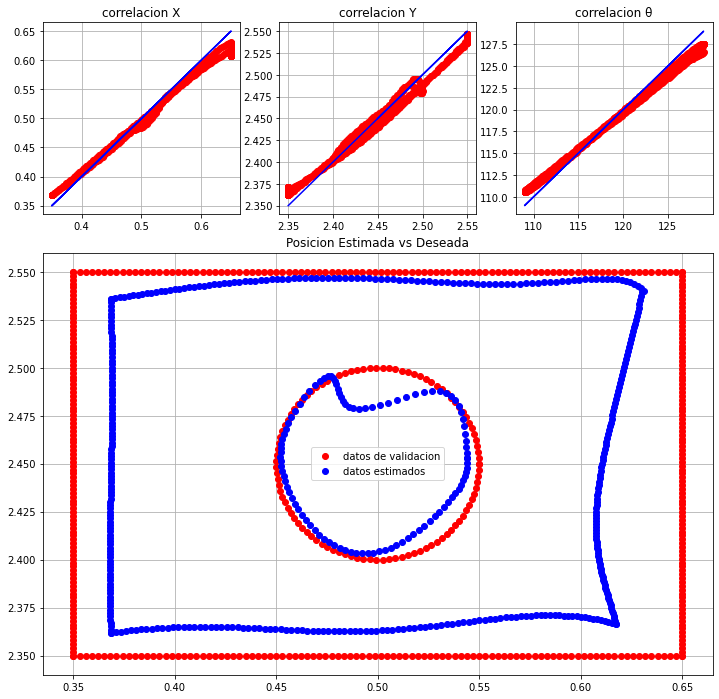


Red numero 75

capas ocultas: (10, 10)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

MSE posicion:  [4.44999553e-04 1.21032366e-04 8.82993876e-01]
MAE posicion:  [0.01693827 0.00927092 0.78436595]
RMSE posicion:  [0.02109501 0.01100147 0.93967754]

MSE 2D posicion:  0.0005660319185202471
RMSE 2D posicion:  0.023791425315021524



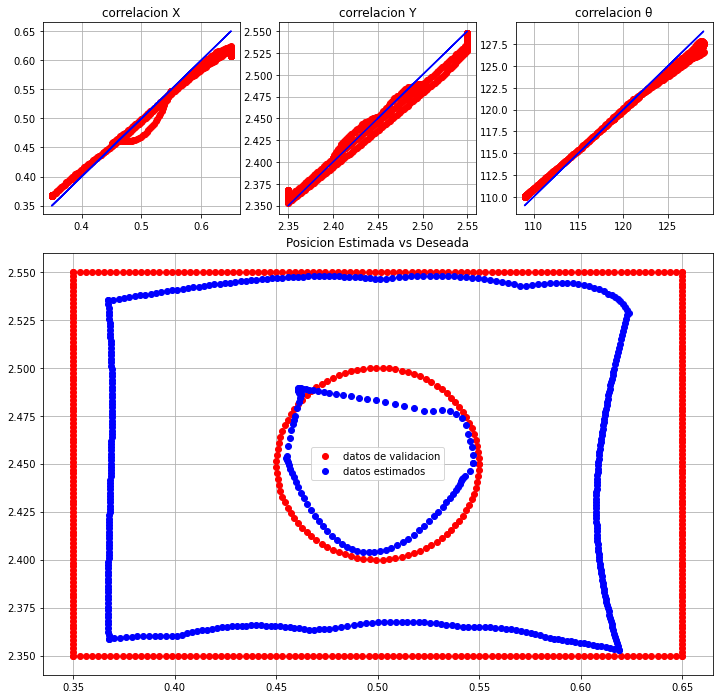


Red numero 54

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [1.93941085e-03 2.45734406e-04 5.46008631e-01]
MAE posicion:  [0.03167538 0.01202015 0.58408168]
RMSE posicion:  [0.04403874 0.01567592 0.73892397]

MSE 2D posicion:  0.0021851452562485192
RMSE 2D posicion:  0.04674553728698087



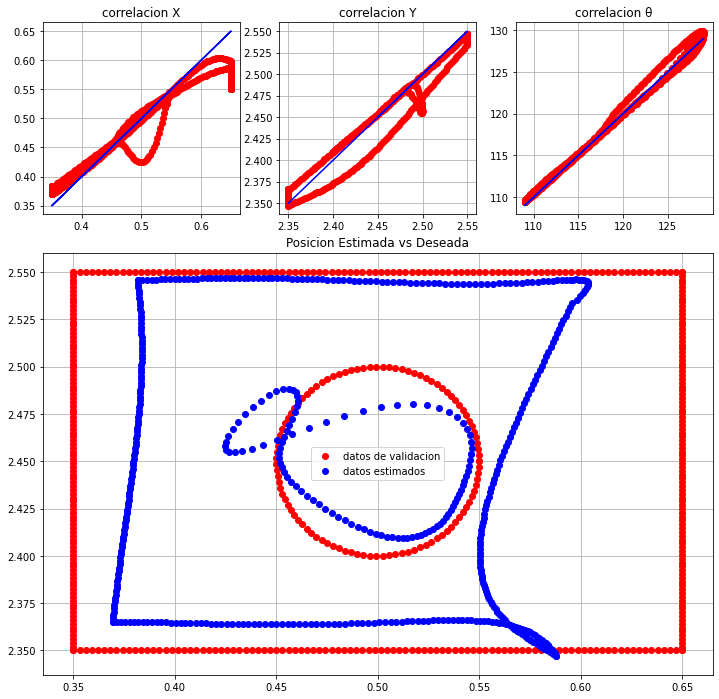


Red numero 36

capas ocultas: (5, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [1.61586996e-03 2.13263902e-04 3.32634420e-01]
MAE posicion:  [0.03138918 0.01187697 0.50030978]
RMSE posicion:  [0.04019789 0.01460356 0.57674468]

MSE 2D posicion:  0.0018291338620597
RMSE 2D posicion:  0.04276837455480042



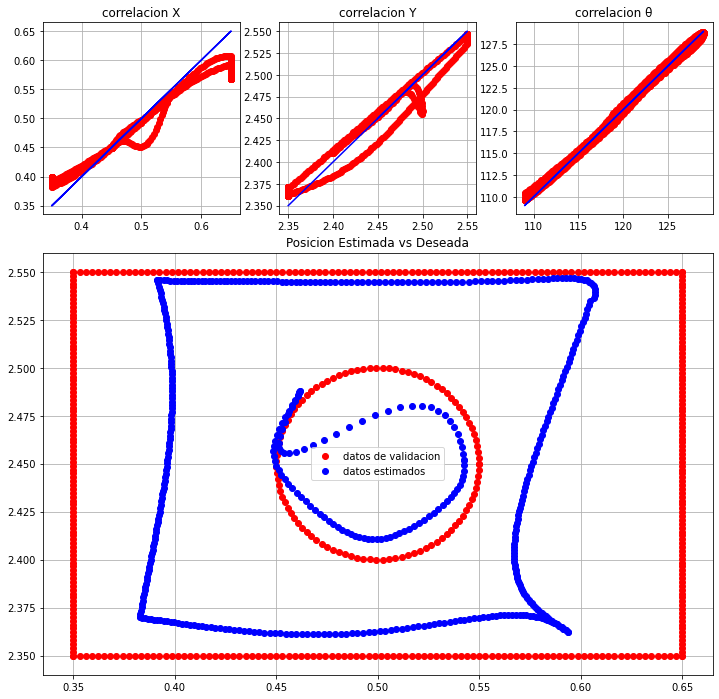


Red numero 18

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [9.53421029e-04 1.78526877e-04 3.31812450e-01]
MAE posicion:  [0.02198174 0.01134826 0.52127611]
RMSE posicion:  [0.03087752 0.0133614  0.57603164]

MSE 2D posicion:  0.0011319479062298304
RMSE 2D posicion:  0.03364443351031238



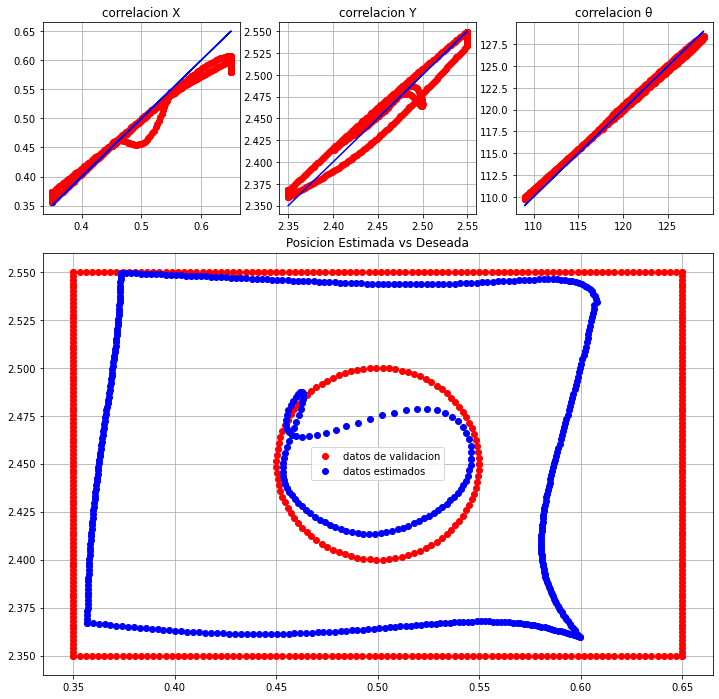


Red numero 57

capas ocultas: (10, 5)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

MSE posicion:  [3.00548036e-04 3.81482411e-04 6.64644248e-01]
MAE posicion:  [0.01385118 0.01629822 0.69473153]
RMSE posicion:  [0.01733632 0.01953157 0.81525717]

MSE 2D posicion:  0.0006820304466344513
RMSE 2D posicion:  0.026115712638839696



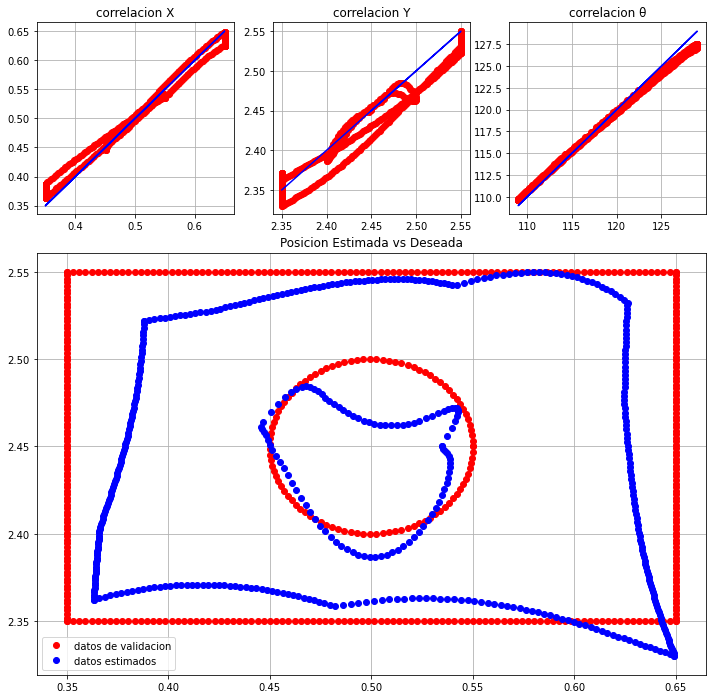


Red numero 84

capas ocultas: (10, 10)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [2.22016159e-03 2.85605560e-04 1.80017223e+00]
MAE posicion:  [0.03416192 0.01455308 1.07988509]
RMSE posicion:  [0.04711859 0.01689987 1.34170497]

MSE 2D posicion:  0.002505767150881398
RMSE 2D posicion:  0.05005763828709259



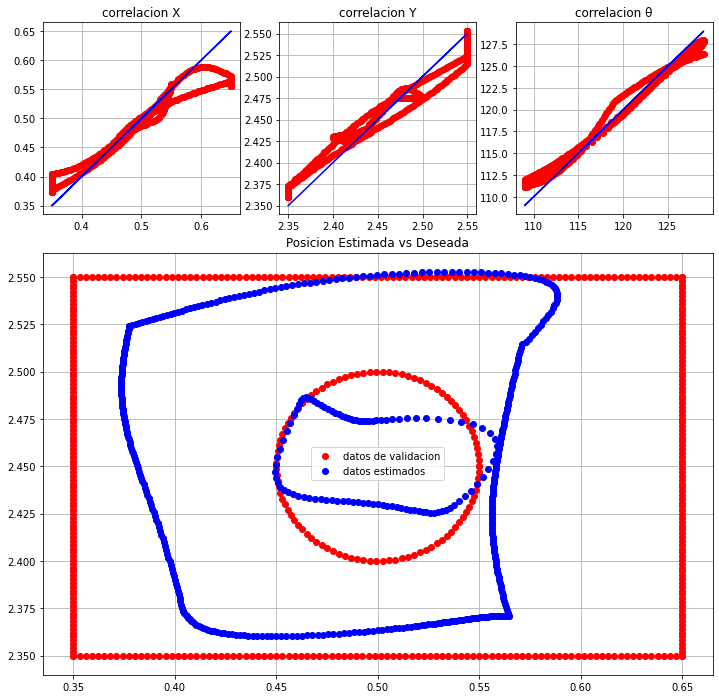


Red numero 90

capas ocultas: (5, 10, 5)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [2.09039179e-04 3.11294948e-04 1.36808153e+00]
MAE posicion:  [0.01001834 0.01389862 0.98285689]
RMSE posicion:  [0.01445819 0.01764355 1.16965018]

MSE 2D posicion:  0.000520334127782091
RMSE 2D posicion:  0.022810833561755058



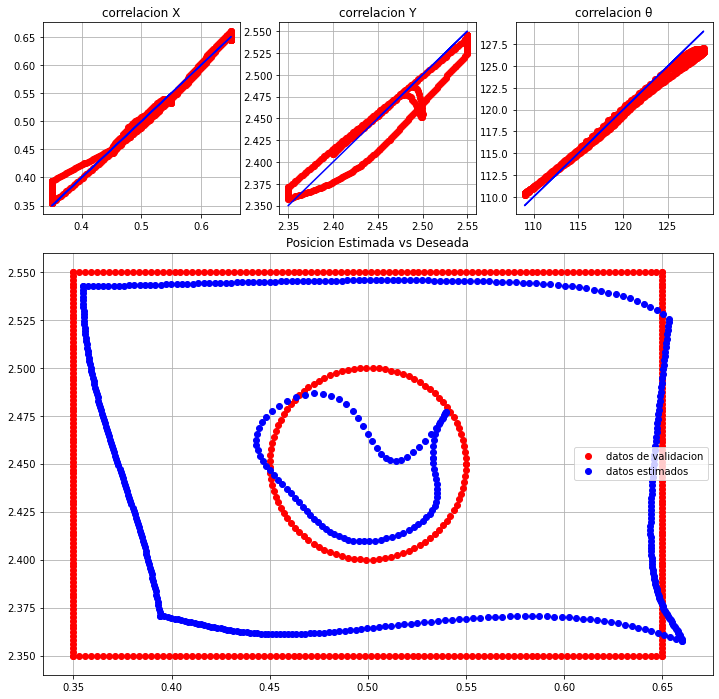


Red numero 21

capas ocultas: (10,)
solucionador: lbfgs
funcion de activacion: relu
tasa de aprendizaje: 0.1

MSE posicion:  [3.57445686e-04 3.35170776e-04 5.37512378e-01]
MAE posicion:  [0.01479985 0.01534493 0.65214143]
RMSE posicion:  [0.01890623 0.01830767 0.73315236]

MSE 2D posicion:  0.0006926164621009138
RMSE 2D posicion:  0.026317607453963474



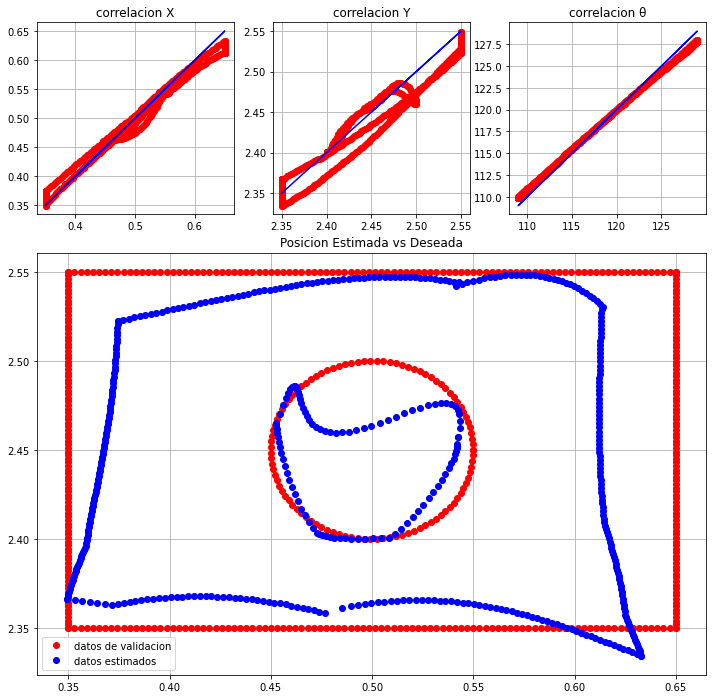


Red numero 0

capas ocultas: (5,)
solucionador: lbfgs
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [6.03145359e-04 2.40733539e-04 3.63605503e+00]
MAE posicion:  [0.01889259 0.01273553 1.55388964]
RMSE posicion:  [0.02455902 0.01551559 1.90684426]

MSE 2D posicion:  0.0008438788981067531
RMSE 2D posicion:  0.02904959376836022



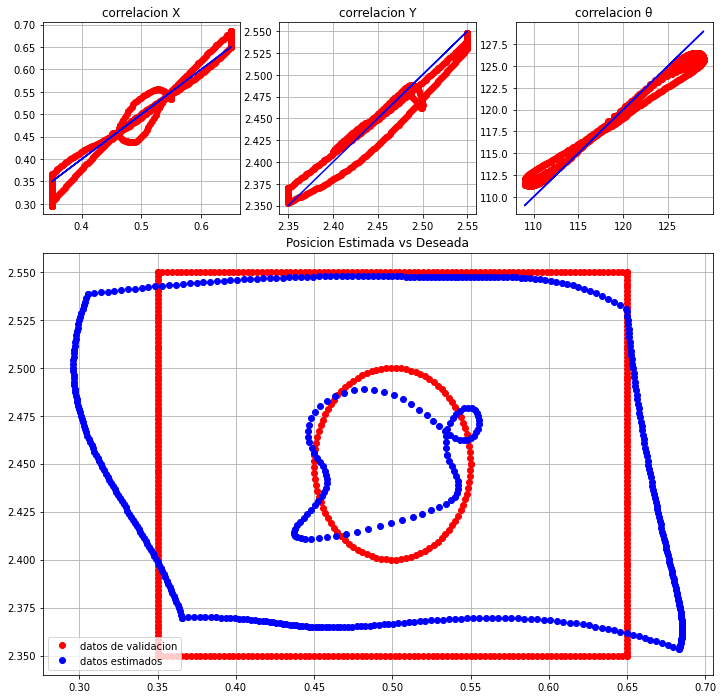


Red numero 16

capas ocultas: (5,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.01

MSE posicion:  [1.52539229e-03 6.22285240e-04 1.93743780e+00]
MAE posicion:  [0.02705563 0.0176223  1.04936417]
RMSE posicion:  [0.03905627 0.02494565 1.39191875]

MSE 2D posicion:  0.0021476775272363047
RMSE 2D posicion:  0.04634304184272224



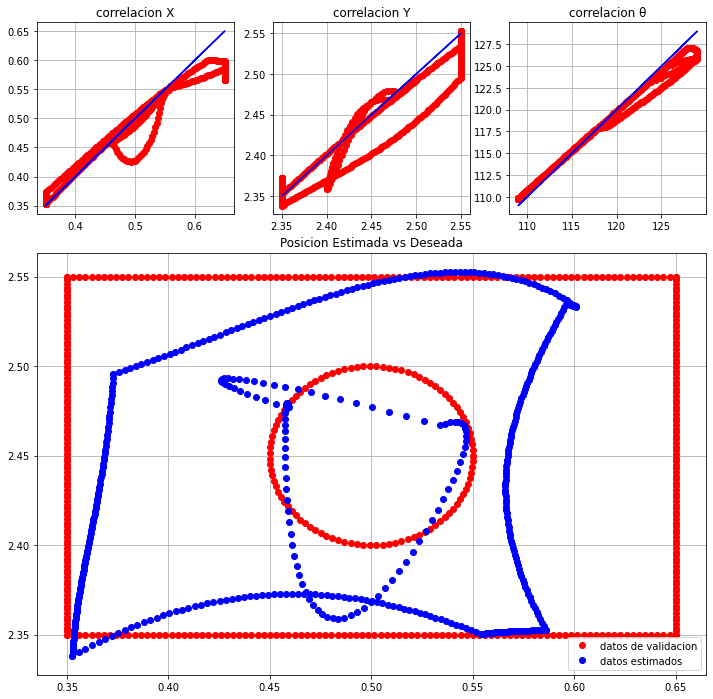


Red numero 33

capas ocultas: (10,)
solucionador: adam
funcion de activacion: relu
tasa de aprendizaje: 0.1

MSE posicion:  [7.95472863e-04 1.91336563e-04 1.40850861e+00]
MAE posicion:  [0.02254414 0.01168375 1.02799614]
RMSE posicion:  [0.02820413 0.01383245 1.18680605]

MSE 2D posicion:  0.0009868094258525268
RMSE 2D posicion:  0.03141352297741415



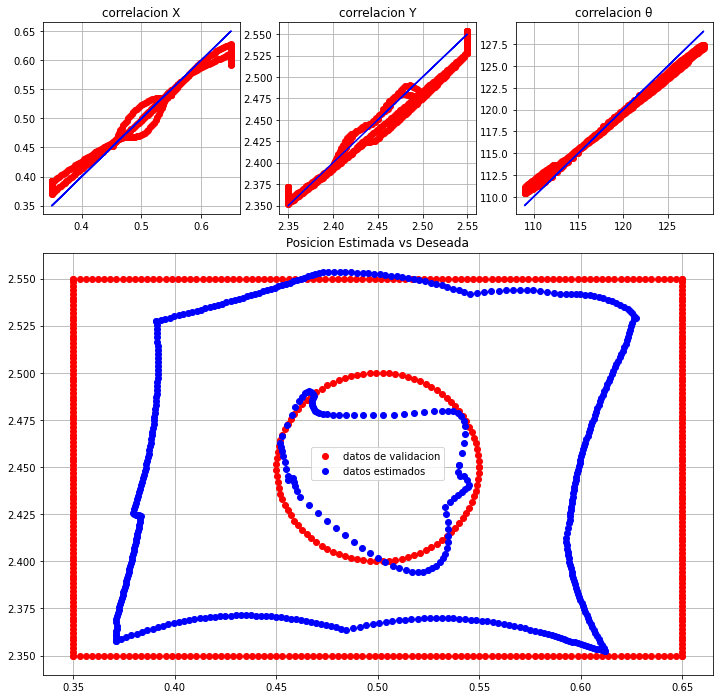


Red numero 30

capas ocultas: (10,)
solucionador: adam
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [9.27938801e-04 4.43701495e-04 1.29886541e+00]
MAE posicion:  [0.02247783 0.01663535 0.97541972]
RMSE posicion:  [0.03046209 0.02106422 1.13967777]

MSE 2D posicion:  0.0013716402962762554
RMSE 2D posicion:  0.03703566249274144



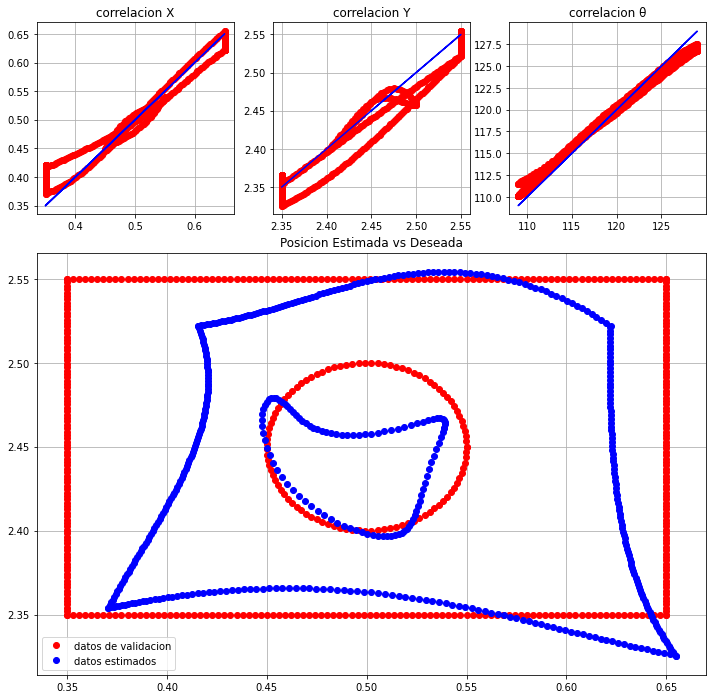


Red numero 6

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: tanh
tasa de aprendizaje: 0.1

MSE posicion:  [1.90136126e-03 5.44159945e-04 8.93925247e-01]
MAE posicion:  [0.0345013  0.01910063 0.76505452]
RMSE posicion:  [0.0436046  0.02332724 0.9454762 ]

MSE 2D posicion:  0.0024455212024125554
RMSE 2D posicion:  0.04945221129952184



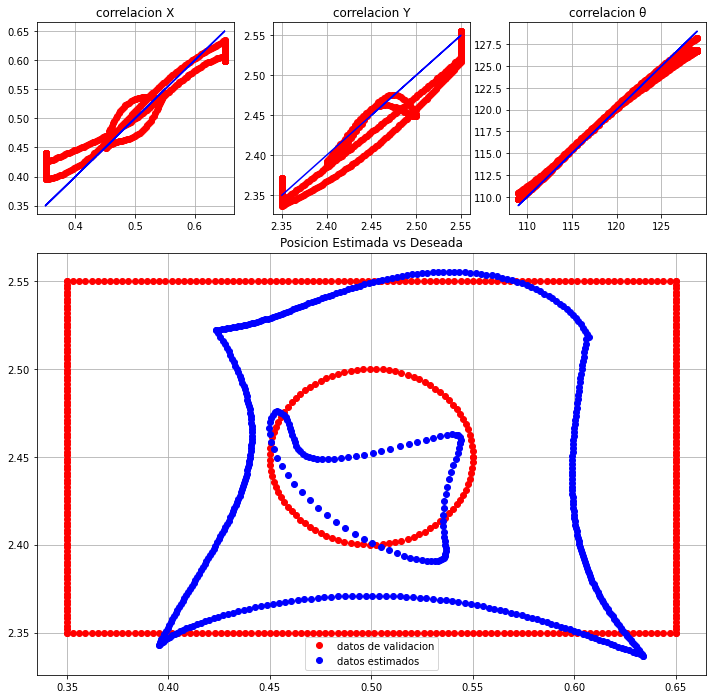


Red numero 9

capas ocultas: (5,)
solucionador: sgd
funcion de activacion: relu
tasa de aprendizaje: 0.1

MSE posicion:  [1.85884818e-03 1.39906316e-03 2.46591359e+00]
MAE posicion:  [0.02793206 0.03120106 1.12865207]
RMSE posicion:  [0.04311436 0.03740405 1.57032277]

MSE 2D posicion:  0.0032579113438068906
RMSE 2D posicion:  0.0570781161550282



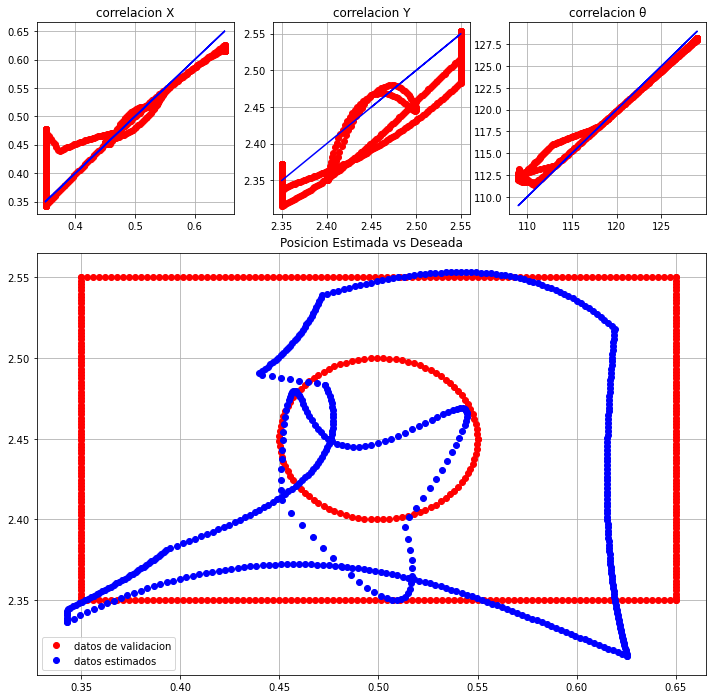

In [ ]:
for num_red,index in zip(list(range(len(anns))),index_list): #len(MLPNN)
  metrica = METRICS2[num_red]
  testx = XPTEST[num_red]
  calcx = XPCALC[num_red]
  param = params[index]
  print()
  print("Red numero",index)
  print()
  print("capas ocultas:", param["layer"])
  print("solucionador:", param["solver"])
  print("funcion de activacion:", param["activation"])
  print("tasa de aprendizaje:", param["lrate"])
  print()
  print("MSE posicion: ",metrica[0][0])
  print("MAE posicion: ",metrica[0][1])
  print("RMSE posicion: ",metrica[0][2])
  print()
  print("MSE 2D posicion: ",metrica[0][0][0]+metrica[0][0][1])
  print("RMSE 2D posicion: ",(metrica[0][0][0]+metrica[0][0][1])**0.5)
  print()

  fig = plt.figure(figsize=(12, 12))
  gs = fig.add_gridspec(3,3)
  ax1 = fig.add_subplot(gs[0, 0])
  ax2 = fig.add_subplot(gs[0, 1])
  ax3 = fig.add_subplot(gs[0, 2])
  ax7 = fig.add_subplot(gs[1::, :])

  ax7.plot(testx[:,0], testx[:,1], 'or', label='datos de validacion')
  ax7.plot(calcx[:,0], calcx[:,1], 'ob', label='datos estimados')
  ax7.set_title('Posicion Estimada vs Deseada')
  ax7.legend()
  ax7.grid()

  ax1.plot(testx[:,0], calcx[:,0], 'or')
  ax1.plot(testx[:,0],testx[:,0], 'b')
  ax1.set_title('correlacion X')
  ax1.grid()

  ax2.plot(testx[:,1], calcx[:,1], 'or')
  ax2.plot(testx[:,1],testx[:,1], 'b')
  ax2.set_title('correlacion Y')
  ax2.grid()

  ax3.plot(testx[:,2], calcx[:,2], 'or')
  ax3.plot(testx[:,2],testx[:,2], 'b')
  ax3.set_title('correlacion θ')
  ax3.grid()

  plt.show()

In [ ]:
METRICS2 = np.array(METRICS2)
data = {}
keys = params[0].keys()

for key in keys:
  data[key] = []

for index in index_list:
  for key in keys:
    data[key].append(params[index][key])

data["RMSE 2D"] = np.sqrt(METRICS2[:,0,0,0]+METRICS2[:,0,0,1])
data["RMSE θ"] = METRICS2[:,0,0,2]

df = pd.DataFrame(data, index = index_list)
df = df.sort_values(by=['RMSE 2D','RMSE θ'])
df

,activation,solver,layer,lrate,RMSE 2D,RMSE θ
72,tanh,lbfgs,"(10, 10)",0.10,0.022185,1.275665
90,tanh,lbfgs,"(5, 10, 5)",0.10,0.022811,1.368082
75,relu,lbfgs,"(10, 10)",0.10,0.023791,0.882994
57,relu,lbfgs,"(10, 5)",0.10,0.026116,0.664644
21,relu,lbfgs,"(10,)",0.10,0.026318,0.537512
0,tanh,lbfgs,"(5,)",0.10,0.029050,3.636055
33,relu,adam,"(10,)",0.10,0.031414,1.408509
18,tanh,lbfgs,"(10,)",0.10,0.033644,0.331812
30,tanh,adam,"(10,)",0.10,0.037036,1.298865
36,tanh,lbfgs,"(5, 5)",0.10,0.042768,0.332634
